# Model Results Analysis

Notes: 
losses were applied to annualPVkWhAC_degraded in the plug-in scenario in the '8/7 final run' twice. if doing analysis with annualPVkWhAC_degraded, divide by power station effective efficiency to get the real value!


In [1]:
import pandas as pd
import requests
import pvlib
import matplotlib.pyplot as plt  # for visualization
import matplotlib.ticker as mticker 
from matplotlib.ticker import MaxNLocator
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import math
import datetime
#from ast import literal_eval
import numpy as np
from statistics import median
from statistics import mean
from pprint import pprint
import seaborn as sns
import itertools




In [2]:
#variables - MAKE SURE THESE ARE IDENTICAL TO WHAT WAS USED IN THE MODEL
myNetworks = ['bowling green','borden','sunnyside','grasslands','fresh kills','park slope', 'fordham', 'central bronx']

directory = 'final data/sept11/'


In [6]:
#primary results (includes capex sensitivity and azimuth)
f = '1789195708'
d = 'primary/'

networkFile = f'{d}network_df_{f}'
resultsFile = f'{d}results_df_{f}'

In [7]:
#baseline sensitivity
# sf = '1787190579'
# sd = 'baseline/'

# # frequency
# sf = '1787149118'
# sd = 'frequency/'

# # frequency w/ azimuth sensitivity
# sf = '1787275543'
# sd = 'frequency_and_azimuth/'

# plug-in only - no power station - file includes all sensitivity combinations
sf = 'nobattery_20260821_001629'
sd = 'plugin_solar_only/'

s_networkFile = f'{sd}network_df_{sf}'
s_resultsFile = f'{sd}results_df_{sf}'

# Read Primary Data

In [8]:
network_df = pd.read_csv(f'results/{directory}{networkFile}.csv')
#network_df = network_df.drop(columns='Unnamed: 0')
network_df.head()

,network,load1W,load2W,load1RW,l1_annValResProgram_csrp,l1_annValResProgram_dlrp,l1_annValResTot,l1_annValPer_csrp,l1_annValPer_dlrp,l1_annValPer,l1_annTotVal,l2_annValResProgram_csrp,l2_annValResProgram_dlrp,l2_annValResTot,l2_annValPer_csrp,l2_annValPer_dlrp,l2_annValPer,l2_annTotVal
0,bowling green,93.807341,88.522211,[0. 0. 0. ... 2.02 1.7 1.14],49.4289,48.969,98.3979,2.19684,0.5441,2.74094,101.13884,8.845714,10.337143,19.182857,0.393143,0.114857,0.508000,19.690857
1,borden,93.807341,88.522211,[0. 0. 0. ... 2.02 1.7 1.14],49.4289,48.969,98.3979,2.19684,0.5441,2.74094,101.13884,10.337143,10.337143,20.674286,0.459429,0.114857,0.574286,21.248571
2,sunnyside,93.807341,88.522211,[0. 0. 0. ... 2.02 1.7 1.14],48.9690,48.969,97.9380,2.17640,0.5441,2.72050,100.65850,10.337143,10.337143,20.674286,0.459429,0.114857,0.574286,21.248571
3,grasslands,93.807341,88.522211,[0. 0. 0. ... 2.02 1.7 1.14],16.3230,48.969,65.2920,2.17640,0.5441,2.72050,68.01250,3.445714,10.337143,13.782857,0.459429,0.114857,0.574286,14.357143
4,fresh kills,93.807341,88.522211,[0. 0. 0. ... 2.02 1.7 1.14],14.9451,48.969,63.9141,1.99268,0.5441,2.53678,66.45088,3.304286,10.337143,13.641429,0.440571,0.114857,0.555429,14.196857


## Read Primary Model Results

In [9]:
results_df = pd.read_csv(f'results/{directory}/{resultsFile}.csv')

#drop the index if it was saved in the  file
#results_df = results_df.drop(columns='Unnamed: 0')
results_df.head()

,network,eventStart,dlrp_rate,csrp_rate,az,pvW,microinverter,batModel,batWh,batWhAC_80p,...,load1R_PBP_capexSensitivity,load1_NPV_capexSensitivity,load2_NPV_capexSensitivity,load1R_NPV_capexSensitivity,load1_IRR_capexSensitivity,load2_IRR_capexSensitivity,load1R_IRR_capexSensitivity,load1_LCOSS_capexSensitivity,load2_LCOSS_capexSensitivity,load1R_LCOSS_capexSensitivity
0,bowling green,11,18,18,180,0,True,Explorer 300 Plus,288.0,195.84,...,{-0.2: {'without_surplus': np.float64(6.811608...,{-0.2: {'without_surplus': np.float64(-426.765...,{-0.2: {'without_surplus': np.float64(-426.765...,{-0.2: {'without_surplus': np.float64(74.11715...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': nan, 'with_surplus'...",{-0.2: {'without_surplus': 0.07760642141103741...,{-0.2: {'without_surplus': np.float64(54.35780...,{-0.2: {'without_surplus': np.float64(54.35780...,{-0.2: {'without_surplus': np.float64(54.35780...
1,bowling green,11,18,18,180,50,True,Explorer 300 Plus,288.0,195.84,...,{-0.2: {'without_surplus': np.float64(7.215721...,{-0.2: {'without_surplus': np.float64(-566.663...,{-0.2: {'without_surplus': np.float64(-514.431...,{-0.2: {'without_surplus': np.float64(69.56179...,{-0.2: {'without_surplus': -0.3639773210883141...,{-0.2: {'without_surplus': -0.2833538010716439...,{-0.2: {'without_surplus': 0.06020815938711161...,{-0.2: {'without_surplus': np.float64(2.771590...,{-0.2: {'without_surplus': np.float64(1.663822...,{-0.2: {'without_surplus': np.float64(2.771590...
2,bowling green,11,18,18,180,100,True,Explorer 300 Plus,288.0,195.84,...,{-0.2: {'without_surplus': np.float64(6.907859...,{-0.2: {'without_surplus': np.float64(-546.187...,{-0.2: {'without_surplus': np.float64(-415.559...,{-0.2: {'without_surplus': np.float64(106.3106...,{-0.2: {'without_surplus': -0.2837101510167122...,{-0.2: {'without_surplus': -0.1738737961649895...,{-0.2: {'without_surplus': 0.07303675740957255...,{-0.2: {'without_surplus': np.float64(1.640464...,{-0.2: {'without_surplus': np.float64(0.857310...,{-0.2: {'without_surplus': np.float64(1.640464...
3,bowling green,11,18,18,180,0,False,Explorer 300 Plus,288.0,195.84,...,{-0.2: {'without_surplus': np.float64(9.922013...,{-0.2: {'without_surplus': np.float64(-579.667...,{-0.2: {'without_surplus': np.float64(-579.667...,{-0.2: {'without_surplus': np.float64(-78.7850...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': nan, 'with_surplus'...",{-0.2: {'without_surplus': -0.0241753765940666...,{-0.2: {'without_surplus': np.float64(70.75430...,{-0.2: {'without_surplus': np.float64(70.75430...,{-0.2: {'without_surplus': np.float64(70.75430...
4,bowling green,11,18,18,180,50,False,Explorer 300 Plus,288.0,195.84,...,{-0.2: {'without_surplus': np.float64(5.826735...,{-0.2: {'without_surplus': np.float64(-447.774...,{-0.2: {'without_surplus': np.float64(-447.619...,{-0.2: {'without_surplus': np.float64(183.9047...,{-0.2: {'without_surplus': -0.3862341263890267...,{-0.2: {'without_surplus': -0.3852227213978768...,{-0.2: {'without_surplus': 0.13006191939115513...,{-0.2: {'without_surplus': np.float64(14.15387...,{-0.2: {'without_surplus': np.float64(13.37761...,{-0.2: {'without_surplus': np.float64(14.15387...


In [10]:
# batWh_80p is the full amount, not 80%, but batWhAC_80p is correct
try:
    results_df['batWh']= results_df['batWh_80p']
    results_df = results_df.drop(columns=['batWh_80p'])
except:
    print(f"no batWh_80p column")

no batWh_80p column


In [11]:
results_df.describe()

,eventStart,dlrp_rate,csrp_rate,az,pvW,batWh,batWhAC_80p,effEff,capex,cycles,lifespan,workingLife,immediateEventAmt,baselineSensitivity
count,9040.000000,9040.000000,9040.00000,9040.0,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.0,9040.0
mean,15.625000,20.625000,15.00000,180.0,413.097345,1535.517451,1051.378062,0.859646,1410.696516,3718.584071,10.187902,9.325979,0.0,0.0
std,2.497011,3.389048,5.19644,0.0,327.824139,689.840661,468.098490,0.037393,550.707816,716.168423,1.962105,0.805666,0.0,0.0
min,11.000000,18.000000,6.00000,180.0,0.000000,204.000000,146.880000,0.800000,162.223750,2500.000000,6.849315,6.849315,0.0,0.0
25%,14.000000,18.000000,15.00000,180.0,150.000000,1024.000000,696.320000,0.850000,1007.670787,3000.000000,8.219178,8.219178,0.0,0.0
50%,16.000000,18.000000,18.00000,180.0,350.000000,1536.000000,1105.920000,0.850000,1405.565362,3500.000000,9.589041,9.589041,0.0,0.0
75%,16.750000,25.000000,18.00000,180.0,650.000000,2048.000000,1392.640000,0.900000,1808.707713,4000.000000,10.958904,10.000000,0.0,0.0
max,19.000000,25.000000,18.00000,180.0,1200.000000,3072.000000,2088.960000,0.900000,2885.764538,6000.000000,16.438356,10.000000,0.0,0.0


In [12]:
results_df.columns

Index(['network', 'eventStart', 'dlrp_rate', 'csrp_rate', 'az', 'pvW',
       'microinverter', 'batModel', 'batWh', 'batWhAC_80p', 'effEff', 'capex',
       'cycles', 'lifespan', 'workingLife', 'dailyPVWhAC_4M',
       'annualPVkWhDC_degraded', 'annualPVkWhAC_degraded', 'immediateEventAmt',
       'baselineSensitivity', 'csrpMaxFlex', 'csrpLoad1_flex',
       'csrpLoad2_flex', 'csrpLoad1replacement_flex', 'csrpLoad1Income',
       'csrpLoad2Income', 'csrpLoad1RIncome', 'csrpLoad1_baseline',
       'csrpLoad2_baseline', 'csrpLoad1replacement_baseline', 'dlrpMaxFlex',
       'dlrpLoad1_flex', 'dlrpLoad2_flex', 'dlrpLoad1replacement_flex',
       'dlrpLoad1Income', 'dlrpLoad2Income', 'dlrpLoad1RIncome',
       'dlrpLoad1_baseline', 'dlrpLoad2_baseline',
       'dlrpLoad1replacement_baseline', 'annDRIncomeLoad1', 'annDRIncomeLoad2',
       'annDRIncomeLoad1R', 'gridValue_load1', 'gridValue_load2',
       'gridValue_load1R', 'load1_PBP_capexSensitivity',
       'load2_PBP_capexSensitivity',

In [13]:
#these are the columns with lists in them
strToList = ['dailyPVWhAC_4M','annualPVkWhDC_degraded','annualPVkWhAC_degraded','csrpMaxFlex',
             'csrpLoad1Income', 'csrpLoad2Income', 'csrpLoad1RIncome','dlrpMaxFlex',
             'csrpLoad1_flex','csrpLoad2_flex','csrpLoad1replacement_flex',
             'dlrpLoad1_flex','dlrpLoad2_flex','dlrpLoad1replacement_flex',
             'dlrpLoad1Income','dlrpLoad2Income', 'dlrpLoad1RIncome', 'annDRIncomeLoad1',
             'annDRIncomeLoad2', 'annDRIncomeLoad1R']

#these are the columns with dictionaries in them
strToDict =[ 'gridValue_load1','gridValue_load2','gridValue_load1R',
             'load1_PBP_capexSensitivity', 'load2_PBP_capexSensitivity', 'load1R_PBP_capexSensitivity',
             'load1_NPV_capexSensitivity','load2_NPV_capexSensitivity', 'load1R_NPV_capexSensitivity',
             'load1_IRR_capexSensitivity', 'load2_IRR_capexSensitivity', 'load1R_IRR_capexSensitivity',
             'load1_LCOSS_capexSensitivity', 'load2_LCOSS_capexSensitivity', 'load1R_LCOSS_capexSensitivity']

In [14]:
safe_env = {"np": np, "nan": np.nan}
for c in strToList:
    results_df[c] = results_df[c].apply(lambda x: eval(str(x),safe_env))


In [15]:
for c in strToDict:
    results_df[c] = results_df[c].apply(lambda x: eval(str(x),safe_env))

In [16]:
# Parse only the capex-sensitivity columns
LOADS = ["load1", "load2", "load1R"]
CAPEX_SENS_METRICS = ["NPV", "PBP", "IRR", "LCOSS"]

# gridValue_* stays as-is -- raw input, not derived from capexSensitivity
strToDict = ['gridValue_load1', 'gridValue_load2', 'gridValue_load1R']

capexSensCols = [f"{load}_{metric}_capexSensitivity" for load in LOADS for metric in CAPEX_SENS_METRICS]

safe_env = {"np": np, "nan": np.nan}
for c in strToDict:
    results_df[c] = results_df[c].apply(lambda x: eval(str(x), safe_env))
for c in capexSensCols:
    results_df[c] = results_df[c].apply(lambda x: eval(str(x), safe_env))

# Rebuild the standalone {load}_{metric} dict columns from the capexMultiplier=0.0 entry,
# so all existing analysis code (extract_metric, analyze_df, etc.) keeps working unchanged.
for load in LOADS:
    for metric in CAPEX_SENS_METRICS:
        sens_col = f"{load}_{metric}_capexSensitivity"
        standalone_col = f"{load}_{metric}"
        results_df[standalone_col] = results_df[sens_col].apply(
            lambda d: d.get(0.0, {}) if isinstance(d, dict) else {}
        )

# sanity check -- each rebuilt column should hold a {'without_surplus':.., 'with_surplus':..} dict
print(results_df[[f"load1_{m}" for m in CAPEX_SENS_METRICS]].iloc[0])
results_df[[f"load1_{m}" for m in CAPEX_SENS_METRICS]].head()

load1_NPV      {'without_surplus': -530.7386282554827, 'with_...
load1_PBP      {'without_surplus': -371.35129819897304, 'with...
load1_IRR          {'without_surplus': nan, 'with_surplus': nan}
load1_LCOSS    {'without_surplus': 65.50741856395263, 'with_s...
Name: 0, dtype: object


,load1_NPV,load1_PBP,load1_IRR,load1_LCOSS
0,"{'without_surplus': -530.7386282554827, 'with_...","{'without_surplus': -371.35129819897304, 'with...","{'without_surplus': nan, 'with_surplus': nan}","{'without_surplus': 65.50741856395263, 'with_s..."
1,"{'without_surplus': -721.5425618052446, 'with_...","{'without_surplus': 118.10421093618149, 'with_...","{'without_surplus': -0.38585812479257586, 'wit...","{'without_surplus': 3.3827325220956905, 'with_..."
2,"{'without_surplus': -710.8650179912145, 'with_...","{'without_surplus': 58.83862499300382, 'with_s...","{'without_surplus': -0.31000340551137917, 'wit...","{'without_surplus': 2.0075368679109205, 'with_..."
3,"{'without_surplus': -683.6408397696362, 'with_...","{'without_surplus': -25.3096405602677, 'with_s...","{'without_surplus': nan, 'with_surplus': nan}","{'without_surplus': 81.90391444380123, 'with_s..."
4,"{'without_surplus': -569.3857338724857, 'with_...","{'without_surplus': 127.98084373162948, 'with_...","{'without_surplus': -0.4076301893591881, 'with...","{'without_surplus': 17.323451949231206, 'with_..."


In [17]:
results_df.describe()

,eventStart,dlrp_rate,csrp_rate,az,pvW,batWh,batWhAC_80p,effEff,capex,cycles,lifespan,workingLife,immediateEventAmt,baselineSensitivity
count,9040.000000,9040.000000,9040.00000,9040.0,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.000000,9040.0,9040.0
mean,15.625000,20.625000,15.00000,180.0,413.097345,1535.517451,1051.378062,0.859646,1410.696516,3718.584071,10.187902,9.325979,0.0,0.0
std,2.497011,3.389048,5.19644,0.0,327.824139,689.840661,468.098490,0.037393,550.707816,716.168423,1.962105,0.805666,0.0,0.0
min,11.000000,18.000000,6.00000,180.0,0.000000,204.000000,146.880000,0.800000,162.223750,2500.000000,6.849315,6.849315,0.0,0.0
25%,14.000000,18.000000,15.00000,180.0,150.000000,1024.000000,696.320000,0.850000,1007.670787,3000.000000,8.219178,8.219178,0.0,0.0
50%,16.000000,18.000000,18.00000,180.0,350.000000,1536.000000,1105.920000,0.850000,1405.565362,3500.000000,9.589041,9.589041,0.0,0.0
75%,16.750000,25.000000,18.00000,180.0,650.000000,2048.000000,1392.640000,0.900000,1808.707713,4000.000000,10.958904,10.000000,0.0,0.0
max,19.000000,25.000000,18.00000,180.0,1200.000000,3072.000000,2088.960000,0.900000,2885.764538,6000.000000,16.438356,10.000000,0.0,0.0


In [18]:
results_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 9040 entries, 0 to 9039
Data columns (total 70 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   network                        9040 non-null   str    
 1   eventStart                     9040 non-null   int64  
 2   dlrp_rate                      9040 non-null   int64  
 3   csrp_rate                      9040 non-null   int64  
 4   az                             9040 non-null   int64  
 5   pvW                            9040 non-null   int64  
 6   microinverter                  9040 non-null   bool   
 7   batModel                       9040 non-null   str    
 8   batWh                          9040 non-null   float64
 9   batWhAC_80p                    9040 non-null   float64
 10  effEff                         9040 non-null   float64
 11  capex                          9040 non-null   float64
 12  cycles                         9040 non-null   int64  
 13 

In [19]:
# test DLRP value
loc = 5
print('CSRP')
print(f'rate:{results_df.iloc[loc]['csrp_rate']}')
print(f'flex: {results_df.iloc[loc]['csrpLoad1_flex'][0]}')
print(f'model income:{results_df.iloc[loc]['csrpLoad1Income'][0]}')
cEx = (results_df.iloc[loc]['csrpLoad1_flex'][0] * 5 * results_df.iloc[loc]['csrp_rate']) + (results_df.iloc[loc]['csrpLoad1_flex'][0] * 4 * 4)
print(f'expected income:{cEx}')

print('\nDLRP')
print(f'rate:{results_df.iloc[loc]['dlrp_rate']}')
print(f'flex:{results_df.iloc[loc]['dlrpLoad1_flex'][0]}')
print(f'model:{results_df.iloc[loc]['dlrpLoad1Income'][0]}')
dEx = (results_df.iloc[loc]['dlrpLoad1_flex'][0] * 5 * results_df.iloc[loc]['dlrp_rate']) + (results_df.iloc[loc]['dlrpLoad1_flex'][0] * 4)
print(f'expected income:{dEx}')

print('\nTotal')
print(f'model:{results_df.iloc[loc]['annDRIncomeLoad1'][0]}')
print(f'expected:{cEx + dEx}') 

CSRP
rate:18
flex: 0.09338886726462259
model income:9.899219930049995
expected income:9.899219930049995

DLRP
rate:18
flex:0.05851568749780911
model:5.500474624794057
expected income:5.500474624794057

Total
model:15.399694554844052
expected:15.399694554844052


In [20]:
# get cost of storage
storage_results_df = results_df[results_df['pvW']==0]
storage_results_df['$/kWh'] = storage_results_df['capex']/(storage_results_df['batWh'] * 0.001)
storage_results_df['$/kWh'].describe()

count     720.000000
mean      749.034598
std       344.378737
min       419.638808
25%       503.483793
50%       652.337640
75%       796.892700
max      1808.874957
Name: $/kWh, dtype: float64

### Read in sensitivity data

In [7]:
s_results_df = pd.read_csv(f'results/{directory}{s_resultsFile}.csv')

# batWh_80p is the full amount, not 80%, but batWhAC_80p is correct
try:
    s_results_df['batWh']= s_results_df['batWh_80p']
    s_results_df = s_results_df.drop(columns=['batWh_80p'])
except:
    print(f"no batWh_80p column")

safe_env = {"np": np, "nan": np.nan}
for c in strToList:
    s_results_df[c] = s_results_df[c].apply(lambda x: eval(str(x),safe_env))

for c in strToDict:
    s_results_df[c] = s_results_df[c].apply(lambda x: eval(str(x),safe_env))

# Parse only the capex-sensitivity columns
LOADS = ["load1", "load2", "load1R"]
CAPEX_SENS_METRICS = ["NPV", "PBP", "IRR", "LCOSS"]

# gridValue_* stays as-is -- raw input, not derived from capexSensitivity
strToDict = ['gridValue_load1', 'gridValue_load2', 'gridValue_load1R']

capexSensCols = [f"{load}_{metric}_capexSensitivity" for load in LOADS for metric in CAPEX_SENS_METRICS]

safe_env = {"np": np, "nan": np.nan}
for c in strToDict:
    s_results_df[c] = s_results_df[c].apply(lambda x: eval(str(x), safe_env))
for c in capexSensCols:
    s_results_df[c] = s_results_df[c].apply(lambda x: eval(str(x), safe_env))

# Rebuild the standalone {load}_{metric} dict columns from the capexMultiplier=0.0 entry,
# so all existing analysis code (extract_metric, analyze_df, etc.) keeps working unchanged.
for load in LOADS:
    for metric in CAPEX_SENS_METRICS:
        sens_col = f"{load}_{metric}_capexSensitivity"
        standalone_col = f"{load}_{metric}"
        s_results_df[standalone_col] = s_results_df[sens_col].apply(
            lambda d: d.get(0.0, {}) if isinstance(d, dict) else {}
        )

# sanity check -- each rebuilt column should hold a {'without_surplus':.., 'with_surplus':..} dict
print(s_results_df[[f"load1_{m}" for m in CAPEX_SENS_METRICS]].iloc[0])
s_results_df[[f"load1_{m}" for m in CAPEX_SENS_METRICS]].head()

no batWh_80p column
load1_NPV      {'without_surplus': -263.8747481546156, 'with_...
load1_PBP      {'without_surplus': 47.96894590537271, 'with_s...
load1_IRR      {'without_surplus': -0.24201262205839158, 'wit...
load1_LCOSS    {'without_surplus': 1.6709627645651102, 'with_...
Name: 0, dtype: object


,load1_NPV,load1_PBP,load1_IRR,load1_LCOSS
0,"{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
1,"{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
2,"{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
3,"{'without_surplus': -261.5253201719787, 'with_...","{'without_surplus': 46.1281798032164, 'with_su...","{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_..."
4,"{'without_surplus': -261.5253201719787, 'with_...","{'without_surplus': 46.1281798032164, 'with_su...","{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_..."


In [8]:
s_results_df.head()

,network,eventStart,dlrp_rate,csrp_rate,az,pvW,microinverter,batModel,batWh,batWhAC_80p,...,load1_IRR,load1_LCOSS,load2_NPV,load2_PBP,load2_IRR,load2_LCOSS,load1R_NPV,load1R_PBP,load1R_IRR,load1R_LCOSS
0,bowling green,11,18,18,90,50,True,NaN,0,0,...,"{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_...","{'without_surplus': -224.11606984172997, 'with...","{'without_surplus': 28.662105435162196, 'with_...","{'without_surplus': -0.17833734124898915, 'wit...","{'without_surplus': 0.9978356869544973, 'with_...","{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
1,bowling green,11,18,18,90,50,True,NaN,0,0,...,"{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_...","{'without_surplus': -224.11606984172997, 'with...","{'without_surplus': 28.662105435162196, 'with_...","{'without_surplus': -0.17833734124898915, 'wit...","{'without_surplus': 0.9978356869544973, 'with_...","{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
2,bowling green,11,18,18,90,50,True,NaN,0,0,...,"{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_...","{'without_surplus': -224.11606984172997, 'with...","{'without_surplus': 28.662105435162196, 'with_...","{'without_surplus': -0.17833734124898915, 'wit...","{'without_surplus': 0.9978356869544973, 'with_...","{'without_surplus': -263.8747481546156, 'with_...","{'without_surplus': 47.96894590537271, 'with_s...","{'without_surplus': -0.24201262205839158, 'wit...","{'without_surplus': 1.6709627645651102, 'with_..."
3,bowling green,11,18,18,180,50,True,NaN,0,0,...,"{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_...","{'without_surplus': -202.76496820420238, 'with...","{'without_surplus': 23.565861425707105, 'with_...","{'without_surplus': -0.15098224252462394, 'wit...","{'without_surplus': 0.8204162662644908, 'with_...","{'without_surplus': -261.5253201719787, 'with_...","{'without_surplus': 46.1281798032164, 'with_su...","{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_..."
4,bowling green,11,18,18,180,50,True,NaN,0,0,...,"{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_...","{'without_surplus': -202.76496820420238, 'with...","{'without_surplus': 23.565861425707105, 'with_...","{'without_surplus': -0.15098224252462394, 'wit...","{'without_surplus': 0.8204162662644908, 'with_...","{'without_surplus': -261.5253201719787, 'with_...","{'without_surplus': 46.1281798032164, 'with_su...","{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_..."


In [11]:
s_results_df['$/W'] = s_results_df['capex']/s_results_df['pvW']

In [12]:
s_results_df['$/Wh'] = s_results_df['capex']/s_results_df['batWh']

### Solar-only analysis

only needed for solar only stuff

In [86]:
s_results_south_df =s_results_df[(s_results_df['az']==180)&(s_results_df['baselineSensitivity']==0)]#&(s_results_df['network']=='bowling green')&(s_results_df['baselineSensitivity']==0)][['capex','pvW','$/Wh']]#.describe()

In [87]:

for l in ['load1','load2','load1R']:
    wS = []
    wSA = []
    for s in s_results_south_df[f'{l}_NPV']:
        wS.append(s['with_surplus'])
        wSA.append(s['with_surplus']+62.75)
    s_results_south_df[f'{l}_NPV_surplus']=wS
    s_results_south_df[f'{l}_NPV_surplus_adjusted']=wSA

    wS = []
    wSA = []
    for s in s_results_south_df[f'{l}_PBP']:
        wS.append(s['with_surplus'])
        wSA.append(s['with_surplus']+62.75)
    s_results_south_df[f'{l}_PBP_surplus']=wS
    s_results_south_df[f'{l}_PBP_surplus_adjusted']=wSA

In [89]:
s_results_south_df[['capex','pvW','load1_NPV_surplus','load1_PBP_surplus','load1_NPV_surplus_adjusted','load1_PBP_surplus_adjusted']].describe()

,capex,pvW,load1_NPV_surplus,load1_PBP_surplus,load1_NPV_surplus_adjusted,load1_PBP_surplus_adjusted
count,192.000000,192.00000,192.000000,192.000000,192.000000,192.000000
mean,886.275162,625.00000,1174.029787,4.751662,1236.779787,67.501662
std,340.030530,347.01419,677.015565,3.056752,677.015565,3.056752
min,322.847037,50.00000,-164.020375,3.355100,-101.270375,66.105100
25%,604.561100,337.50000,634.041878,3.445511,696.791878,66.195511
50%,886.275163,625.00000,1400.801708,3.646673,1463.551708,66.396673
75%,1167.989225,912.50000,1786.677902,4.287570,1849.427902,67.037570
max,1449.703288,1200.00000,1901.245510,17.817143,1963.995510,80.567143


In [90]:
s_results_south_df[(s_results_south_df['load1_NPV_surplus_adjusted']>=0)][['capex','pvW','load1_NPV_surplus','load1_PBP_surplus','load1_NPV_surplus_adjusted','load1_PBP_surplus_adjusted']].describe()

,capex,pvW,load1_NPV_surplus,load1_PBP_surplus,load1_NPV_surplus_adjusted,load1_PBP_surplus_adjusted
count,184.000000,184.000000,184.000000,184.000000,184.000000,184.000000
mean,910.772037,650.000000,1232.205881,4.183598,1294.955881,66.933598
std,325.874507,332.567426,629.854256,1.401838,629.854256,1.401838
min,371.840787,100.000000,-25.483816,3.355100,37.266184,66.105100
25%,616.809538,350.000000,668.622138,3.422239,731.372138,66.172239
50%,910.772038,650.000000,1456.140111,3.627775,1518.890111,66.377775
75%,1204.734537,950.000000,1813.256041,4.205976,1876.006041,66.955976
max,1449.703288,1200.000000,1901.245510,9.410176,1963.995510,72.160176


In [98]:
s_results_south_df[(s_results_south_df['load1_NPV_surplus_adjusted']>=0)&(s_results_south_df['pvW']==100)][['capex','pvW','load1_NPV_surplus','load1_PBP_surplus','load1_NPV_surplus_adjusted','load1_PBP_surplus_adjusted']]#.describe()

,capex,pvW,load1_NPV_surplus,load1_PBP_surplus,load1_NPV_surplus_adjusted,load1_PBP_surplus_adjusted
12,371.840787,100,-25.483816,9.410176,37.266184,72.160176
228,371.840787,100,-25.483816,9.410176,37.266184,72.160176
444,371.840787,100,-25.483816,9.410176,37.266184,72.160176
660,371.840787,100,-25.483816,9.410176,37.266184,72.160176
876,371.840787,100,-25.483816,9.410176,37.266184,72.160176
1092,371.840787,100,-25.483816,9.410176,37.266184,72.160176
1308,371.840787,100,-25.483816,9.410176,37.266184,72.160176
1524,371.840787,100,-25.483816,9.410176,37.266184,72.160176


In [84]:
s_results_south_df[(s_results_south_df['load1_NPV_surplus']>=0)&(s_results_south_df['pvW']==1200)][['capex','pvW','load1_NPV_surplus','load1_PBP_surplus']]#.describe()

,capex,pvW,load1_NPV_surplus,load1_PBP_surplus
210,1449.703288,1200,1901.24551,3.792067
426,1449.703288,1200,1901.24551,3.792067
642,1449.703288,1200,1901.24551,3.792067
858,1449.703288,1200,1901.24551,3.792067
1074,1449.703288,1200,1901.24551,3.792067
1290,1449.703288,1200,1901.24551,3.792067
1506,1449.703288,1200,1901.24551,3.792067
1722,1449.703288,1200,1901.24551,3.792067


In [78]:
s_results_south_df[(s_results_south_df['load1_PBP_surplus']<=10)&(s_results_south_df['network']=='park slope')][['capex','pvW','load1_NPV_surplus','load1_PBP_surplus']].describe()

,capex,pvW,load1_NPV_surplus,load1_PBP_surplus
count,23.000000,23.000000,23.000000,23.000000
mean,910.772038,650.000000,1232.205881,4.183598
std,332.291780,339.116499,642.257641,1.429443
min,371.840787,100.000000,-25.483816,3.355100
25%,641.306413,375.000000,737.622720,3.437753
50%,910.772038,650.000000,1456.140111,3.627775
75%,1180.237662,925.000000,1795.537282,4.084729
max,1449.703288,1200.000000,1901.245510,9.410176


In [75]:
s_results_south_df.head()

,network,eventStart,dlrp_rate,csrp_rate,az,pvW,microinverter,batModel,batWh,batWhAC_80p,...,load1R_IRR,load1R_LCOSS,$/Wh,$/W,load1_NPV_surplus,load2_NPV_surplus,load1R_NPV_surplus,load1_PBP_surplus,load2_PBP_surplus,load1R_PBP_surplus
3,bowling green,11,18,18,180,50,True,NaN,0,0,...,"{'without_surplus': -0.2374344423413277, 'with...","{'without_surplus': 1.6070110104456339, 'with_...",inf,6.456941,-164.020375,-164.020375,-164.020375,17.817143,17.817143,17.817143
12,bowling green,11,18,18,180,100,True,NaN,0,0,...,"{'without_surplus': -0.17133873313665393, 'wit...","{'without_surplus': 0.9114899086199567, 'with_...",inf,3.718408,-25.483816,-25.483816,-25.483816,9.410176,9.410176,9.410176
21,bowling green,11,18,18,180,150,True,NaN,0,0,...,"{'without_surplus': -0.13756999045610435, 'wit...","{'without_surplus': 0.6959996358565523, 'with_...",inf,2.805564,113.695286,113.695286,113.695286,6.900874,6.900874,6.900874
30,bowling green,11,18,18,180,200,True,NaN,0,0,...,"{'without_surplus': -0.1169049689173699, 'with...","{'without_surplus': 0.591947423293952, 'with_s...",inf,2.349141,252.793807,252.793807,252.793807,5.698921,5.698921,5.698921
39,bowling green,11,18,18,180,250,True,NaN,0,0,...,"{'without_surplus': -0.1038084533810616, 'with...","{'without_surplus': 0.533313779584161, 'with_s...",inf,2.075288,391.681995,391.681995,391.681995,4.994606,4.994606,4.994606


## Read in network data

In [21]:
# read in network data to dataframe
networks_df = pd.read_csv('data/conEdNetworks2026.csv')

display(networks_df.head())

,borough,network,start time,end time,tier
0,bronx,central bronx,19:00,23:00,2
1,bronx,fordham,16:00,20:00,2
2,bronx,northeast bronx,16:00,20:00,1
3,bronx,riverdale,16:00,20:00,1
4,bronx,southeast bronx,16:00,20:00,1


In [22]:
#returns the network info for a given network
#args: network name
def getNetworkInfo(networkName):
    return networks_df.loc[networks_df['network']== networkName]

#returns the tier for a given item in the network info list
#args: network name
def getDLRPrate(networkName):
    n = getNetworkInfo(networkName)
    t = n['tier'].iloc[0]
    #tier 2 networks pay at a higher rate
    if t == 1:
        return 18
    else:
        return 25
    
#returns the borough for a given item in the network info list
#args: network name
def getCSRPrate(networkName):
    n = getNetworkInfo(networkName)
    t = n['borough'].iloc[0]
    #westchester and staten island pay at a lower rate
    if t not in ['westchester','staten island']:
        return 18
    else:
        return 6

#args: network name
def getTotalRate(networkName):
    return getDLRPrate(networkName) + getCSRPrate(networkName)
    
#returns borough name
#args: network name
def getBorough(networkName):
    n = getNetworkInfo(networkName)
    return n['borough'].iloc[0]

#returns event start time
#args: network name
def getStartTime(networkName):
    n = getNetworkInfo(networkName)
    return int(n['start time'].iloc[0].split(":")[0])

## Read Hardware Data

In [23]:
hardware_df = pd.read_csv('data/PowerStations_LiFePo4_June29_2026.csv')


# Analyze Results

In [34]:
# all results
analyze_df = results_df[['network','pvW','az','microinverter','batModel', 'batWh', 'batWhAC_80p','capex',
                         'workingLife','csrpLoad1_flex','csrpLoad2_flex','csrpLoad1replacement_flex',
                         'dlrpLoad1_flex','dlrpLoad2_flex','dlrpLoad1replacement_flex',
                         'gridValue_load1','gridValue_load2','gridValue_load1R',
                         'load1_NPV', 'load2_NPV','load1R_NPV',
                         'load1_IRR', 'load2_IRR','load1R_IRR',
                         'load1_PBP', 'load2_PBP', 'load1R_PBP',
                         'load1_LCOSS','load2_LCOSS','load1R_LCOSS',
                         'load1_PBP_capexSensitivity', 'load2_PBP_capexSensitivity',
                         'load1R_PBP_capexSensitivity', 'load1_NPV_capexSensitivity',
                         'load2_NPV_capexSensitivity', 'load1R_NPV_capexSensitivity',
                         'load1_IRR_capexSensitivity', 'load2_IRR_capexSensitivity',
                         'load1R_IRR_capexSensitivity', 'load1_LCOSS_capexSensitivity',
                         'load2_LCOSS_capexSensitivity', 'load1R_LCOSS_capexSensitivity']]

# results with plug-in solar
analyze_plugin_df = analyze_df[analyze_df['microinverter']== True]

# results without plug-in solar
analyze_offgrid_df = analyze_df[analyze_df['microinverter']== False]

In [35]:
def safe_hist(ax, vals, bins=40, **kwargs):
    """ax.hist() that tolerates degenerate or near-degenerate (float-precision-limited) ranges."""
    vals = clean_finite(vals)
    if len(vals) == 0:
        ax.text(0.5, 0.5, "no data", ha="center", va="center", transform=ax.transAxes, fontsize=8, color="gray")
        return

    vmin, vmax = float(vals.min()), float(vals.max())
    scale = max(abs(vmin), abs(vmax), 1.0)

    # relative range too small for 41 distinct float64 bin edges -> don't even try np.histogram
    if (vmax - vmin) < scale * 1e-8:
        ax.axvline(vals.mean(), color="steelblue", linewidth=2)
        ax.text(0.5, 0.9, f"n={len(vals)}, range≈{vmax - vmin:.2e}\nmean={vals.mean():.4g}",
                ha="center", transform=ax.transAxes, fontsize=6, color="gray")
        return

    # belt-and-suspenders: if hist() still complains (e.g. some other edge case), degrade bin count
    for b in (bins, 20, 10, 5, 1):
        try:
            ax.hist(vals, bins=b, **kwargs)
            return
        except ValueError:
            continue
    # last resort: shouldn't reach here, but never crash the whole grid
    ax.text(0.5, 0.5, "could not bin", ha="center", va="center", transform=ax.transAxes, fontsize=8, color="red")

In [36]:
LOADS = ["load1", "load2", "load1R"]
METRICS = ["NPV","IRR","PBP", "LCOSS","CAPEX"]

# Map each load to its own pair of flex columns (they're load-specific, not shared like csrpMaxFlex was)
LOAD_FLEX_MAP = {
    "load1":  ["csrpLoad1_flex", "dlrpLoad1_flex"],
    "load2":  ["csrpLoad2_flex", "dlrpLoad2_flex"],
    "load1R": ["csrpLoad1replacement_flex", "dlrpLoad1replacement_flex"],
}
FLEX_ROW_LABELS = ["csrp_flex", "dlrp_flex"]  # generic row labels; actual column resolved per load

SCALAR_METRICS = ["pvW", "batWh"]
VALUE_METRICS = ["pctDR"]
SURPLUS_KEY = "with_surplus"  # change to "without_surplus" to see the other case

UNITS = {
    "NPV": "$", "PBP": "years", "LCOSS": "$/kWh","IRR":"%",
    "csrp_flex": "kW", "dlrp_flex": "kW",
    "pvW": "W", "batWh": "Wh", "pctDR": "%","CAPEX":"$"
}

In [37]:
# Histogram grid: NPV, PBP, LCOSS, CSRP/DLRP flex, PV size, batWh, %DR value across 6 scenarios,
# filtered to rows where 0 <= PBP <= workingLife (genuinely favorable payback)


def extract_metric(df, load, metric, surplus_key=SURPLUS_KEY):
    if metric.lower() == "capex":
        return df[f"{metric.lower()}"]
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key))
    
# ann_surpluskWhAC_value and avoidedGridkWhAC_value
def pct_dr_value(df, load,surplus=True):
    """% of total system value attributable to DR income vs grid/PV avoidance."""
    dr_income_col = f"annDRIncomeLoad{load[4:]}"  # e.g. load1 -> annDRIncomeLoad1
    gv_col = f"gridValue_{load}"
    dr_value = df[dr_income_col].apply(np.sum)
    if surplus:
        grid_pv_value = df[gv_col].apply(
            lambda d: np.sum(d["ann_surpluskWhAC_value"]) + np.sum(d["avoidedGridkWhAC_value"])
        )
    else:
        grid_pv_value = df[gv_col].apply(
            lambda d: np.sum(d["avoidedGridkWhAC_value"])
        )
    total_value = dr_value + grid_pv_value
    return pd.Series(np.where(total_value != 0, dr_value / total_value * 100, np.nan), index=df.index)

def clean_finite(vals):
    """Drop NaN AND +/-inf (getPBP/getIRR can divide by ~0 and return inf, which dropna() misses)."""
    vals = pd.Series(vals).replace([np.inf, -np.inf], np.nan).dropna()
    return vals

scenarios = [(load, mi) for load in LOADS for mi in [True, False]]
all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS

In [38]:
print("Favorable NPV counts by scenario:")
for load in LOADS:
    for mi in [True, False]:
        subset = results_df[results_df["microinverter"] == mi]
        npv = extract_metric(subset, load, "NPV")
        favorable = subset[npv >= 0]
        print(f"  {load:8s} mi={mi!s:5s}: n={len(favorable):4d} / {len(subset)}")

Favorable NPV counts by scenario:
  load1    mi=True : n=2554 / 4520
  load1    mi=False: n=2601 / 4520
  load2    mi=True : n=1668 / 4520
  load2    mi=False: n=1761 / 4520
  load1R   mi=True : n=3693 / 4520
  load1R   mi=False: n=3709 / 4520


## Compare Everything

In [39]:
NETWORKS = sorted(results_df["network"].unique())

# build "network name\n(start: HH:00)" labels for the x-axis ticks
NETWORK_CSRP_LABELS = [f"{net}\nstart: {getStartTime(net)}:00, ${getCSRPrate(net)}/kW" for net in NETWORKS]
NETWORK_DLRP_LABELS = [f"{net}\nstart: 16:00, ${getDLRPrate(net)}/kW" for net in NETWORKS]


SURPLUS_KEYS = ["with_surplus", "without_surplus"]

def get_metric_values(df, load, metric, surplus_key):
    if metric in FLEX_ROW_LABELS:
        flex_idx = FLEX_ROW_LABELS.index(metric)
        actual_col = LOAD_FLEX_MAP[load][flex_idx]  # resolve to the right load-specific column
        return df[actual_col].apply(np.mean)
    elif metric in SCALAR_METRICS:
        return df[metric]
    elif metric == "pctDR":
        if surplus_key == "with_surplus":
            return pct_dr_value(df, load, True)  # not surplus-dependent; gridValue doesn't split by surplus
        else:
            return pct_dr_value(df, load, False)  # not surplus-dependent; gridValue doesn't split by surplus 
    else:
        return extract_metric(df, load, metric, surplus_key)

def format_median(med):
    if abs(med) >= 100:
        return f"{med:,.0f}"      # 1,250
    elif abs(med) >= 1:
        return f"{med:.1f}"       # 12.5
    else:
        return f"{med:.3f}"       # 0.023

def scale_irr_dict(d, factor=100):
    if isinstance(d, dict):
        return {k: v * factor for k, v in d.items()}
    return d  # leave NaN/None/non-dict values untouched

In [40]:
# filters to plot
iEA = 0
az = 180

In [41]:
# Network comparison: 6 scenarios x with/without surplus, 8 metrics,
# filtered to 0 <= NPV -- summary table (min/mean/median/max), all networks combined
scenarios = [(load, mi, sk) for load in LOADS for mi in [True, False] for sk in SURPLUS_KEYS]
all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics, uses generic flex labels
stats = ["min", "mean", "median", "max"]

# build a MultiIndex column structure: (scenario_label, stat)
scenario_labels = [f"{load}|mi={mi}|{sk}" for (load, mi, sk) in scenarios]
columns = pd.MultiIndex.from_product([scenario_labels, stats], names=["scenario", "stat"])
summary_df = pd.DataFrame(index=all_rows, columns=columns, dtype=float)

n_counts = {}  # track n_after/n_before per scenario for reference
for col_idx, (load, mi, sk) in enumerate(scenarios):
    scenario_label = scenario_labels[col_idx]
    subset = results_df[results_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[npv >= 0]
    favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable = favorable[favorable['az'] == az]  # filter by azimuth
    n_before, n_after = len(subset), len(favorable)
    n_counts[scenario_label] = (n_after, n_before)

    for c in favorable.columns:
        if ('IRR_' not in c) and ('IRR' in c):
            favorable[c] = favorable[c].apply(scale_irr_dict)
            
    for metric in all_rows:        
        vals = get_metric_values(favorable, load, metric, sk).dropna()
        if len(vals):
            summary_df.loc[metric, (scenario_label, "min")] = vals.min()
            summary_df.loc[metric, (scenario_label, "mean")] = vals.mean()
            summary_df.loc[metric, (scenario_label, "median")] = vals.median()
            summary_df.loc[metric, (scenario_label, "max")] = vals.max()
        else:
            summary_df.loc[metric, scenario_label] = np.nan

# round for readability
summary_df = summary_df.round(3)

# display in notebook
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
display(summary_df)

# also print n counts for reference
print("\nSample sizes (n_after favorable / n_before) per scenario:")
for label, (n_after, n_before) in n_counts.items():
    print(f"  {label}: {n_after}/{n_before}")

# save to CSV with timestamp
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}network_comparison_summary_i{iEA}_a{az}_posNPV_{timestamp}.csv"
summary_df.to_csv(out_path)
print(f"\nSaved summary table to: {out_path}")

scenario  load1|mi=True|with_surplus                                \
stat                             min      mean    median       max   
NPV                            0.797   717.976   708.110  1784.360   
IRR                            3.010    12.009    12.300    23.477   
PBP                            4.571     6.360     6.161     8.774   
LCOSS                          0.182     0.290     0.261     0.843   
CAPEX                        751.815  1791.583  1780.683  2885.765   
csrp_flex                      0.104     0.410     0.434     0.545   
dlrp_flex                      0.105     0.394     0.437     0.542   
pvW                          150.000   632.498   600.000  1200.000   
batWh                        448.000  1724.914  1920.000  3072.000   
pctDR                          9.164    28.310    27.271    67.652   

scenario  load1|mi=True|without_surplus                  \
stat                                min mean median max   
NPV                                 NaN  NaN    NaN NaN   
IRR                                 NaN  NaN    NaN NaN   
PBP                                 NaN  NaN    NaN NaN   
LCOSS                               NaN  NaN    NaN NaN   
CAPEX                               NaN  NaN    NaN NaN   
csrp_flex                           NaN  NaN    NaN NaN   
dlrp_flex                           NaN  NaN    NaN NaN   
pvW                                 NaN  NaN    NaN NaN   
batWh                               NaN  NaN    NaN NaN   
pctDR                               NaN  NaN    NaN NaN   

scenario  load1|mi=False|with_surplus                                \
stat                              min      mean    median       max   
NPV                             0.128   797.959   684.794  2502.962   
IRR                             3.002    14.012    13.645    31.226   
PBP                             3.796     6.063     5.912     8.782   
LCOSS                           0.151     0.310     0.272     2.778   
CAPEX                         348.400  1584.191  1593.375  2651.106   
csrp_flex                       0.035     0.402     0.429     0.545   
dlrp_flex                       0.048     0.383     0.428     0.542   
pvW                           100.000   624.106   600.000  1200.000   
batWh                         204.000  1707.288  1920.000  3072.000   
pctDR                           8.369    30.870    28.617    88.904   

scenario  load1|mi=False|without_surplus                                \
stat                                 min      mean    median       max   
NPV                                0.056   123.749   104.221   400.190   
IRR                                3.002     5.159     4.922    10.526   
PBP                                6.554     7.910     7.900     8.773   
LCOSS                              0.367     0.548     0.494     1.812   
CAPEX                            642.363  1401.421  1424.618  2181.300   
csrp_flex                          0.156     0.440     0.459     0.545   
dlrp_flex                          0.148     0.398     0.442     0.534   
pvW                              150.000   600.331   550.000  1200.000   
batWh                            614.000  1713.314  1920.000  2330.000   
pctDR                             32.402    51.292    49.577    83.183   

scenario  load2|mi=True|with_surplus                                \
stat                             min      mean    median       max   
NPV                            0.900   441.131   413.313  1047.268   
IRR                            3.015     8.540     8.386    16.318   
PBP                            5.284     7.067     6.983     8.766   
LCOSS                          0.183     0.239     0.234     0.357   
CAPEX                        877.021  1862.444  1878.671  2772.251   
csrp_flex                      0.098     0.112     0.115     0.115   
dlrp_flex                      0.115     0.115     0.115     0.115   
pvW                          250.000   745.624   750.000  1200.000   
batWh   


Sample sizes (n_after favorable / n_before) per scenario:
  load1|mi=True|with_surplus: 2554/4520
  load1|mi=True|without_surplus: 0/4520
  load1|mi=False|with_surplus: 2601/4520
  load1|mi=False|without_surplus: 605/4520
  load2|mi=True|with_surplus: 1668/4520
  load2|mi=True|without_surplus: 0/4520
  load2|mi=False|with_surplus: 1761/4520
  load2|mi=False|without_surplus: 175/4520
  load1R|mi=True|with_surplus: 3693/4520
  load1R|mi=True|without_surplus: 1394/4520
  load1R|mi=False|with_surplus: 3709/4520
  load1R|mi=False|without_surplus: 2507/4520

Saved summary table to: results/final data/sept11/primary/network_comparison_summary_i0_a180_posNPV_20260916_233951.csv


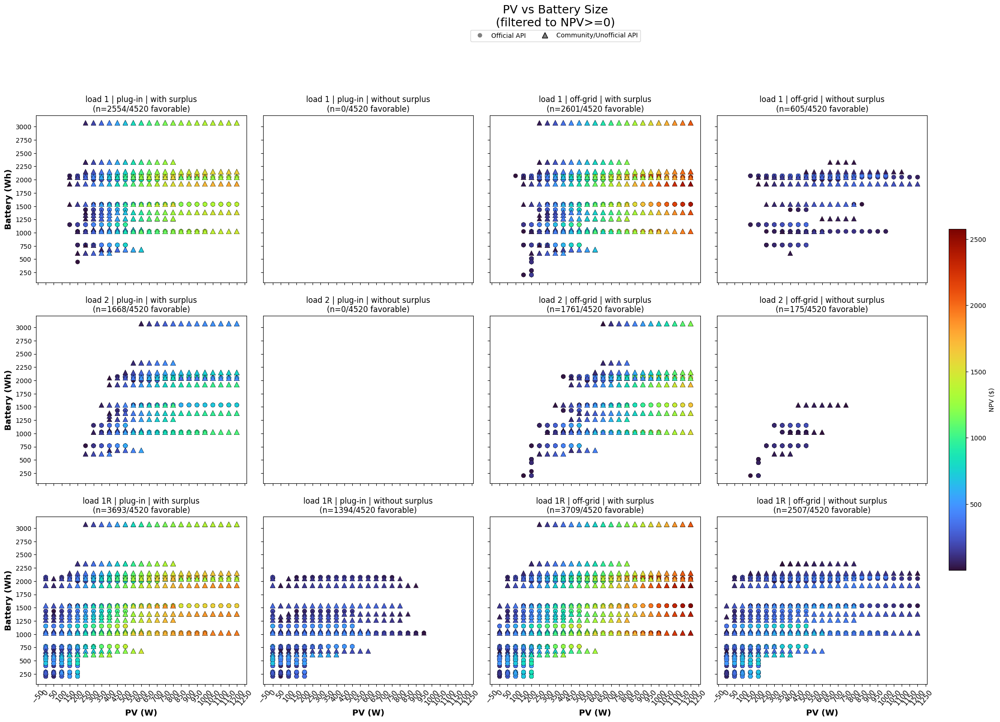

In [42]:
# PV size vs battery Wh scatter, same 12 scenarios (load x mi x surplus)
# filtered to 0 <= NPV, same iEA/az filters as the box plots, color-coded by NPV (shared scale)
# devices without an official API (community API only) are shown as triangles
scenarios = [(load, mi, sk) for load in LOADS for mi in [True, False] for sk in SURPLUS_KEYS]

# models that only have a community (unofficial) API
unofficial_models = set(hardware_df.loc[hardware_df['official API'] == False, 'Model'])

# first pass: gather all favorable data per scenario, and find the global NPV range
scenario_data = {}
global_min, global_max = np.inf, -np.inf
for (load, mi, sk) in scenarios:
    subset = results_df[results_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[npv >= 0]
    favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable = favorable[favorable['az'] == az]  # filter by azimuth
    npv_favorable = npv.loc[favorable.index]
    scenario_data[(load, mi, sk)] = (favorable, npv_favorable, len(subset), len(favorable))
    if len(npv_favorable):
        global_min = min(global_min, npv_favorable.min())
        global_max = max(global_max, npv_favorable.max())

# second pass: plot everything on the same color scale
fig, axs = plt.subplots(len(LOADS), len(scenarios) // len(LOADS), figsize=(30, 16), sharex=True, sharey=True)
axs = axs.reshape(len(LOADS), -1)
cmap = "turbo"  # more contrast across the range than viridis
for col_within_load, (load, mi, sk) in enumerate(scenarios):
    row = LOADS.index(load)
    col = col_within_load % (len(scenarios) // len(LOADS))
    ax = axs[row, col]
    favorable, npv_favorable, n_before, n_after = scenario_data[(load, mi, sk)]

    is_unofficial = favorable["batModel"].isin(unofficial_models)

    # official-API devices: circles, drawn first (sorted ascending within group)
    off_idx = favorable.index[~is_unofficial]
    off_order = npv_favorable.loc[off_idx].sort_values().index
    sc = ax.scatter(favorable.loc[off_order, "pvW"], favorable.loc[off_order, "batWh"],
               c=npv_favorable.loc[off_order], cmap=cmap, vmin=global_min, vmax=global_max,
               marker="o", alpha=1.0, s=45, edgecolors="black", linewidths=0.2)

    # unofficial/community-API devices: triangles, drawn on top (sorted ascending within group)
    un_idx = favorable.index[is_unofficial]
    un_order = npv_favorable.loc[un_idx].sort_values().index
    ax.scatter(favorable.loc[un_order, "pvW"], favorable.loc[un_order, "batWh"],
               c=npv_favorable.loc[un_order], cmap=cmap, vmin=global_min, vmax=global_max,
               marker="^", alpha=1.0, s=60, edgecolors="black", linewidths=0.2)

    if mi == True:
        config = 'plug-in'
    else:
        config = 'off-grid'
        
    ax.set_title(f"{load.replace('load','load ')} | {config} | {sk.replace('_',' ')}\n(n={n_after}/{n_before} favorable)", fontsize=12)
    if col == 0:
        ax.set_ylabel("Battery (Wh)", fontsize=13, fontweight="bold")
    if row == len(LOADS) - 1:
        ax.set_xlabel("PV (W)", fontsize=13, fontweight="bold")
    ax.tick_params(labelsize=11, axis="x", rotation=50)
    ax.xaxis.set_major_locator(mticker.MultipleLocator(50))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(250))
fig.subplots_adjust(wspace=0.08)  # tighter horizontal spacing between columns
# single shared colorbar for the whole figure, using the shared vmin/vmax
fig.colorbar(sc, ax=axs, shrink=0.6, pad=0.02, label="NPV ($)")

# marker legend (circle = official API, triangle = community/unofficial API)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Official API'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=9, label='Community/Unofficial API'),
]
fig.legend(handles=legend_elements, loc="upper center", ncol=2, bbox_to_anchor=(0.5, 1.0), fontsize=10)

fig.suptitle(f"PV vs Battery Size\n"
             f"(filtered to NPV>=0)", fontsize=18, y=1.03)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/pv_vs_battery_scatter_i{iEA}_a{az}_posNPV_{timestamp}.png", dpi=300, bbox_inches="tight")
plt.show()

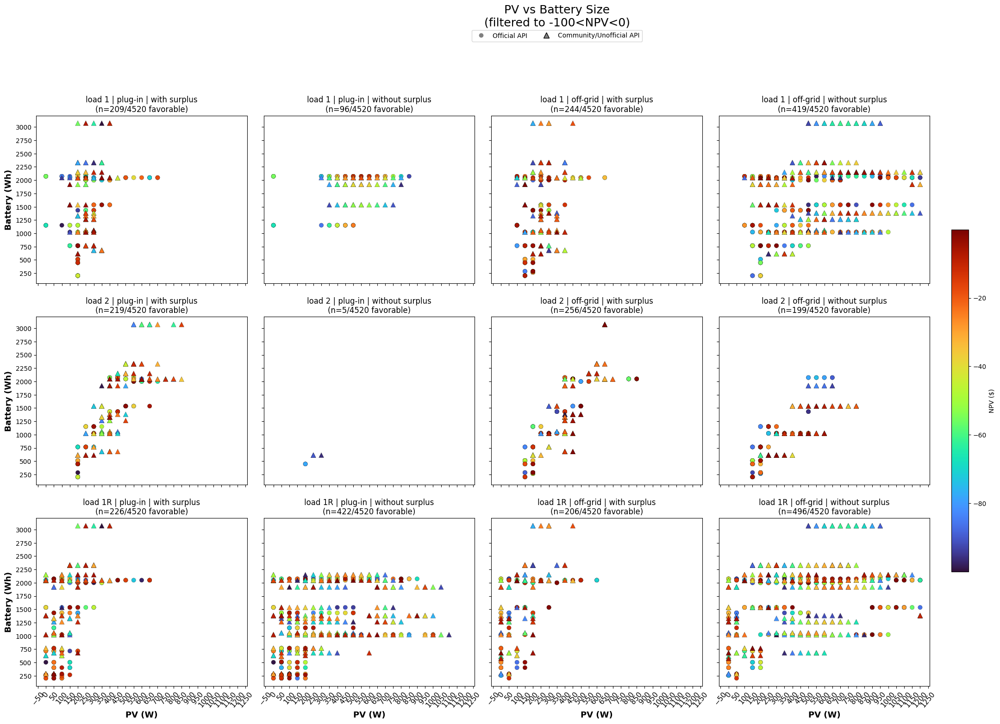

In [43]:
# PV size vs battery Wh scatter, same 12 scenarios (load x mi x surplus)
# filtered to 0 <= NPV, same iEA/az filters as the box plots, color-coded by NPV (shared scale)
# devices without an official API (community API only) are shown as triangles
scenarios = [(load, mi, sk) for load in LOADS for mi in [True, False] for sk in SURPLUS_KEYS]

# models that only have a community (unofficial) API
unofficial_models = set(hardware_df.loc[hardware_df['official API'] == False, 'Model'])

# first pass: gather all favorable data per scenario, and find the global NPV range
scenario_data = {}
global_min, global_max = np.inf, -np.inf
for (load, mi, sk) in scenarios:
    subset = results_df[results_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[(npv < 0) & (npv > -100)]
    favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable = favorable[favorable['az'] == az]  # filter by azimuth
    npv_favorable = npv.loc[favorable.index]
    scenario_data[(load, mi, sk)] = (favorable, npv_favorable, len(subset), len(favorable))
    if len(npv_favorable):
        global_min = min(global_min, npv_favorable.min())
        global_max = max(global_max, npv_favorable.max())

# second pass: plot everything on the same color scale
fig, axs = plt.subplots(len(LOADS), len(scenarios) // len(LOADS), figsize=(30, 16), sharex=True, sharey=True)
axs = axs.reshape(len(LOADS), -1)
cmap = "turbo"  # more contrast across the range than viridis
for col_within_load, (load, mi, sk) in enumerate(scenarios):
    row = LOADS.index(load)
    col = col_within_load % (len(scenarios) // len(LOADS))
    ax = axs[row, col]
    favorable, npv_favorable, n_before, n_after = scenario_data[(load, mi, sk)]

    is_unofficial = favorable["batModel"].isin(unofficial_models)

    # official-API devices: circles, drawn first (sorted ascending within group)
    off_idx = favorable.index[~is_unofficial]
    off_order = npv_favorable.loc[off_idx].sort_values().index
    sc = ax.scatter(favorable.loc[off_order, "pvW"], favorable.loc[off_order, "batWh"],
               c=npv_favorable.loc[off_order], cmap=cmap, vmin=global_min, vmax=global_max,
               marker="o", alpha=1.0, s=45, edgecolors="black", linewidths=0.2)

    # unofficial/community-API devices: triangles, drawn on top (sorted ascending within group)
    un_idx = favorable.index[is_unofficial]
    un_order = npv_favorable.loc[un_idx].sort_values().index
    ax.scatter(favorable.loc[un_order, "pvW"], favorable.loc[un_order, "batWh"],
               c=npv_favorable.loc[un_order], cmap=cmap, vmin=global_min, vmax=global_max,
               marker="^", alpha=1.0, s=60, edgecolors="black", linewidths=0.2)

    if mi == True:
        config = 'plug-in'
    else:
        config = 'off-grid'
        
    ax.set_title(f"{load.replace('load','load ')} | {config} | {sk.replace('_',' ')}\n(n={n_after}/{n_before} favorable)", fontsize=12)
    if col == 0:
        ax.set_ylabel("Battery (Wh)", fontsize=13, fontweight="bold")
    if row == len(LOADS) - 1:
        ax.set_xlabel("PV (W)", fontsize=13, fontweight="bold")
    ax.tick_params(labelsize=11, axis="x", rotation=50)
    ax.xaxis.set_major_locator(mticker.MultipleLocator(50))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(250))
fig.subplots_adjust(wspace=0.08)  # tighter horizontal spacing between columns
# single shared colorbar for the whole figure, using the shared vmin/vmax
fig.colorbar(sc, ax=axs, shrink=0.6, pad=0.02, label="NPV ($)")

# marker legend (circle = official API, triangle = community/unofficial API)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Official API'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=9, label='Community/Unofficial API'),
]
fig.legend(handles=legend_elements, loc="upper center", ncol=2, bbox_to_anchor=(0.5, 1.0), fontsize=10)

fig.suptitle(f"PV vs Battery Size\n"
             f"(filtered to -100<NPV<0)", fontsize=18, y=1.03)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/pv_vs_battery_scatter_i{iEA}_a{az}_posNPV_{timestamp}.png", dpi=300, bbox_inches="tight")
plt.show()

## Network Comparison

In [44]:
# ---- pick which load & dict key to use ----
npv_col = 'load1_NPV'          # e.g. 'load1_NPV', 'load2_NPV', or 'load1R_NPV'
npv_key = 'with_surplus'    # the key inside each dict

# extract the scalar NPV value into its own column
results_df['npv_value'] = results_df[npv_col].apply(lambda d: d.get(npv_key))

# filter to rows with positive NPV
posNPV_df = results_df[results_df['npv_value'] > 0]

# for each battery model, count the number of distinct networks it has a positive NPV in
batteryNetworkCounts = (
    posNPV_df.groupby('batModel')['network']
    .nunique()
    .sort_values(ascending=False)
    .reset_index(name='numNetworksPositiveNPV')
)

# batteries found in all networks
universalModels = list(batteryNetworkCounts[batteryNetworkCounts['numNetworksPositiveNPV']==8]['batModel'])

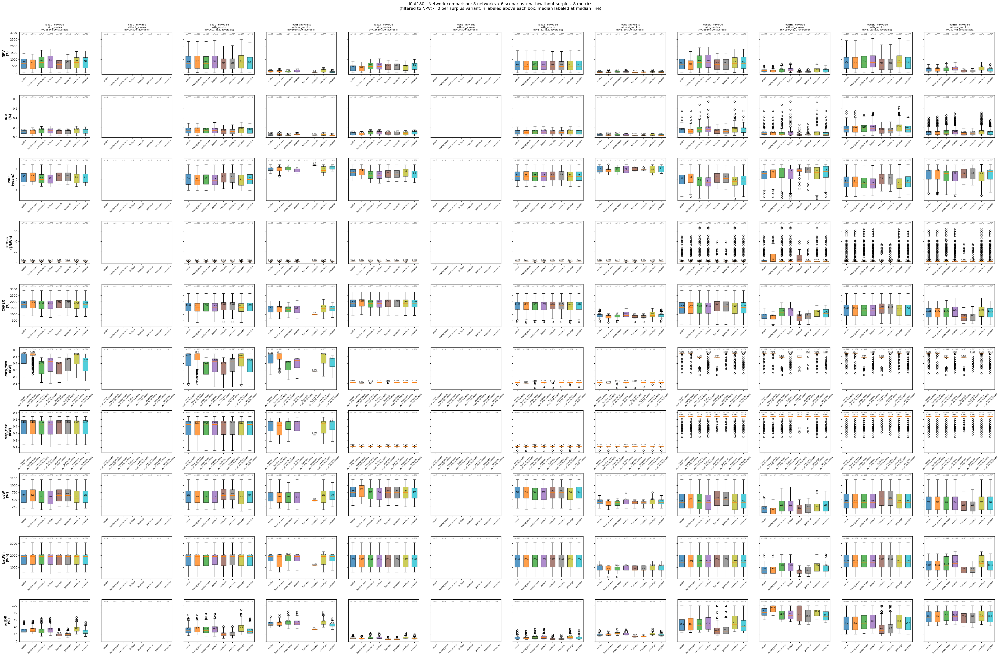

In [45]:
# Network comparison: 6 scenarios x with/without surplus, 8 metrics,
# filtered to 0 <= NPV

# CAPEX isn't necessary to include here, but it doesn't hurt

NETWORKS = sorted(results_df["network"].unique())
# surplus is now a third scenario dimension -> 3 loads x 2 mi x 2 surplus = 12 columns
scenarios = [(load, mi, sk) for load in LOADS for mi in [True, False] for sk in SURPLUS_KEYS]
all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics, uses generic flex labels
palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))
# Boxes colored by network, n labeled above each box with proper headroom, median labeled just above median line
palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))
fig, axs = plt.subplots(len(all_rows), len(scenarios), figsize=(48, 32), sharey="row")
# store counts and medians per (row, col) so we can add labels after fixing each row's ylim
counts_grid = {}
medians_grid = {}
for col, (load, mi, sk) in enumerate(scenarios):
    subset = results_df[results_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[npv >= 0]
    favorable = favorable[favorable['immediateEventAmt'] == iEA] # filter by immediate event amount
    favorable = favorable[favorable['az'] == az] # filter by azimuth
    #favorable = favorable[favorable['batModel'].isin(universalModels)]
    n_before, n_after = len(subset), len(favorable)
    for row, metric in enumerate(all_rows):
        ax = axs[row, col]
        vals = get_metric_values(favorable, load, metric, sk)
        data = [vals[favorable["network"] == net].dropna() for net in NETWORKS]
        counts = [len(d) for d in data]
        medians = [d.median() if len(d) else np.nan for d in data]
        counts_grid[(row, col)] = counts
        medians_grid[(row, col)] = medians
        if 'csrp' in metric: 
            bp = ax.boxplot(data, tick_labels=NETWORK_CSRP_LABELS, patch_artist=True, widths=0.6)
        elif 'dlrp' in metric:
            bp = ax.boxplot(data, tick_labels=NETWORK_DLRP_LABELS, patch_artist=True, widths=0.6)
        else:
            bp = ax.boxplot(data, tick_labels=NETWORKS, patch_artist=True, widths=0.6)
        for patch, c in zip(bp["boxes"], palette):
            patch.set_facecolor(c)
            patch.set_alpha(0.75)
        if row == 0:
            ax.set_title(f"{load} | mi={mi}\n{sk}\n(n={n_after}/{n_before} favorable)", fontsize=8)
        if col == 0:
            #ax.set_ylabel(metric, fontsize=11, fontweight="bold")
            ax.set_ylabel(f"{metric}\n({UNITS[metric]})", fontsize=11, fontweight="bold")  # <-- units added here
        ax.tick_params(labelsize=6, axis="x", rotation=45)
# second pass: expand each row's shared ylim ONCE (after all its columns are drawn) and add labels
for row in range(len(all_rows)):
    ylim = axs[row, 0].get_ylim()  # shared across the row
    span = ylim[1] - ylim[0]
    new_top = ylim[1] + 0.12 * span
    axs[row, 0].set_ylim(ylim[0], new_top)  # propagates to whole row via sharey
    y_label_pos = new_top - 0.03 * (new_top - ylim[0])
    median_offset = 0.015 * (new_top - ylim[0])  # small nudge above each median line
    for col in range(len(scenarios)):
        ax = axs[row, col]
        for i, n in enumerate(counts_grid[(row, col)]):
            ax.text(i + 1, y_label_pos, f"n={n}", ha="center", va="top", fontsize=6, color="dimgray")
        for i, med in enumerate(medians_grid[(row, col)]):
            if not np.isnan(med):
                ax.text(i + 1, med + median_offset, format_median(med), ha="center", va="bottom",
                         fontsize=6, color="black")
fig.suptitle(f"I{iEA} A{az} - Network comparison: {len(NETWORKS)} networks x 6 scenarios x with/without surplus, 8 metrics\n"
             f"(filtered to NPV>=0 per surplus variant; n labeled above each box, median labeled at median line)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.97])
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/network_comparison_i{iEA}_a{az}_posNPV_{timestamp}.png", dpi=300, bbox_inches="tight")
plt.show()

# Single System Comparison

In [46]:
# # Single battery: Network comparison, 6 scenarios x with/without surplus, 8 metrics
# # filtered to 0 <= NPV
# BAT_MODEL = "Elite 200V2"  # <-- set the one battery you want

# bat_df = results_df[results_df["batModel"] == BAT_MODEL]

# # UNITS = {
# #     "NPV": "$", "PBP": "years", "LCOSS": "$/kWh","IRR":"%",
# #     "csrp_flex": "kW", "dlrp_flex": "kW",
# #     "pvW": "W", "batWh": "Wh", "pctDR": "%",
# # }

# NETWORKS = sorted(bat_df["network"].unique())

# # drop the without_surplus variant for load1 and load2 -- only load1R keeps both surplus scenarios
# scenarios = [
#     (load, mi, sk)
#     for load in LOADS
#     for mi in [True, False]
#     for sk in SURPLUS_KEYS
# ]
# all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics

# palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))

# fig, axs = plt.subplots(len(all_rows)-1, len(scenarios), figsize=(32, 20), sharey="row")

# counts_grid = {}
# for col, (load, mi, sk) in enumerate(scenarios):
#     subset = bat_df[bat_df["microinverter"] == mi]
#     npv = extract_metric(subset, load, "NPV", sk)
#     favorable = subset[npv >= 0]
#     favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
#     favorable = favorable[favorable['az'] == az]  # filter by azimuth
#     n_before, n_after = len(subset), len(favorable)
#     rOffset = 0
#     for row, metric in enumerate(all_rows):
#         if metric == 'batWh':
#             rOffset = 1
#             continue
#         ax = axs[row - rOffset, col]
#         vals = get_metric_values(favorable, load, metric, sk)
#         data = [vals[favorable["network"] == net].dropna() for net in NETWORKS]
#         counts = [len(d) for d in data]
#         medians = [d.median() if len(d) else np.nan for d in data]
#         counts_grid[(row - rOffset, col)] = counts
#         # scatter dots instead of boxplot: jitter x slightly so overlapping points are visible
#         rng = np.random.default_rng(0)
#         for i, (dvals, c) in enumerate(zip(data, palette)):
#             if len(dvals) == 0:
#                 continue
#             ax.scatter(np.full(len(dvals), i + 1), dvals, color=c, alpha=0.75, s=10, edgecolors="none")
#         ax.set_xticks(range(1, len(NETWORKS) + 1))
#         if 'csrp' in metric:
#             ax.set_xticklabels(NETWORK_CSRP_LABELS)
#         elif 'dlrp' in metric:
#             ax.set_xticklabels(NETWORK_DLRP_LABELS)
#         else:
#             ax.set_xticklabels(NETWORKS)
#         if row == 0:
#             ax.set_title(f"{load} | mi={mi}\n{sk}\n(n={n_after}/{n_before} favorable)", fontsize=8)
#         if col == 0:
#             ax.set_ylabel(f"{metric}\n({UNITS[metric]})", fontsize=11, fontweight="bold")
#         ax.tick_params(labelsize=6, axis="x", rotation=45)

# # second pass: expand each row's shared ylim ONCE (after all its columns are drawn) and add labels
# for row in range(len(all_rows)-1):
#     ylim = axs[row, 0].get_ylim()  # shared across the row
#     span = ylim[1] - ylim[0]
#     new_top = ylim[1] + 0.12 * span
#     axs[row, 0].set_ylim(ylim[0], new_top)  # propagates to whole row via sharey
#     y_label_pos = new_top - 0.03 * (new_top - ylim[0])
#     median_offset = 0.015 * (new_top - ylim[0])  # small nudge above each median value

# fig.suptitle(f"I{iEA} A{az} - {BAT_MODEL}: {len(NETWORKS)} networks -- load1/load2 (with surplus only), load1R (both surplus), 8 metrics\n"
#              f"(filtered to NPV>=0 per surplus variant; n labeled above each point cluster, median labeled)", fontsize=14)
# plt.tight_layout(rect=[0, 0, 1, 0.97])

# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# fig.savefig(f"results/{directory}{d}/single_battery_network_comparison_{BAT_MODEL}_i{iEA}_a{az}_posNPV_load1R_bothSurplus_{timestamp}.png",
#             dpi=300, bbox_inches="tight")
# plt.show()

In [47]:
# # Single battery: Network comparison, 6 scenarios x with/without surplus, 8 metrics
# # filtered to 0 <= NPV
# BAT_MODEL = "AC180"  # <-- set the one battery you want

# bat_df = results_df[results_df["batModel"] == BAT_MODEL]

# # UNITS = {
# #     "NPV": "$", "PBP": "years", "LCOSS": "$/kWh","IRR":"%",
# #     "csrp_flex": "kW", "dlrp_flex": "kW",
# #     "pvW": "W", "batWh": "Wh", "pctDR": "%"
# # }

# NETWORKS = sorted(bat_df["network"].unique())

# # drop the without_surplus variant for load1 and load2 -- only load1R keeps both surplus scenarios
# scenarios = [
#     (load, mi, sk)
#     for load in LOADS
#     for mi in [True, False]
#     for sk in SURPLUS_KEYS
# ]
# all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics

# palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))

# fig, axs = plt.subplots(len(all_rows)-1, len(scenarios), figsize=(32, 20), sharey="row")

# counts_grid = {}
# for col, (load, mi, sk) in enumerate(scenarios):
#     subset = bat_df[bat_df["microinverter"] == mi]
#     npv = extract_metric(subset, load, "NPV", sk)
#     favorable = subset[npv >= 0]
#     favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
#     favorable = favorable[favorable['az'] == az]  # filter by azimuth
#     n_before, n_after = len(subset), len(favorable)
#     rOffset = 0
#     for row, metric in enumerate(all_rows):
#         if metric == 'batWh':
#             rOffset = 1
#             continue
#         ax = axs[row - rOffset, col]
#         vals = get_metric_values(favorable, load, metric, sk)
#         data = [vals[favorable["network"] == net].dropna() for net in NETWORKS]
#         counts = [len(d) for d in data]
#         medians = [d.median() if len(d) else np.nan for d in data]
#         counts_grid[(row - rOffset, col)] = counts
#         # scatter dots instead of boxplot: jitter x slightly so overlapping points are visible
#         rng = np.random.default_rng(0)
#         for i, (dvals, c) in enumerate(zip(data, palette)):
#             if len(dvals) == 0:
#                 continue
#             ax.scatter(np.full(len(dvals), i + 1), dvals, color=c, alpha=0.75, s=10, edgecolors="none")
#         ax.set_xticks(range(1, len(NETWORKS) + 1))
#         if 'csrp' in metric:
#             ax.set_xticklabels(NETWORK_CSRP_LABELS)
#         elif 'dlrp' in metric:
#             ax.set_xticklabels(NETWORK_DLRP_LABELS)
#         else:
#             ax.set_xticklabels(NETWORKS)
#         if row == 0:
#             ax.set_title(f"{load} | mi={mi}\n{sk}\n(n={n_after}/{n_before} favorable)", fontsize=8)
#         if col == 0:
#             ax.set_ylabel(f"{metric}\n({UNITS[metric]})", fontsize=11, fontweight="bold")
#         ax.tick_params(labelsize=6, axis="x", rotation=45)

# # second pass: expand each row's shared ylim ONCE (after all its columns are drawn) and add labels
# for row in range(len(all_rows)-1):
#     ylim = axs[row, 0].get_ylim()  # shared across the row
#     span = ylim[1] - ylim[0]
#     new_top = ylim[1] + 0.12 * span
#     axs[row, 0].set_ylim(ylim[0], new_top)  # propagates to whole row via sharey
#     y_label_pos = new_top - 0.03 * (new_top - ylim[0])
#     median_offset = 0.015 * (new_top - ylim[0])  # small nudge above each median value

# fig.suptitle(f"I{iEA} A{az} - {BAT_MODEL}: {len(NETWORKS)} networks -- load1/load2 (with surplus only), load1R (both surplus), 8 metrics\n"
#              f"(filtered to NPV>=0 per surplus variant; n labeled above each point cluster, median labeled)", fontsize=14)
# plt.tight_layout(rect=[0, 0, 1, 0.97])

# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# fig.savefig(f"results/{directory}{d}/single_battery_network_comparison_{BAT_MODEL}_i{iEA}_a{az}_posNPV_load1R_bothSurplus_{timestamp}.png",
#             dpi=300, bbox_inches="tight")
# plt.show()

In [48]:
# # Single battery: Network comparison, 6 scenarios x with/without surplus, 8 metrics
# # filtered to 0 <= NPV
# BAT_MODEL = "AC70"  # <-- set the one battery you want

# bat_df = results_df[results_df["batModel"] == BAT_MODEL]

# # UNITS = {
# #     "NPV": "$", "PBP": "years", "LCOSS": "$/kWh","IRR":"%",
# #     "csrp_flex": "kW", "dlrp_flex": "kW",
# #     "pvW": "W", "batWh": "Wh", "pctDR": "%"
# # }

# NETWORKS = sorted(bat_df["network"].unique())

# # drop the without_surplus variant for load1 and load2 -- only load1R keeps both surplus scenarios
# scenarios = [
#     (load, mi, sk)
#     for load in LOADS
#     for mi in [True, False]
#     for sk in SURPLUS_KEYS
# ]
# all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics

# palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))

# fig, axs = plt.subplots(len(all_rows)-1, len(scenarios), figsize=(32, 20), sharey="row")

# counts_grid = {}
# for col, (load, mi, sk) in enumerate(scenarios):
#     subset = bat_df[bat_df["microinverter"] == mi]
#     npv = extract_metric(subset, load, "NPV", sk)
#     favorable = subset[npv >= 0]
#     favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
#     favorable = favorable[favorable['az'] == az]  # filter by azimuth
#     n_before, n_after = len(subset), len(favorable)
#     rOffset = 0
#     for row, metric in enumerate(all_rows):
#         if metric == 'batWh':
#             rOffset = 1
#             continue
#         ax = axs[row - rOffset, col]
#         vals = get_metric_values(favorable, load, metric, sk)
#         data = [vals[favorable["network"] == net].dropna() for net in NETWORKS]
#         counts = [len(d) for d in data]
#         medians = [d.median() if len(d) else np.nan for d in data]
#         counts_grid[(row - rOffset, col)] = counts
#         # scatter dots instead of boxplot: jitter x slightly so overlapping points are visible
#         rng = np.random.default_rng(0)
#         for i, (dvals, c) in enumerate(zip(data, palette)):
#             if len(dvals) == 0:
#                 continue
#             ax.scatter(np.full(len(dvals), i + 1), dvals, color=c, alpha=0.75, s=10, edgecolors="none")
#         ax.set_xticks(range(1, len(NETWORKS) + 1))
#         if 'csrp' in metric:
#             ax.set_xticklabels(NETWORK_CSRP_LABELS)
#         elif 'dlrp' in metric:
#             ax.set_xticklabels(NETWORK_DLRP_LABELS)
#         else:
#             ax.set_xticklabels(NETWORKS)
#         if row == 0:
#             ax.set_title(f"{load} | mi={mi}\n{sk}\n(n={n_after}/{n_before} favorable)", fontsize=8)
#         if col == 0:
#             ax.set_ylabel(f"{metric}\n({UNITS[metric]})", fontsize=11, fontweight="bold")
#         ax.tick_params(labelsize=6, axis="x", rotation=45)

# # second pass: expand each row's shared ylim ONCE (after all its columns are drawn) and add labels
# for row in range(len(all_rows)-1):
#     ylim = axs[row, 0].get_ylim()  # shared across the row
#     span = ylim[1] - ylim[0]
#     new_top = ylim[1] + 0.12 * span
#     axs[row, 0].set_ylim(ylim[0], new_top)  # propagates to whole row via sharey
#     y_label_pos = new_top - 0.03 * (new_top - ylim[0])
#     median_offset = 0.015 * (new_top - ylim[0])  # small nudge above each median value

# fig.suptitle(f"I{iEA} A{az} - {BAT_MODEL}: {len(NETWORKS)} networks -- load1/load2 (with surplus only), load1R (both surplus), 8 metrics\n"
#              f"(filtered to NPV>=0 per surplus variant; n labeled above each point cluster, median labeled)", fontsize=14)
# plt.tight_layout(rect=[0, 0, 1, 0.97])

# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# fig.savefig(f"results/{directory}{d}/single_battery_network_comparison_{BAT_MODEL}_i{iEA}_a{az}_posNPV_load1R_bothSurplus_{timestamp}.png",
#             dpi=300, bbox_inches="tight")
# plt.show()

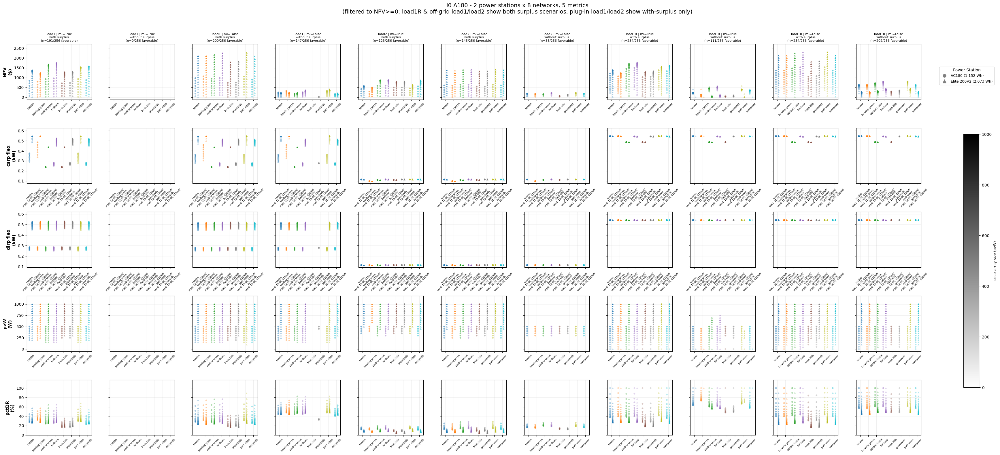

In [49]:
# Battery comparison: batteries grouped side-by-side within each network, 5 metrics,
# shaded by solar array size (pvW)
# surplus scenarios: load1R keeps both; load1/load2 keep both only when off-grid (mi=False),
# and drop without_surplus when plug-in (mi=True)
BAT_MODELS = ["AC180", "Elite 200V2"]  #"AC70", <-- set the batteries you want
MARKERS = ["o", "^", "s", "D", "P", "X"]  # one shape per battery, extend if you add more

UNITS = {
    "NPV": "$",
    "csrp_flex": "kW",
    "dlrp_flex": "kW",
    "pvW": "W",
    "pctDR": "%",
}

METRICS_TO_PLOT = ["NPV", "csrp_flex", "dlrp_flex", "pvW", "pctDR"]
SURPLUS_KEYS = ["with_surplus", "without_surplus"]

# alpha range used to shade points by solar array size (larger pvW = more opaque)
ALPHA_MIN, ALPHA_MAX = 0.25, 1.0

combined_df = results_df[results_df["batModel"].isin(BAT_MODELS)]
NETWORKS = sorted(combined_df["network"].unique())
palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))

# sanity check: csrp/dlrp label lists must match NETWORKS length, or ticks/labels will mismatch
assert len(NETWORK_CSRP_LABELS) == len(NETWORKS), \
    f"NETWORK_CSRP_LABELS has {len(NETWORK_CSRP_LABELS)} entries, expected {len(NETWORKS)}"
assert len(NETWORK_DLRP_LABELS) == len(NETWORKS), \
    f"NETWORK_DLRP_LABELS has {len(NETWORK_DLRP_LABELS)} entries, expected {len(NETWORKS)}"

# global pvW range so shading is consistent across every subplot
PV_MIN = combined_df["pvW"].min()
PV_MAX = combined_df["pvW"].max()

def pv_to_alpha(pv_vals):
    if PV_MAX == PV_MIN:
        return np.full(len(pv_vals), ALPHA_MAX)
    norm = (pv_vals - PV_MIN) / (PV_MAX - PV_MIN)
    return ALPHA_MIN + norm * (ALPHA_MAX - ALPHA_MIN)

# look up each battery's Wh capacity for the legend label
bat_wh_lookup = {}
for bat in BAT_MODELS:
    wh_vals = combined_df.loc[combined_df["batModel"] == bat, "batWh"]
    bat_wh_lookup[bat] = wh_vals.iloc[0] if len(wh_vals) else np.nan

n_bat = len(BAT_MODELS)
group_size = n_bat + 1  # +1 leaves a gap between network groups
# x offset for each battery within its network's group, centered
bat_offsets = np.arange(n_bat) - (n_bat - 1) / 2

# ticks and x-limits are identical across every column since NETWORKS is fixed globally
tick_positions = [net_idx * group_size for net_idx in range(len(NETWORKS))]
x_margin = group_size / 2
x_lim = (tick_positions[0] - x_margin, tick_positions[-1] + x_margin)

# scenarios: load x microinverter x surplus
# drop without_surplus for load1/load2 ONLY when plug-in (mi=True);
# off-grid (mi=False) and load1R always keep both surplus scenarios
scenarios = [
    (load, mi, sk)
    for load in LOADS
    for mi in [True, False]
    for sk in SURPLUS_KEYS
    if not (sk == "without_surplus" and load in ["load2"] and mi is True)
]

fig, axs = plt.subplots(len(METRICS_TO_PLOT), len(scenarios), figsize=(36, 16), sharey="row")
counts_grid = {}

for col, (load, mi, sk) in enumerate(scenarios):
    subset = combined_df[combined_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[npv >= 0]
    favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable = favorable[favorable['az'] == az]  # filter by azimuth
    n_before, n_after = len(subset), len(favorable)

    for row, metric in enumerate(METRICS_TO_PLOT):
        ax = axs[row, col]
        vals = get_metric_values(favorable, load, metric, sk)

        # gather each (network, battery) group along with its max pvW,
        # so we can draw groups with bigger arrays last (on top)
        groups = []
        for net_idx, net in enumerate(NETWORKS):
            net_mask = favorable["network"] == net
            group_center = net_idx * group_size
            for b_idx, bat in enumerate(BAT_MODELS):
                bat_mask = favorable["batModel"] == bat
                row_mask = bat_mask & net_mask
                dvals = vals[row_mask].dropna()
                if len(dvals) == 0:
                    continue
                pv = favorable.loc[dvals.index, "pvW"]
                x_pos = np.full(len(dvals), group_center + bat_offsets[b_idx])
                alphas = pv_to_alpha(pv.values)
                base_color = palette[net_idx]
                rgba = np.tile(base_color, (len(dvals), 1))
                rgba[:, 3] = alphas
                groups.append({
                    "x": x_pos, "y": dvals.values, "rgba": rgba,
                    "marker": MARKERS[b_idx % len(MARKERS)],
                    "max_pv": pv.max()
                })

        # draw smaller-array groups first, bigger-array groups last (on top)
        groups.sort(key=lambda g: g["max_pv"])
        for g in groups:
            ax.scatter(g["x"], g["y"], c=g["rgba"], marker=g["marker"], s=18, edgecolors="none")

        # ticks at the center of each network's group -- identical positions/count for every column
        ax.set_xticks(tick_positions)
        if 'csrp' in metric:
            ax.set_xticklabels(NETWORK_CSRP_LABELS)
        elif 'dlrp' in metric:
            ax.set_xticklabels(NETWORK_DLRP_LABELS)
        else:
            ax.set_xticklabels(NETWORKS)
        ax.set_xlim(x_lim)

        ax.grid(True, alpha=0.3, linewidth=0.5)

        load_label = load.replace('_', ' ')
        sk_label = sk.replace('_', ' ')
        if row == 0:
            ax.set_title(f"{load_label} | mi={mi}\n{sk_label}\n(n={n_after}/{n_before} favorable)", fontsize=8)
        if col == 0:
            metric_label = metric.replace('_', ' ')
            ax.set_ylabel(f"{metric_label}\n({UNITS[metric]})", fontsize=11, fontweight="bold")
        ax.tick_params(labelsize=6, axis="x", rotation=45)

# second pass: expand each row's shared ylim ONCE (after all its columns are drawn)
for row in range(len(METRICS_TO_PLOT)):
    ylim = axs[row, 0].get_ylim()  # shared across the row
    span = ylim[1] - ylim[0]
    new_top = ylim[1] + 0.12 * span
    axs[row, 0].set_ylim(ylim[0], new_top)  # propagates to whole row via sharey

# reserve space on the right for the legend + colorbar, and extra room at the top for the title block
plt.tight_layout(rect=[0, 0, 0.90, 0.93])

# legend mapping shape -> power station (name + Wh capacity)
battery_handles = [
    plt.Line2D([0], [0], marker=MARKERS[i % len(MARKERS)], color='gray', linestyle='',
               markersize=8,
               label=f"{bat.replace('_', ' ')} ({bat_wh_lookup[bat]:,.0f} Wh)")
    for i, bat in enumerate(BAT_MODELS)
]
fig.legend(handles=battery_handles, loc='upper left', bbox_to_anchor=(0.905, 0.85),
           title="Power Station", fontsize=9)

# colorbar showing what the shading (alpha) represents, placed in its own axis on the far right
cax = fig.add_axes([0.93, 0.15, 0.015, 0.55])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=mcolors.LinearSegmentedColormap.from_list("pv_shade", ["white", "black"]),
                            norm=mcolors.Normalize(vmin=PV_MIN, vmax=PV_MAX))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("solar array size (pvW)", fontsize=9)

fig.suptitle(f"I{iEA} A{az} - {len(BAT_MODELS)} power stations x {len(NETWORKS)} networks, 5 metrics\n"
             f"(filtered to NPV>=0; load1R & off-grid load1/load2 show both surplus scenarios, plug-in load1/load2 show with-surplus only)",
             fontsize=14, y=0.985)

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/combined_battery_network_comparison_i{iEA}_a{az}_posNPV_{timestamp}.png",
            dpi=300, bbox_inches="tight")
plt.show()

## Co-existence of favorable characteristics

In [50]:
UNITS = {
    "NPV": "$",
    "csrp_flex": "kW",
    "dlrp_flex": "kW",
    "pvW": "W",
    "pctDR": "%",
    "capex":"$",
    "PBP":"years",
    "LCOSS":"$/kWh",
    "batWh":"Wh"
}

In [51]:
# # Correlation heatmaps: co-existence of favorable metrics across 6 scenarios
# # (filtered to 0 <= PBP <= workingLife, as before)
# def build_scenario_metrics_df(df, load, mi, sk):
#     """Flat numeric dataframe of all favorable-PBP metrics for one (load, mi, sk) scenario."""
#     subset = df[df["microinverter"] == mi].copy()
#     csrp_col, dlrp_col = LOAD_FLEX_MAP[load]  # load-specific flex columns
#     out = pd.DataFrame(index=subset.index)
#     out["capex"] = extract_metric(subset, load, "capex", sk)
#     out["NPV"] = extract_metric(subset, load, "NPV", sk)
#     out["PBP"] = extract_metric(subset, load, "PBP", sk)
#     out["LCOSS"] = extract_metric(subset, load, "LCOSS", sk)
#     out["csrp_flex"] = subset[csrp_col].apply(np.mean)
#     out["dlrp_flex"] = subset[dlrp_col].apply(np.mean)
#     out["pvW"] = subset["pvW"]
#     out["batWh"] = subset["batWh"]
#     out["pctDR"] = pct_dr_value(subset, load)
#     favorable_mask = out["NPV"] >= 0
#     return out[favorable_mask]

# scenarios = [(load, mi) for load in LOADS for mi in [True, False]]

# # one figure per surplus key, so with_surplus and without_surplus don't get mixed together
# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(1, len(scenarios), figsize=(30, 6))
#     for col, (load, mi) in enumerate(scenarios):
#         m = build_scenario_metrics_df(results_df, load, mi, sk)
#         corr = m.corr()
#         labels_with_units = [f"{c}\n({UNITS[c]})" for c in corr.columns]  # <-- units added here
#         ax = axs[col]
#         im = ax.imshow(corr, vmin=-1, vmax=1, cmap="RdBu_r")
#         ax.set_xticks(range(len(corr.columns)))
#         ax.set_xticklabels(labels_with_units, rotation=90, fontsize=7)
#         ax.set_yticks(range(len(corr.columns)))
#         ax.set_yticklabels(labels_with_units, fontsize=7)
#         for i in range(len(corr.columns)):
#             for j in range(len(corr.columns)):
#                 val = corr.iloc[i, j]
#                 if not np.isnan(val):
#                     ax.text(j, i, f"{val:.2f}", ha="center", va="center", fontsize=6,
#                             color="white" if abs(val) > 0.6 else "black")
#         ax.set_title(f"{load}\nmi={mi} (n={len(m)})", fontsize=10)
#     fig.colorbar(im, ax=axs, shrink=0.6, label="Pearson correlation")
#     fig.suptitle(f"Correlation between favorable metrics, by scenario ({sk}, filtered to 0<=NPV)", fontsize=14)

#     timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
#     fig.savefig(f"results/{directory}{d}/correlationMatrix_i{iEA}_a{az}_posNPV_{timestamp}.png", dpi=300, bbox_inches="tight")

#     plt.show()

In [52]:
# # Correlation heatmaps: co-existence of favorable metrics across 6 scenarios
# # (filtered to 0 <= PBP <= workingLife, as before)

# BAT_MODEL = "Elite 200V2"

# def build_scenario_metrics_df(df, load, mi, sk):
#     """Flat numeric dataframe of all favorable-PBP metrics for one (load, mi, sk) scenario."""
#     subset = df[(df["microinverter"] == mi) & (df["batModel"] == BAT_MODEL)].copy()
#     csrp_col, dlrp_col = LOAD_FLEX_MAP[load]  # load-specific flex columns
#     out = pd.DataFrame(index=subset.index)
#     #out["capex"] = extract_metric(subset, load, "capex", sk)
#     out["NPV"] = extract_metric(subset, load, "NPV", sk)
#     out["PBP"] = extract_metric(subset, load, "PBP", sk)
#     out["LCOSS"] = extract_metric(subset, load, "LCOSS", sk)
#     out["csrp_flex"] = subset[csrp_col].apply(np.mean)
#     out["dlrp_flex"] = subset[dlrp_col].apply(np.mean)
#     out["pvW"] = subset["pvW"]
#     #out["batWh"] = subset["batWh"]
#     out["pctDR"] = pct_dr_value(subset, load)

#     # one-hot encode network: one binary column per network instead of a single label-encoded column
#     network_dummies = pd.get_dummies(subset["network"], prefix="net").astype(float)
#     out = pd.concat([out, network_dummies], axis=1)

#     favorable_mask = out["NPV"] >= 0
#     return out[favorable_mask]

# scenarios = [(load, mi) for load in LOADS for mi in [True, False]]

# # one figure per surplus key, so with_surplus and without_surplus don't get mixed together
# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(1, len(scenarios), figsize=(42, 10))
#     for col, (load, mi) in enumerate(scenarios):
#         m = build_scenario_metrics_df(results_df, load, mi, sk)
#         corr = m.corr()
#         # UNITS lookup for the core metrics; one-hot "net_*" columns just show their own name
#         labels_with_units = [f"{c}\n({UNITS[c]})" if c in UNITS else c for c in corr.columns]
#         ax = axs[col]
#         im = ax.imshow(corr, vmin=-1, vmax=1, cmap="RdBu_r")
#         ax.set_xticks(range(len(corr.columns)))
#         ax.set_xticklabels(labels_with_units, rotation=90, fontsize=6)
#         ax.set_yticks(range(len(corr.columns)))
#         ax.set_yticklabels(labels_with_units, fontsize=6)
#         for i in range(len(corr.columns)):
#             for j in range(len(corr.columns)):
#                 val = corr.iloc[i, j]
#                 if not np.isnan(val):
#                     ax.text(j, i, f"{val:.2f}", ha="center", va="center", fontsize=4,
#                             color="white" if abs(val) > 0.6 else "black")
#         ax.set_title(f"{load}\nmi={mi} (n={len(m)})", fontsize=10)
#     fig.colorbar(im, ax=axs, shrink=0.6, label="Pearson correlation")
#     fig.suptitle(f"Correlation between favorable metrics, by scenario ({sk}, filtered to 0<=NPV)", fontsize=14)
#     plt.show()

In [53]:
# # Correlation heatmaps: co-existence of favorable metrics across 6 scenarios
# # (filtered to 0 <= PBP <= workingLife, as before)

# BAT_MODEL = "AC180"

# # def build_scenario_metrics_df(df, load, mi, sk):
# #     """Flat numeric dataframe of all favorable-PBP metrics for one (load, mi, sk) scenario."""
# #     subset = df[(df["microinverter"] == mi) & (df["batModel"] == BAT_MODEL)].copy()
# #     csrp_col, dlrp_col = LOAD_FLEX_MAP[load]  # load-specific flex columns
# #     out = pd.DataFrame(index=subset.index)
# #     #out["capex"] = extract_metric(subset, load, "capex", sk)
# #     out["NPV"] = extract_metric(subset, load, "NPV", sk)
# #     out["PBP"] = extract_metric(subset, load, "PBP", sk)
# #     out["LCOSS"] = extract_metric(subset, load, "LCOSS", sk)
# #     out["csrp_flex"] = subset[csrp_col].apply(np.mean)
# #     out["dlrp_flex"] = subset[dlrp_col].apply(np.mean)
# #     out["pvW"] = subset["pvW"]
# #     #out["batWh"] = subset["batWh"]
# #     out["pctDR"] = pct_dr_value(subset, load)

# #     # one-hot encode network: one binary column per network instead of a single label-encoded column
# #     network_dummies = pd.get_dummies(subset["network"], prefix="net").astype(float)
# #     out = pd.concat([out, network_dummies], axis=1)

# #     favorable_mask = out["NPV"] >= 0
# #     return out[favorable_mask]

# scenarios = [(load, mi) for load in LOADS for mi in [True, False]]

# # one figure per surplus key, so with_surplus and without_surplus don't get mixed together
# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(1, len(scenarios), figsize=(42, 10))
#     for col, (load, mi) in enumerate(scenarios):
#         m = build_scenario_metrics_df(results_df, load, mi, sk)
#         corr = m.corr()
#         # UNITS lookup for the core metrics; one-hot "net_*" columns just show their own name
#         labels_with_units = [f"{c}\n({UNITS[c]})" if c in UNITS else c for c in corr.columns]
#         ax = axs[col]
#         im = ax.imshow(corr, vmin=-1, vmax=1, cmap="RdBu_r")
#         ax.set_xticks(range(len(corr.columns)))
#         ax.set_xticklabels(labels_with_units, rotation=90, fontsize=6)
#         ax.set_yticks(range(len(corr.columns)))
#         ax.set_yticklabels(labels_with_units, fontsize=6)
#         for i in range(len(corr.columns)):
#             for j in range(len(corr.columns)):
#                 val = corr.iloc[i, j]
#                 if not np.isnan(val):
#                     ax.text(j, i, f"{val:.2f}", ha="center", va="center", fontsize=4,
#                             color="white" if abs(val) > 0.6 else "black")
#         ax.set_title(f"{load}\nmi={mi} (n={len(m)})", fontsize=10)
#     fig.colorbar(im, ax=axs, shrink=0.6, label="Pearson correlation")
#     fig.suptitle(f"Correlation between favorable metrics, by scenario ({sk}, filtered to 0<=NPV)", fontsize=14)
#     plt.show()

In [54]:
# # NPV vs pvW scatter, faceted by scenario (load x mi), one figure per surplus key
# # filtered to 0 <= NPV, colored by network

# scenarios = [(load, mi) for load in LOADS for mi in [True, False]]
# palette = plt.cm.tab10(np.linspace(0, 1, len(NETWORKS)))
# network_color = dict(zip(NETWORKS, palette))

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(1, len(scenarios), figsize=(30, 6), sharey=True)
#     for col, (load, mi) in enumerate(scenarios):
#         subset = results_df[results_df["microinverter"] == mi]
#         npv = extract_metric(subset, load, "NPV", sk)
#         favorable = subset[npv >= 0]
#         pvw_vals = favorable["pvW"]
#         npv_vals = extract_metric(favorable, load, "NPV", sk)

#         ax = axs[col]
#         for net in NETWORKS:
#             net_mask = favorable["network"] == net
#             ax.scatter(pvw_vals[net_mask], npv_vals[net_mask],
#                        color=network_color[net], alpha=0.6, s=12, edgecolors="none", label=net)

#         ax.set_title(f"{load}\nmi={mi} (n={len(favorable)})", fontsize=10)
#         ax.set_xlabel(f"pvW\n({UNITS['pvW']})", fontsize=9)
#         if col == 0:
#             ax.set_ylabel(f"NPV\n({UNITS['NPV']})", fontsize=9, fontweight="bold")

#     # single shared legend for networks, placed outside the plot grid
#     handles, labels = axs[0].get_legend_handles_labels()
#     fig.legend(handles, labels, loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=8, title="network")

#     fig.suptitle(f"NPV vs pvW, by scenario ({sk}, filtered to 0<=NPV)", fontsize=14)
#     plt.tight_layout(rect=[0, 0, 0.95, 0.97])
#     plt.show()

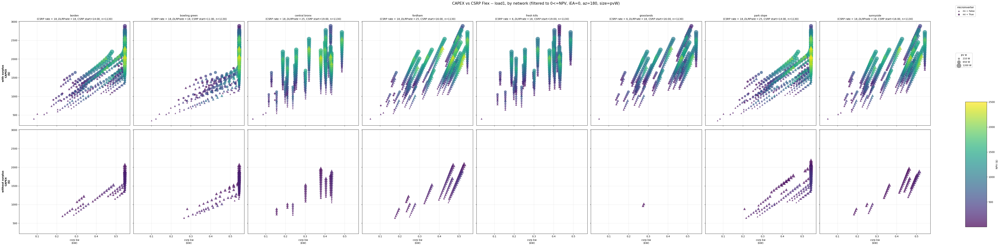

In [55]:
# CAPEX vs CSRP flex scatter for load1 only, one row per surplus key, one column per network, single combined figure
# filtered to 0 <= NPV, same iEA/az filters as the other scatter plots, shaped by microinverter (mi),
# colored by NPV, sized by pvW, higher NPV drawn on top
load = "load1"
csrp_col, dlrp_col = LOAD_FLEX_MAP[load]
mi_marker = {True: "o", False: "^"}  # circle = mi True, triangle = mi False

iEA = 0
az = 180

MIN_MARKER_SIZE = 20
MAX_MARKER_SIZE = 300

def scale_size(vals, vmin, vmax, smin=MIN_MARKER_SIZE, smax=MAX_MARKER_SIZE):
    vals = np.asarray(vals, dtype=float)
    if vmax == vmin:
        return np.full_like(vals, (smin + smax) / 2)
    norm = (vals - vmin) / (vmax - vmin)
    return smin + norm * (smax - smin)

n_rows = len(SURPLUS_KEYS)
n_cols = len(NETWORKS)

# global NPV color scale AND global pvW size scale across BOTH rows (all surplus keys),
# so color and size are identical/comparable for every subplot
global_npv_vals = []
global_pv_vals = []
for sk in SURPLUS_KEYS:
    npv_sk = extract_metric(results_df, load, "NPV", sk)
    favorable_sk = results_df[npv_sk >= 0]
    favorable_sk = favorable_sk[favorable_sk['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable_sk = favorable_sk[favorable_sk['az'] == az]  # filter by azimuth
    global_npv_vals.append(extract_metric(favorable_sk, load, "NPV", sk))
    global_pv_vals.append(favorable_sk["pvW"])
global_npv_vals = pd.concat(global_npv_vals)
global_pv_vals = pd.concat(global_pv_vals)
vmin, vmax = global_npv_vals.min(), global_npv_vals.max()
pv_min, pv_max = global_pv_vals.min(), global_pv_vals.max()

fig, axs = plt.subplots(n_rows, n_cols, figsize=(7.5 * n_cols, 7 * n_rows), sharex=True, sharey=True)

sc = None  # keep a handle to the last scatter call, for the shared colorbar
for row, sk in enumerate(SURPLUS_KEYS):
    for col, net in enumerate(NETWORKS):
        net_df = results_df[results_df["network"] == net]
        ax = axs[row, col]
        # gather both mi groups into one combined, NPV-sorted list of rows
        rows = []
        for mi in [True, False]:
            subset = net_df[net_df["microinverter"] == mi]
            npv = extract_metric(subset, load, "NPV", sk)
            favorable = subset[npv >= 0]
            favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
            favorable = favorable[favorable['az'] == az]  # filter by azimuth
            favorable_npv = extract_metric(favorable, load, "NPV", sk)
            csrp_vals = favorable[csrp_col].apply(np.mean)
            cap_vals = extract_metric(favorable, load, "capex", sk)
            pv_vals = favorable["pvW"]
            for x, y, v, p in zip(csrp_vals, cap_vals, favorable_npv, pv_vals):
                rows.append((v, mi, x, y, p))
        # sort ascending by NPV, so the drawing order below naturally puts highest NPV last (on top)
        rows.sort(key=lambda r: r[0])
        # draw in contiguous same-marker runs, preserving the NPV-ascending order across group boundaries
        seen_mi_labels = set()
        for mi, group in itertools.groupby(rows, key=lambda r: r[1]):
            group = list(group)
            g_npv = [r[0] for r in group]
            g_x = [r[2] for r in group]
            g_y = [r[3] for r in group]
            g_pv = [r[4] for r in group]
            g_size = scale_size(g_pv, pv_min, pv_max)
            label = f"mi = {mi}" if mi not in seen_mi_labels else None
            seen_mi_labels.add(mi)
            sc = ax.scatter(g_x, g_y,
                             c=g_npv, cmap="viridis", vmin=vmin, vmax=vmax,
                             marker=mi_marker[mi], alpha=0.7, s=g_size, edgecolors="none",
                             label=label)
        if row == 0:
            # DR rates for both programs plus CSRP event start time, shown for this network instead of borough
            csrp_rate_val = net_df["csrp_rate"].iloc[0] if len(net_df) else float("nan")
            dlrp_rate_val = net_df["dlrp_rate"].iloc[0] if len(net_df) else float("nan")
            event_start_val = net_df["eventStart"].iloc[0] if len(net_df) else float("nan")
            ax.set_title(
                f"{net}\n(CSRP rate = ${csrp_rate_val}, DLRP rate = ${dlrp_rate_val}, CSRP start={event_start_val}:00, n={len(net_df)})",
                fontsize=10
            )
        csrp_unit = UNITS["csrp_flex"]
        if row == n_rows - 1:
            ax.set_xlabel(f"csrp kw\n({csrp_unit})", fontsize=10)
        if col == 0:
            sk_label = sk.replace("_", " ")
            ax.set_ylabel(f"{sk_label}\nCAPEX\n({UNITS['capex']})", fontsize=10, fontweight="bold")
        ax.grid(True, alpha=0.3)

# reserve the right-hand margin for legends (top) + colorbar (bottom), so nothing overlaps
plt.tight_layout(rect=[0, 0, 0.87, 0.94])

# shared legend for microinverter (shape) -- topmost element in the right margin
handles, labels = axs[0, 0].get_legend_handles_labels()
for h in handles:
    h.set_color("gray")  # neutral gray so shape reads clearly, independent of the NPV colormap
mi_legend = fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(0.89, 0.97), fontsize=9, title="microinverter")
fig.add_artist(mi_legend)

# separate size legend for pvW -- sits below the mi legend, using the global pv range
size_sample_fracs = [0.1, 0.5, 1.0]
size_handles = [
    plt.scatter([], [], s=scale_size([frac], 0, 1)[0], color="gray", alpha=0.7,
                label=f"{int(pv_min + frac * (pv_max - pv_min))} {UNITS.get('pvW', '')}".strip())
    for frac in size_sample_fracs
]
pv_legend = fig.legend(handles=size_handles, loc="upper left", bbox_to_anchor=(0.89, 0.78), fontsize=9, title="pv w")
fig.add_artist(pv_legend)

# NPV colorbar -- pinned to the bottom of the right margin, well clear of both legends above it
if sc is not None:
    cbar_ax = fig.add_axes([0.90, 0.08, 0.02, 0.50])  # [left, bottom, width, height] in figure coords
    cbar = fig.colorbar(sc, cax=cbar_ax)
    cbar.set_label(f"NPV ({UNITS['NPV']})", fontsize=10)

fig.suptitle(f"CAPEX vs CSRP Flex -- load1, by network (filtered to 0<=NPV, iEA={iEA}, az={az}, size=pvW)", fontsize=15)

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/Load1_CAPEX_vs_CSRP_NPVcolor_MIshape_PVsize_layered_i{iEA}_a{az}_posNPV_{timestamp}.png", dpi=300, bbox_inches="tight")
plt.show()

In [56]:
# Cheapest-cost-per-flex-bucket, fit per load x network (CSRP flex only, with_surplus only)
# Computes TWO fits per subplot:
#   marginal fit  -> ordinary least-squares line (intercept allowed) = cost of the NEXT watt of flex
#   average fit   -> least-squares line forced through the origin = $/W if you bought the whole system
LOADS = ["load1", "load2", "load1R"]
SURPLUS_KEY_TO_USE = "with_surplus"

N_BUCKETS = 10  # number of evenly-spaced flex bins to bucket the cheapest point from

def find_cheapest_per_bucket_indices(x, y, n_buckets=N_BUCKETS):
    """Split the x range into n_buckets evenly-spaced bins. Within each non-empty bin,
    keep the index of the point with the lowest y (cheapest CAPEX). Returns one index
    per non-empty bucket, so the result is evenly spread across the flex range rather
    than clustered wherever the raw data happens to be densest."""
    x = np.asarray(x)
    y = np.asarray(y)
    bin_edges = np.linspace(x.min(), x.max(), n_buckets + 1)
    bin_idx = np.digitize(x, bin_edges[1:-1], right=True)  # last edge inclusive of max

    keep = []
    for b in range(n_buckets):
        in_bucket = np.where(bin_idx == b)[0]
        if len(in_bucket) == 0:
            continue
        cheapest_in_bucket = in_bucket[np.argmin(y[in_bucket])]
        keep.append(cheapest_in_bucket)
    return np.array(keep, dtype=int)

def fit_marginal_line(fx, fy):
    """MARGINAL fit: cost of the next watt of flex, along the cheapest curve.
    1 point  -> line through the origin (slope = y / x, intercept = 0) -- marginal and average coincide here
    2 points -> exact line through both points
    3+ points -> ordinary least-squares fit, intercept allowed (captures fixed cost separately)"""
    fx = np.asarray(fx, dtype=np.float64)
    fy = np.asarray(fy, dtype=np.float64)

    if len(fx) == 0:
        return np.nan, np.nan
    if len(fx) == 1:
        if fx[0] == 0:
            return np.nan, np.nan
        return fy[0] / fx[0], 0.0
    slope, intercept = np.polyfit(fx, fy, 1)
    return slope, intercept

def fit_average_line(fx, fy):
    """AVERAGE fit: $/W if you bought the whole system, forced through the origin
    (least-squares slope with intercept fixed at 0): slope = sum(x*y) / sum(x*x).
    Well-defined for any n >= 1 (unlike the marginal fit, which needs 2+ points for a
    real regression)."""
    fx = np.asarray(fx, dtype=np.float64)
    fy = np.asarray(fy, dtype=np.float64)

    valid = fx != 0
    fx, fy = fx[valid], fy[valid]
    if len(fx) == 0:
        return np.nan
    return np.sum(fx * fy) / np.sum(fx * fx)

fit_results = {}  # (load, network) -> dict

for load in LOADS:
    csrp_col, dlrp_col = LOAD_FLEX_MAP[load]
    for net in NETWORKS:
        net_df = results_df[results_df["network"] == net]

        rows = []
        for mi in [True, False]:
            subset = net_df[net_df["microinverter"] == mi]
            npv = extract_metric(subset, load, "NPV", SURPLUS_KEY_TO_USE)
            favorable = subset[npv >= 0]
            favorable = favorable[favorable['immediateEventAmt'] == iEA]
            favorable = favorable[favorable['az'] == az]

            x_vals = favorable[csrp_col].apply(np.mean)  # CSRP flex only
            y_vals = extract_metric(favorable, load, "capex", SURPLUS_KEY_TO_USE)
            rows.append(pd.DataFrame({"x": x_vals.to_numpy(), "y": y_vals.to_numpy()}))

        pts = pd.concat(rows, ignore_index=True).dropna()
        pts = pts.astype(np.float64)  # force numeric dtype; columns can end up as 'object' otherwise
        x_vals, y_vals = pts["x"].to_numpy(), pts["y"].to_numpy()

        if len(x_vals) < 1:
            fit_results[(load, net)] = None
            continue

        idx = find_cheapest_per_bucket_indices(x_vals, y_vals)
        fx, fy = x_vals[idx], y_vals[idx]

        marginal_slope, marginal_intercept = fit_marginal_line(fx, fy)
        average_slope = fit_average_line(fx, fy)

        fit_results[(load, net)] = {
            "marginal_slope_dollar_per_kw": marginal_slope,
            "marginal_intercept_dollar": marginal_intercept,
            "average_slope_dollar_per_kw": average_slope,
            "n frontier points": len(fx),
            "n total points": len(x_vals),
            "frontier_x": fx, "frontier_y": fy,
            "all_x": x_vals, "all_y": y_vals,
        }

# ---- summary table: marginal & average $/kW by load x network (CSRP flex only, bucketed, with_surplus) ----
summary_rows = []
for load in LOADS:
    for net in NETWORKS:
        r = fit_results[(load, net)]
        load_label = load.replace("_", " ")
        summary_rows.append({
            "load": load_label,
            "network": net,
            "marginal $ per kW": r["marginal_slope_dollar_per_kw"] if r else np.nan,
            "marginal $ per W": r["marginal_slope_dollar_per_kw"] / 1000 if r else np.nan,
            "average $ per kW": r["average_slope_dollar_per_kw"] if r else np.nan,
            "average $ per W": r["average_slope_dollar_per_kw"] / 1000 if r else np.nan,
            "n bucket points": r["n frontier points"] if r else 0,
            "n total points": r["n total points"] if r else 0,
        })

flex_price_summary_df = pd.DataFrame(summary_rows).sort_values(["load", "average $ per kW"])
display(flex_price_summary_df)

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
summary_out_path = f"results/{directory}{d}/marginal_and_average_dollar_per_w_csrp_flex_by_load_network_bucketed_withsurplus_i{iEA}_a{az}_{timestamp}.csv"
flex_price_summary_df.to_csv(summary_out_path, index=False)
print(f"Saved summary table to: {summary_out_path}")

,load,network,marginal $ per kW,marginal $ per W,average $ per kW,average $ per W,n bucket points,n total points
1,load1,bowling green,1825.972396,1.825972,2255.349129,2.255349,10,643
6,load1,park slope,1906.502038,1.906502,2518.930631,2.518931,10,706
0,load1,borden,1906.781343,1.906781,2558.138209,2.558138,10,651
3,load1,fordham,2137.894450,2.137894,2749.892738,2.749893,10,700
7,load1,sunnyside,2312.943589,2.312944,2905.057302,2.905057,10,649
5,load1,grasslands,2409.738282,2.409738,3201.822438,3.201822,10,561
2,load1,central bronx,2486.776159,2.486776,3208.690398,3.208690,10,690
4,load1,fresh kills,2731.275098,2.731275,3582.965794,3.582966,10,555
17,load1R,bowling green,441.635841,0.441636,614.692298,0.614692,8,930
16,load1R,borden,586.617090,0.586617,669.187675,0.669188,9,950


Saved summary table to: results/final data/sept11/primary//marginal_and_average_dollar_per_w_csrp_flex_by_load_network_bucketed_withsurplus_i0_a180_20260916_234352.csv


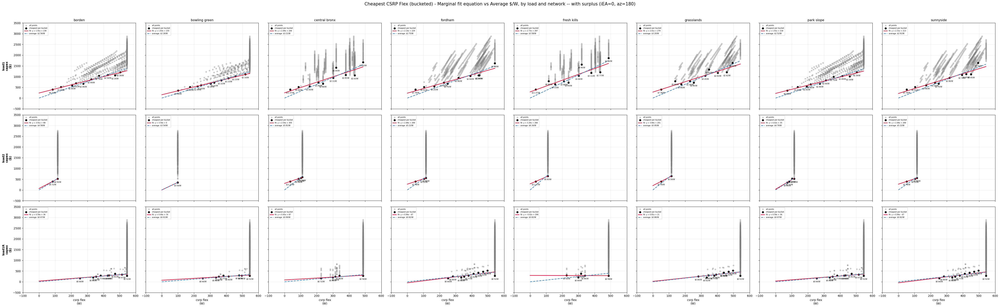

In [57]:
# Plot CAPEX vs CSRP flex: rows = loads, columns = networks, with_surplus only
# X-AXIS IN WATTS. Shows BOTH fits: marginal (crimson, full equation shown) and average (blue, through origin)
# sharex/sharey across the whole grid so every subplot uses the same x and y ticks, with 0 always labeled
n_rows = len(LOADS)
n_cols = len(NETWORKS)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows), sharex=True, sharey=True)

for row, load in enumerate(LOADS):
    for col, net in enumerate(NETWORKS):
        ax = axs[row, col]
        r = fit_results[(load, net)]
        if r is None:
            ax.text(0.5, 0.5, "no data", ha="center", va="center", transform=ax.transAxes)
            if row == 0:
                ax.set_title(net)
            continue

        # convert flex from kW to W for plotting
        all_x_w = r["all_x"] * 1000
        frontier_x_w = r["frontier_x"] * 1000

        # all favorable points, faint
        ax.scatter(all_x_w, r["all_y"], color="gray", alpha=0.35, s=20, label="all points")
        # cheapest-per-bucket points, highlighted
        ax.scatter(frontier_x_w, r["frontier_y"], color="black", alpha=0.9, s=45,
                   edgecolors="black", linewidths=0.4, label="cheapest per bucket")

        # per-point AVERAGE $/W label directly below each cheapest-per-bucket dot (that point's own capex / flex)
        for px_w, py in zip(frontier_x_w, r["frontier_y"]):
            if px_w == 0:
                continue  # can't get a rate from zero flex
            point_dollar_per_w = py / px_w
            ax.annotate(f"${point_dollar_per_w:.2f}/W",
                        (px_w, py), xytext=(0, -8), textcoords="offset points",
                        ha="center", va="top", fontsize=6, color="black")

        x_line_w = np.linspace(0, all_x_w.max(), 100)

        # MARGINAL fit line (intercept allowed) -- shown as its full equation, not just the slope
        if not np.isnan(r["marginal_slope_dollar_per_kw"]):
            marginal_slope_w = r["marginal_slope_dollar_per_kw"] / 1000
            marginal_intercept = r["marginal_intercept_dollar"]
            y_line_marginal = marginal_slope_w * x_line_w + marginal_intercept
            sign = "+" if marginal_intercept >= 0 else "-"
            ax.plot(x_line_w, y_line_marginal, color="crimson", linewidth=2,
                    label=f"fit: y = {marginal_slope_w:.2f}x {sign} {abs(marginal_intercept):.0f}")

        # AVERAGE fit line (through origin) -- $/W if you bought the whole system
        if not np.isnan(r["average_slope_dollar_per_kw"]):
            average_slope_w = r["average_slope_dollar_per_kw"] / 1000
            y_line_average = average_slope_w * x_line_w
            ax.plot(x_line_w, y_line_average, color="steelblue", linewidth=2, linestyle="--",
                    label=f"average: ${average_slope_w:.2f}/W")

        if row == 0:
            ax.set_title(net, fontsize=11)
        if row == n_rows - 1:
            ax.set_xlabel(f"csrp flex\n(W)", fontsize=10)
        if col == 0:
            load_label = load.replace("_", " ")
            ax.set_ylabel(f"{load_label}\ncapex\n({UNITS['capex']})", fontsize=10, fontweight="bold")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=6, loc="upper left")

# force 0 to be an explicit, labeled tick on both shared axes (only needs to be done once, since sharex/sharey)
ref_ax = axs[0, 0]
x_ticks = np.union1d(ref_ax.get_xticks(), [0])
y_ticks = np.union1d(ref_ax.get_yticks(), [0])
ref_ax.set_xticks(x_ticks)
ref_ax.set_yticks(y_ticks)

fig.suptitle(f"Cheapest CSRP Flex (bucketed) - Marginal fit equation vs Average $/W, by load and network -- with surplus (iEA={iEA}, az={az})",
             fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/marginal_equation_and_average_dollar_per_w_csrp_flex_by_load_network_bucketed_withsurplus_i{iEA}_a{az}_{timestamp}.png",
            dpi=300, bbox_inches="tight")
plt.show()

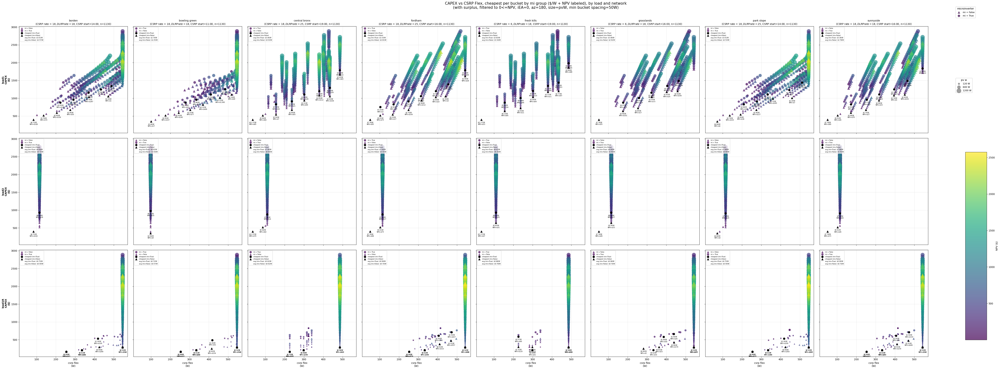

In [58]:
# # CAPEX vs CSRP flex, with_surplus only, one row per load, one column per network
# # Combines: NPV-colored/mi-shaped/pvW-sized scatter (style from the original layered figure)
# #           + cheapest-per-bucket dots (black, same mi shape as their source point), each labeled with $/W and NPV
# #           + SEPARATE average $/W per mi group, shown in the legend only (no line drawn)
# # x-axis is in Watts throughout

# LOADS = ["load1", "load2", "load1R"]
# SURPLUS_KEY_TO_USE = "with_surplus"
# mi_marker = {True: "o", False: "^"}  # circle = mi True, triangle = mi False

# iEA = 0
# az = 180

# MIN_MARKER_SIZE = 20
# MAX_MARKER_SIZE = 300
# N_BUCKETS = 10

# def scale_size(vals, vmin, vmax, smin=MIN_MARKER_SIZE, smax=MAX_MARKER_SIZE):
#     vals = np.asarray(vals, dtype=float)
#     if vmax == vmin:
#         return np.full_like(vals, (smin + smax) / 2)
#     norm = (vals - vmin) / (vmax - vmin)
#     return smin + norm * (smax - smin)

# def find_cheapest_per_bucket_indices(x, y, n_buckets=N_BUCKETS):
#     """Split the x range into n_buckets evenly-spaced bins. Within each non-empty bin,
#     keep the index of the point with the lowest y (cheapest CAPEX)."""
#     x = np.asarray(x)
#     y = np.asarray(y)
#     bin_edges = np.linspace(x.min(), x.max(), n_buckets + 1)
#     bin_idx = np.digitize(x, bin_edges[1:-1], right=True)

#     keep = []
#     for b in range(n_buckets):
#         in_bucket = np.where(bin_idx == b)[0]
#         if len(in_bucket) == 0:
#             continue
#         cheapest_in_bucket = in_bucket[np.argmin(y[in_bucket])]
#         keep.append(cheapest_in_bucket)
#     return np.array(keep, dtype=int)

# def fit_average_line(fx, fy):
#     """AVERAGE $/W: least-squares slope forced through the origin (no line drawn, value only)."""
#     fx = np.asarray(fx, dtype=np.float64)
#     fy = np.asarray(fy, dtype=np.float64)
#     valid = fx != 0
#     fx, fy = fx[valid], fy[valid]
#     if len(fx) == 0:
#         return np.nan
#     return np.sum(fx * fy) / np.sum(fx * fx)

# n_rows = len(LOADS)
# n_cols = len(NETWORKS)

# # global NPV color scale AND global pvW size scale across all 3 loads, so color/size are comparable everywhere
# global_npv_vals = []
# global_pv_vals = []
# for load in LOADS:
#     npv_l = extract_metric(results_df, load, "NPV", SURPLUS_KEY_TO_USE)
#     favorable_l = results_df[npv_l >= 0]
#     favorable_l = favorable_l[favorable_l['immediateEventAmt'] == iEA]
#     favorable_l = favorable_l[favorable_l['az'] == az]
#     global_npv_vals.append(extract_metric(favorable_l, load, "NPV", SURPLUS_KEY_TO_USE))
#     global_pv_vals.append(favorable_l["pvW"])
# global_npv_vals = pd.concat(global_npv_vals)
# global_pv_vals = pd.concat(global_pv_vals)
# vmin, vmax = global_npv_vals.min(), global_npv_vals.max()
# pv_min, pv_max = global_pv_vals.min(), global_pv_vals.max()

# fig, axs = plt.subplots(n_rows, n_cols, figsize=(7.5 * n_cols, 7 * n_rows), sharex=True, sharey=True)

# sc = None  # keep a handle to the last scatter call, for the shared colorbar
# avg_fit_results = {}  # (load, network, mi) -> average slope in $/W, for reference/printing

# for row, load in enumerate(LOADS):
#     csrp_col, dlrp_col = LOAD_FLEX_MAP[load]
#     for col, net in enumerate(NETWORKS):
#         net_df = results_df[results_df["network"] == net]
#         ax = axs[row, col]

#         # gather both mi groups into one combined, NPV-sorted list of rows (same as original figure)
#         rows = []
#         for mi in [True, False]:
#             subset = net_df[net_df["microinverter"] == mi]
#             npv = extract_metric(subset, load, "NPV", SURPLUS_KEY_TO_USE)
#             favorable = subset[npv >= 0]
#             favorable = favorable[favorable['immediateEventAmt'] == iEA]
#             favorable = favorable[favorable['az'] == az]
#             favorable_npv = extract_metric(favorable, load, "NPV", SURPLUS_KEY_TO_USE)
#             csrp_vals_w = favorable[csrp_col].apply(np.mean) * 1000  # kW -> W
#             cap_vals = extract_metric(favorable, load, "capex", SURPLUS_KEY_TO_USE)
#             pv_vals = favorable["pvW"]
#             for x, y, v, p in zip(csrp_vals_w, cap_vals, favorable_npv, pv_vals):
#                 rows.append((v, mi, x, y, p))
#         rows.sort(key=lambda r: r[0])  # ascending NPV -> highest NPV drawn last (on top)

#         seen_mi_labels = set()
#         for mi, group in itertools.groupby(rows, key=lambda r: r[1]):
#             group = list(group)
#             g_npv = [r[0] for r in group]
#             g_x = [r[2] for r in group]
#             g_y = [r[3] for r in group]
#             g_pv = [r[4] for r in group]
#             g_size = scale_size(g_pv, pv_min, pv_max)
#             label = f"mi = {mi}" if mi not in seen_mi_labels else None
#             seen_mi_labels.add(mi)
#             sc = ax.scatter(g_x, g_y,
#                              c=g_npv, cmap="viridis", vmin=vmin, vmax=vmax,
#                              marker=mi_marker[mi], alpha=0.7, s=g_size, edgecolors="none",
#                              label=label)

#         # ---- cheapest-per-bucket dots (black, shape matches source mi) + per-point $/W and NPV labels ----
#         # bucketing and averaging now done SEPARATELY per mi group, not combined
#         avg_proxy_handles = []
#         if len(rows):
#             all_npv = np.array([r[0] for r in rows])
#             all_mi = np.array([r[1] for r in rows])
#             all_x = np.array([r[2] for r in rows])
#             all_y = np.array([r[3] for r in rows])

#             for mi_val in [True, False]:
#                 mi_mask = all_mi == mi_val
#                 if not mi_mask.any():
#                     avg_fit_results[(load, net, mi_val)] = np.nan
#                     continue

#                 mi_x, mi_y, mi_npv = all_x[mi_mask], all_y[mi_mask], all_npv[mi_mask]
#                 idx = find_cheapest_per_bucket_indices(mi_x, mi_y)
#                 fx, fy, f_npv = mi_x[idx], mi_y[idx], mi_npv[idx]

#                 avg_slope_w = fit_average_line(fx, fy)
#                 avg_fit_results[(load, net, mi_val)] = avg_slope_w

#                 # draw this mi group's cheapest points with its own marker shape, colored black
#                 ax.scatter(fx, fy, color="black", alpha=0.95, s=55,
#                            marker=mi_marker[mi_val], edgecolors="none", linewidths=0.6,
#                            label=f"cheapest (mi={mi_val})", zorder=5)

#                 for px, py, npv_val in zip(fx, fy, f_npv):
#                     if px == 0:
#                         continue
#                     point_dollar_per_w = py / px
#                     ax.annotate(f"${point_dollar_per_w:.2f}/W\nNPV=${npv_val:,.0f}",
#                                 (px, py), xytext=(0, -8), textcoords="offset points",
#                                 ha="center", va="top", fontsize=6, color="black", zorder=6)

#                 # average $/W for this mi group, shown in the legend only -- no line is drawn
#                 if not np.isnan(avg_slope_w):
#                     avg_proxy_handles.append(
#                         Line2D([0], [0], color="none", label=f"avg (mi={mi_val}): ${avg_slope_w:.2f}/W")
#                     )

#         handles_now, labels_now = ax.get_legend_handles_labels()
#         handles_now.extend(avg_proxy_handles)
#         labels_now.extend([h.get_label() for h in avg_proxy_handles])
#         ax.legend(handles_now, labels_now, fontsize=6, loc="upper left")

#         if row == 0:
#             csrp_rate_val = net_df["csrp_rate"].iloc[0] if len(net_df) else float("nan")
#             dlrp_rate_val = net_df["dlrp_rate"].iloc[0] if len(net_df) else float("nan")
#             event_start_val = net_df["eventStart"].iloc[0] if len(net_df) else float("nan")
#             ax.set_title(
#                 f"{net}\n(CSRP rate = ${csrp_rate_val}, DLRP rate = ${dlrp_rate_val}, CSRP start={event_start_val}:00, n={len(net_df)})",
#                 fontsize=10
#             )
#         if row == n_rows - 1:
#             ax.set_xlabel(f"csrp flex\n(W)", fontsize=10)
#         if col == 0:
#             load_label = load.replace("_", " ")
#             ax.set_ylabel(f"{load_label}\nCAPEX\n({UNITS['capex']})", fontsize=10, fontweight="bold")
#         ax.grid(True, alpha=0.3)

# # force 0 to be an explicit, labeled tick on both shared axes
# ref_ax = axs[0, 0]
# x_ticks = np.union1d(ref_ax.get_xticks(), [0])
# y_ticks = np.union1d(ref_ax.get_yticks(), [0])
# ref_ax.set_xticks(x_ticks)
# ref_ax.set_yticks(y_ticks)

# # reserve the right-hand margin for legends (top) + colorbar (bottom), so nothing overlaps
# plt.tight_layout(rect=[0, 0, 0.87, 0.94])

# # shared legend for microinverter (shape) -- topmost element in the right margin
# handles, labels = axs[0, 0].get_legend_handles_labels()
# mi_handles = [h for h, l in zip(handles, labels) if l and l.startswith("mi =")]
# mi_labels = [l for l in labels if l and l.startswith("mi =")]
# for h in mi_handles:
#     h.set_color("gray")
# mi_legend = fig.legend(mi_handles, mi_labels, loc="upper left", bbox_to_anchor=(0.89, 0.97), fontsize=9, title="microinverter")
# fig.add_artist(mi_legend)

# # separate size legend for pvW -- sits below the mi legend
# size_sample_fracs = [0.1, 0.5, 1.0]
# size_handles = [
#     plt.scatter([], [], s=scale_size([frac], 0, 1)[0], color="gray", alpha=0.7,
#                 label=f"{int(pv_min + frac * (pv_max - pv_min))} {UNITS.get('pvW', '')}".strip())
#     for frac in size_sample_fracs
# ]
# pv_legend = fig.legend(handles=size_handles, loc="upper left", bbox_to_anchor=(0.89, 0.78), fontsize=9, title="pv w")
# fig.add_artist(pv_legend)

# # NPV colorbar -- pinned to the bottom of the right margin
# if sc is not None:
#     cbar_ax = fig.add_axes([0.90, 0.08, 0.02, 0.50])
#     cbar = fig.colorbar(sc, cax=cbar_ax)
#     cbar.set_label(f"NPV ({UNITS['NPV']})", fontsize=10)

# fig.suptitle(f"CAPEX vs CSRP Flex, cheapest per bucket by mi group ($/W + NPV labeled), by load and network\n"
#              f"(with surplus, filtered to 0<=NPV, iEA={iEA}, az={az}, size=pvW)", fontsize=15)

# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# fig.savefig(f"results/{directory}{d}/CAPEX_vs_CSRP_NPVcolor_MIshape_PVsize_cheapestbucket_bymi_byload_withsurplus_i{iEA}_a{az}_{timestamp}.png",
#             dpi=300, bbox_inches="tight")
# plt.show()


############

# CAPEX vs CSRP flex, with_surplus only, one row per load, one column per network
# Combines: NPV-colored/mi-shaped/pvW-sized scatter (style from the original layered figure)
#           + cheapest-per-bucket dots (black, no outline, same mi shape as their source point),
#             merged if too close together, each labeled with $/W and NPV
#           + SEPARATE average $/W per mi group, shown in the legend only (no line drawn)
#           + all legend icons forced to a uniform size
# x-axis is in Watts throughout

from matplotlib.lines import Line2D

LOADS = ["load1", "load2", "load1R"]
SURPLUS_KEY_TO_USE = "with_surplus"
mi_marker = {True: "o", False: "^"}  # circle = mi True, triangle = mi False

iEA = 0
az = 180

MIN_MARKER_SIZE = 20
MAX_MARKER_SIZE = 300
N_BUCKETS = 10
MIN_BUCKET_DISTANCE_W = 50  # minimum x-spacing (Watts) enforced between kept bucket points
LEGEND_MARKER_SIZE = 80     # uniform icon size for every legend entry

def scale_size(vals, vmin, vmax, smin=MIN_MARKER_SIZE, smax=MAX_MARKER_SIZE):
    vals = np.asarray(vals, dtype=float)
    if vmax == vmin:
        return np.full_like(vals, (smin + smax) / 2)
    norm = (vals - vmin) / (vmax - vmin)
    return smin + norm * (smax - smin)

def find_cheapest_per_bucket_indices(x, y, n_buckets=N_BUCKETS):
    """Split the x range into n_buckets evenly-spaced bins. Within each non-empty bin,
    keep the index of the point with the lowest y (cheapest CAPEX)."""
    x = np.asarray(x)
    y = np.asarray(y)
    bin_edges = np.linspace(x.min(), x.max(), n_buckets + 1)
    bin_idx = np.digitize(x, bin_edges[1:-1], right=True)

    keep = []
    for b in range(n_buckets):
        in_bucket = np.where(bin_idx == b)[0]
        if len(in_bucket) == 0:
            continue
        cheapest_in_bucket = in_bucket[np.argmin(y[in_bucket])]
        keep.append(cheapest_in_bucket)
    return np.array(keep, dtype=int)

def merge_close_points(fx, fy, f_npv, min_dist):
    """Enforce a minimum x-distance between kept points: sort by x, then walk left to right,
    and if the next point is closer than min_dist to the last kept point, keep whichever of
    the two is cheaper (lower y) instead of keeping both."""
    fx = np.asarray(fx, dtype=np.float64)
    fy = np.asarray(fy, dtype=np.float64)
    f_npv = np.asarray(f_npv, dtype=np.float64)
    if len(fx) == 0:
        return fx, fy, f_npv

    order = np.argsort(fx)
    fx, fy, f_npv = fx[order], fy[order], f_npv[order]

    merged = [(fx[0], fy[0], f_npv[0])]
    for x, y, npv in zip(fx[1:], fy[1:], f_npv[1:]):
        last_x, last_y, last_npv = merged[-1]
        if (x - last_x) < min_dist:
            if y < last_y:
                merged[-1] = (x, y, npv)  # replace with the cheaper of the two
            # else: drop this point, keep the existing cheaper one
        else:
            merged.append((x, y, npv))

    arr = np.array(merged)
    return arr[:, 0], arr[:, 1], arr[:, 2]

def fit_average_line(fx, fy):
    """AVERAGE $/W: least-squares slope forced through the origin (no line drawn, value only)."""
    fx = np.asarray(fx, dtype=np.float64)
    fy = np.asarray(fy, dtype=np.float64)
    valid = fx != 0
    fx, fy = fx[valid], fy[valid]
    if len(fx) == 0:
        return np.nan
    return np.sum(fx * fy) / np.sum(fx * fx)

def uniform_legend_sizes(handles, size=LEGEND_MARKER_SIZE):
    """Force every marker-based legend handle (PathCollection from scatter) to the same icon size."""
    for h in handles:
        if hasattr(h, "set_sizes"):
            h.set_sizes([size])
    return handles

n_rows = len(LOADS)
n_cols = len(NETWORKS)

# global NPV color scale AND global pvW size scale across all 3 loads, so color/size are comparable everywhere
global_npv_vals = []
global_pv_vals = []
for load in LOADS:
    npv_l = extract_metric(results_df, load, "NPV", SURPLUS_KEY_TO_USE)
    favorable_l = results_df[npv_l >= 0]
    favorable_l = favorable_l[favorable_l['immediateEventAmt'] == iEA]
    favorable_l = favorable_l[favorable_l['az'] == az]
    global_npv_vals.append(extract_metric(favorable_l, load, "NPV", SURPLUS_KEY_TO_USE))
    global_pv_vals.append(favorable_l["pvW"])
global_npv_vals = pd.concat(global_npv_vals)
global_pv_vals = pd.concat(global_pv_vals)
vmin, vmax = global_npv_vals.min(), global_npv_vals.max()
pv_min, pv_max = global_pv_vals.min(), global_pv_vals.max()

fig, axs = plt.subplots(n_rows, n_cols, figsize=(7.5 * n_cols, 7 * n_rows), sharex=True, sharey=True)

sc = None  # keep a handle to the last scatter call, for the shared colorbar
avg_fit_results = {}  # (load, network, mi) -> average slope in $/W, for reference/printing

for row, load in enumerate(LOADS):
    csrp_col, dlrp_col = LOAD_FLEX_MAP[load]
    for col, net in enumerate(NETWORKS):
        net_df = results_df[results_df["network"] == net]
        ax = axs[row, col]

        # gather both mi groups into one combined, NPV-sorted list of rows (same as original figure)
        rows = []
        for mi in [True, False]:
            subset = net_df[net_df["microinverter"] == mi]
            npv = extract_metric(subset, load, "NPV", SURPLUS_KEY_TO_USE)
            favorable = subset[npv >= 0]
            favorable = favorable[favorable['immediateEventAmt'] == iEA]
            favorable = favorable[favorable['az'] == az]
            favorable_npv = extract_metric(favorable, load, "NPV", SURPLUS_KEY_TO_USE)
            csrp_vals_w = favorable[csrp_col].apply(np.mean) * 1000  # kW -> W
            cap_vals = extract_metric(favorable, load, "capex", SURPLUS_KEY_TO_USE)
            pv_vals = favorable["pvW"]
            for x, y, v, p in zip(csrp_vals_w, cap_vals, favorable_npv, pv_vals):
                rows.append((v, mi, x, y, p))
        rows.sort(key=lambda r: r[0])  # ascending NPV -> highest NPV drawn last (on top)

        seen_mi_labels = set()
        for mi, group in itertools.groupby(rows, key=lambda r: r[1]):
            group = list(group)
            g_npv = [r[0] for r in group]
            g_x = [r[2] for r in group]
            g_y = [r[3] for r in group]
            g_pv = [r[4] for r in group]
            g_size = scale_size(g_pv, pv_min, pv_max)
            label = f"mi = {mi}" if mi not in seen_mi_labels else None
            seen_mi_labels.add(mi)
            sc = ax.scatter(g_x, g_y,
                             c=g_npv, cmap="viridis", vmin=vmin, vmax=vmax,
                             marker=mi_marker[mi], alpha=0.7, s=g_size, edgecolors="none",
                             label=label)

        # ---- cheapest-per-bucket dots (black, no outline, shape matches source mi) ----
        # bucketing, min-distance merging, and averaging done SEPARATELY per mi group
        avg_proxy_handles = []
        if len(rows):
            all_npv = np.array([r[0] for r in rows])
            all_mi = np.array([r[1] for r in rows])
            all_x = np.array([r[2] for r in rows])
            all_y = np.array([r[3] for r in rows])

            for mi_val in [True, False]:
                mi_mask = all_mi == mi_val
                if not mi_mask.any():
                    avg_fit_results[(load, net, mi_val)] = np.nan
                    continue

                mi_x, mi_y, mi_npv = all_x[mi_mask], all_y[mi_mask], all_npv[mi_mask]
                idx = find_cheapest_per_bucket_indices(mi_x, mi_y)
                fx, fy, f_npv = mi_x[idx], mi_y[idx], mi_npv[idx]
                fx, fy, f_npv = merge_close_points(fx, fy, f_npv, MIN_BUCKET_DISTANCE_W)

                avg_slope_w = fit_average_line(fx, fy)
                avg_fit_results[(load, net, mi_val)] = avg_slope_w

                # draw this mi group's cheapest points with its own marker shape, solid black, no outline
                ax.scatter(fx, fy, color="black", alpha=0.95, s=55,
                           marker=mi_marker[mi_val], edgecolors="none",
                           label=f"cheapest (mi={mi_val})", zorder=5)

                for px, py, npv_val in zip(fx, fy, f_npv):
                    if px == 0:
                        continue
                    point_dollar_per_w = py / px
                    ax.annotate(f"${point_dollar_per_w:.2f}/W\nNPV=${npv_val:,.0f}",
                                (px, py), xytext=(0, -8), textcoords="offset points",
                                ha="center", va="top", fontsize=6, color="black", zorder=6)

                # average $/W for this mi group, shown in the legend only -- no line is drawn
                if not np.isnan(avg_slope_w):
                    avg_proxy_handles.append(
                        Line2D([0], [0], color="none", label=f"avg (mi={mi_val}): ${avg_slope_w:.2f}/W")
                    )

        handles_now, labels_now = ax.get_legend_handles_labels()
        handles_now = uniform_legend_sizes(handles_now)
        handles_now.extend(avg_proxy_handles)
        labels_now.extend([h.get_label() for h in avg_proxy_handles])
        ax.legend(handles_now, labels_now, fontsize=6, loc="upper left")

        if row == 0:
            csrp_rate_val = net_df["csrp_rate"].iloc[0] if len(net_df) else float("nan")
            dlrp_rate_val = net_df["dlrp_rate"].iloc[0] if len(net_df) else float("nan")
            event_start_val = net_df["eventStart"].iloc[0] if len(net_df) else float("nan")
            ax.set_title(
                f"{net}\n(CSRP rate = ${csrp_rate_val}, DLRP rate = ${dlrp_rate_val}, CSRP start={event_start_val}:00, n={len(net_df)})",
                fontsize=10
            )
        if row == n_rows - 1:
            ax.set_xlabel(f"csrp flex\n(W)", fontsize=10)
        if col == 0:
            load_label = load.replace("_", " ")
            ax.set_ylabel(f"{load_label}\nCAPEX\n({UNITS['capex']})", fontsize=10, fontweight="bold")
        ax.grid(True, alpha=0.3)

# force 0 to be an explicit, labeled tick on both shared axes
ref_ax = axs[0, 0]
x_ticks = np.union1d(ref_ax.get_xticks(), [0])
y_ticks = np.union1d(ref_ax.get_yticks(), [0])
ref_ax.set_xticks(x_ticks)
ref_ax.set_yticks(y_ticks)

# reserve the right-hand margin for legends (top) + colorbar (bottom), so nothing overlaps
plt.tight_layout(rect=[0, 0, 0.87, 0.94])

# shared legend for microinverter (shape) -- topmost element in the right margin
handles, labels = axs[0, 0].get_legend_handles_labels()
mi_handles = [h for h, l in zip(handles, labels) if l and l.startswith("mi =")]
mi_labels = [l for l in labels if l and l.startswith("mi =")]
for h in mi_handles:
    h.set_color("gray")
mi_handles = uniform_legend_sizes(mi_handles)
mi_legend = fig.legend(mi_handles, mi_labels, loc="upper left", bbox_to_anchor=(0.89, 0.97), fontsize=9, title="microinverter")
fig.add_artist(mi_legend)

# separate size legend for pvW -- sits below the mi legend
# (intentionally NOT uniform-sized: these icons exist specifically to show the size-to-pvW mapping)
size_sample_fracs = [0.1, 0.5, 1.0]
size_handles = [
    plt.scatter([], [], s=scale_size([frac], 0, 1)[0], color="gray", alpha=0.7,
                label=f"{int(pv_min + frac * (pv_max - pv_min))} {UNITS.get('pvW', '')}".strip())
    for frac in size_sample_fracs
]
pv_legend = fig.legend(handles=size_handles, loc="upper left", bbox_to_anchor=(0.89, 0.78), fontsize=9, title="pv w")
fig.add_artist(pv_legend)

# NPV colorbar -- pinned to the bottom of the right margin
if sc is not None:
    cbar_ax = fig.add_axes([0.90, 0.08, 0.02, 0.50])
    cbar = fig.colorbar(sc, cax=cbar_ax)
    cbar.set_label(f"NPV ({UNITS['NPV']})", fontsize=10)

fig.suptitle(f"CAPEX vs CSRP Flex, cheapest per bucket by mi group ($/W + NPV labeled), by load and network\n"
             f"(with surplus, filtered to 0<=NPV, iEA={iEA}, az={az}, size=pvW, min bucket spacing={MIN_BUCKET_DISTANCE_W}W)",
             fontsize=15)

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fig.savefig(f"results/{directory}{d}/CAPEX_vs_CSRP_NPVcolor_MIshape_PVsize_cheapestbucket_bymi_byload_withsurplus_i{iEA}_a{az}_{timestamp}.png",
            dpi=300, bbox_inches="tight")
plt.show()

## CAPEX sensitivity analysis

In [132]:
UNITS = {
    "NPV": "$",
    "csrp_flex": "kW",
    "dlrp_flex": "kW",
    "pvW": "W",
    "pctDR": "%",
    "capex":"$",
    "PBP":"years",
    "LCOSS":"$/kWh",
    "batWh":"Wh",
    "IRR":"%"
}

In [226]:
LOADS = ["load1", "load2", "load1R"]
CAPEX_SENS_METRICS = ["NPV", "PBP", "IRR", "LCOSS"]

capexSensCols = [f"{load}_{metric}_capexSensitivity" for load in LOADS for metric in CAPEX_SENS_METRICS]

safe_env = {"np": np, "nan": np.nan}
for c in capexSensCols:
    results_df[c] = results_df[c].apply(lambda x: eval(str(x), safe_env))

results_df[capexSensCols].head()

,load1_NPV_capexSensitivity,load1_PBP_capexSensitivity,load1_IRR_capexSensitivity,load1_LCOSS_capexSensitivity,load2_NPV_capexSensitivity,load2_PBP_capexSensitivity,load2_IRR_capexSensitivity,load2_LCOSS_capexSensitivity,load1R_NPV_capexSensitivity,load1R_PBP_capexSensitivity,load1R_IRR_capexSensitivity,load1R_LCOSS_capexSensitivity
0,"{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393175...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393226...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -58.95422841191221,...","{-0.2: {'without_surplus': 8.991083603430315, ...",{-0.2: {'without_surplus': 0.00024966090917581...,"{-0.2: {'without_surplus': 68.6277405372172, '..."
1,"{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393175...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393226...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -58.95422841191221,...","{-0.2: {'without_surplus': 8.991083603430315, ...",{-0.2: {'without_surplus': 0.00024966090917581...,"{-0.2: {'without_surplus': 68.6277405372172, '..."
2,"{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393175...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -559.8365607554827,...",{-0.2: {'without_surplus': -392.13651840393226...,"{-0.2: {'without_surplus': nan, 'with_surplus'...","{-0.2: {'without_surplus': 68.6277405372172, '...","{-0.2: {'without_surplus': -58.95422841191221,...","{-0.2: {'without_surplus': 8.991083603430315, ...",{-0.2: {'without_surplus': 0.00024966090917581...,"{-0.2: {'without_surplus': 68.6277405372172, '..."
3,"{-0.2: {'without_surplus': -560.6370826461487,...","{-0.2: {'without_surplus': 84.76796472530577, ...",{-0.2: {'without_surplus': -0.3521968111395836...,"{-0.2: {'without_surplus': 3.0394736520950874,...","{-0.2: {'without_surplus': -525.3612890666811,...","{-0.2: {'without_surplus': 52.88750769789318, ...",{-0.2: {'without_surplus': -0.2972042849659921...,"{-0.2: {'without_surplus': 2.032534007510576, ...","{-0.2: {'without_surplus': 36.23599934377465, ...","{-0.2: {'without_surplus': 7.581826700372578, ...",{-0.2: {'without_surplus': 0.04582118541002269...,"{-0.2: {'without_surplus': 3.0394736520950874,..."
4,"{-0.2: {'without_surplus': -552.9560845740524,...","{-0.2: {'without_surplus': 74.94996379647294, ...",{-0.2: {'without_surplus': -0.3386109694838524...,"{-0.2: {'without_surplus': 2.6796769910158322,...","{-0.2: {'without_surplus': -499.6770174194515,...","{-0.2: {'without_surplus': 41.523643065906924,...",{-0.2: {'without_surplus': -0.2668614801764489...,"{-0.2: {'without_surplus': 1.6271038604480943,...","{-0.2: {'without_surplus': 83.26922745199086, ...","{-0.2: {'without_surplus': 7.07490584461718, '...",{-0.2: {'without_surplus': 0.06607352226972574...,"{-0.2: {'without_surplus': 2.6796769910158322,..."


In [232]:
results_df_az180 = results_df[results_df["az"] == 180].reset_index(drop=True)

In [238]:
# new addition

def build_capex_sensitivity_long(df, id_cols=("network", "batModel", "pvW", "microinverter")):
    """Explode the nested {load}_{metric}_capexSensitivity dict columns into a tidy long dataframe."""
    records = []
    id_col_arrays = {c: df[c].values for c in id_cols}

    for load in LOADS:
        for metric in CAPEX_SENS_METRICS:
            col = f"{load}_{metric}_capexSensitivity"
            col_vals = df[col].values
            for i, cell in enumerate(col_vals):
                if not isinstance(cell, dict):
                    continue
                base = {ic: id_col_arrays[ic][i] for ic in id_cols}
                base["load"] = load
                base["metric"] = metric
                for capexMult, surplus_dict in cell.items():
                    if not isinstance(surplus_dict, dict):
                        continue
                    for surplus_key, val in surplus_dict.items():
                        row = dict(base)
                        row["capexMultiplier"] = float(capexMult)
                        row["surplus"] = surplus_key
                        row["value"] = val
                        records.append(row)
    return pd.DataFrame(records)

capex_sens_long = build_capex_sensitivity_long(results_df_az180)

# drop non-finite values (getIRR can return nan, getPBP/getLCOSS can return inf on ~0 denominators)
capex_sens_long["value"] = pd.to_numeric(capex_sens_long["value"], errors="coerce")
capex_sens_long = capex_sens_long.replace([np.inf, -np.inf], np.nan).dropna(subset=["value"])

print(f"{len(capex_sens_long):,} rows")
capex_sens_long.head()

1,508,934 rows


,network,batModel,pvW,microinverter,load,metric,capexMultiplier,surplus,value
0,bowling green,Explorer 300 Plus,0,True,load1,NPV,-0.20,without_surplus,-559.836561
1,bowling green,Explorer 300 Plus,0,True,load1,NPV,-0.20,with_surplus,-559.836561
2,bowling green,Explorer 300 Plus,0,True,load1,NPV,-0.10,without_surplus,-628.457207
3,bowling green,Explorer 300 Plus,0,True,load1,NPV,-0.10,with_surplus,-628.457207
4,bowling green,Explorer 300 Plus,0,True,load1,NPV,-0.05,without_surplus,-662.767530


In [239]:
FLEX_COL_MAP = {
    "csrp": {"load1": "csrpLoad1_flex", "load2": "csrpLoad2_flex", "load1R": "csrpLoad1replacement_flex"},
    "dlrp": {"load1": "dlrpLoad1_flex", "load2": "dlrpLoad2_flex", "load1R": "dlrpLoad1replacement_flex"},
}

def build_capex_flex_long_filtered(df, id_cols=("network", "batModel", "pvW", "microinverter")):
    records = []
    id_col_arrays = {c: df[c].values for c in id_cols}
    for program, load_map in FLEX_COL_MAP.items():
        metric_name = f"{program.upper()} Flex"
        for load, flex_col in load_map.items():
            npv_col = f"{load}_NPV_capexSensitivity"
            npv_col_vals = df[npv_col].values
            flex_avg = df[flex_col].apply(
                lambda x: np.mean(x) if isinstance(x, (list, tuple, np.ndarray)) else x
            ).values
            for i, cell in enumerate(npv_col_vals):
                if not isinstance(cell, dict):
                    continue
                flex_val = flex_avg[i]
                if not np.isfinite(flex_val):
                    continue
                base = {ic: id_col_arrays[ic][i] for ic in id_cols}
                base["load"] = load
                base["metric"] = metric_name
                for capexMult, surplus_dict in cell.items():
                    if not isinstance(surplus_dict, dict):
                        continue
                    for surplus_key, npv_val in surplus_dict.items():
                        if npv_val is None or not np.isfinite(npv_val) or npv_val <= 0:
                            continue
                        row = dict(base)
                        row["capexMultiplier"] = float(capexMult)
                        row["surplus"] = surplus_key
                        row["value"] = flex_val
                        records.append(row)
    return pd.DataFrame(records)

id_cols = ("network", "batModel", "pvW", "microinverter", "az", "immediateEventAmt")
capex_flex_long = build_capex_flex_long_filtered(results_df_az180, id_cols=id_cols)
print(f"{len(capex_flex_long):,} rows")

296,564 rows


In [240]:
STATIC_METRICS = {
    "PV Size": "pvW",
    "Battery Size": "batWh",
}

def build_capex_static_metric_long(df, id_cols=("network", "batModel", "pvW", "microinverter")):
    """For each static metric (pvW, batWh) / load / capexMultiplier / surplus
    combination, keep only rows where NPV (under that exact capex adjustment and
    surplus assumption) is positive, and record the corresponding metric value."""
    records = []
    id_col_arrays = {c: df[c].values for c in id_cols}

    for metric_name, col in STATIC_METRICS.items():
        # pvW/batWh are scalar per row, but handle list-valued columns safely too
        val_arr = df[col].apply(
            lambda x: np.mean(x) if isinstance(x, (list, tuple, np.ndarray)) else x
        ).values

        for load in LOADS:
            npv_col = f"{load}_NPV_capexSensitivity"
            npv_col_vals = df[npv_col].values

            for i, cell in enumerate(npv_col_vals):
                if not isinstance(cell, dict):
                    continue
                metric_val = val_arr[i]
                if metric_val is None or not np.isfinite(metric_val):
                    continue
                base = {ic: id_col_arrays[ic][i] for ic in id_cols}
                base["load"] = load
                base["metric"] = metric_name
                for capexMult, surplus_dict in cell.items():
                    if not isinstance(surplus_dict, dict):
                        continue
                    for surplus_key, npv_val in surplus_dict.items():
                        if npv_val is None or not np.isfinite(npv_val) or npv_val <= 0:
                            continue  # only keep positive NPV at this specific capex/surplus
                        row = dict(base)
                        row["capexMultiplier"] = float(capexMult)
                        row["surplus"] = surplus_key
                        row["value"] = metric_val
                        records.append(row)
    return pd.DataFrame(records)

capex_static_long = build_capex_static_metric_long(results_df_az180)

capex_sens_full = pd.concat([capex_sens_long, capex_flex_long, capex_static_long], ignore_index=True)

UNITS_FULL = dict(UNITS)
UNITS_FULL["CSRP Flex"] = "kW"
UNITS_FULL["DLRP Flex"] = "kW"
UNITS_FULL["PV Size"] = "W"
UNITS_FULL["Battery Size"] = "Wh"

METRICS_FULL = list(CAPEX_SENS_METRICS) + ["CSRP Flex", "DLRP Flex", "PV Size", "Battery Size"]

print(f"{len(capex_static_long):,} static-metric rows, {len(capex_sens_full):,} total rows")

296,564 static-metric rows, 2,102,062 total rows


In [241]:
def plot_capex_sensitivity_full(data, filename_suffix, metrics=None, units=None, title_suffix=None):
    metrics = metrics if metrics is not None else CAPEX_SENS_METRICS
    units = units if units is not None else UNITS

    data = data.copy()
    data["group"] = (
        data["surplus"].map({"with_surplus": "With surplus", "without_surplus": "No surplus"})
        + " / "
        + data["microinverter"].map({True: "Plug-in", False: "Off-grid"})
    )
    group_order = [
        "With surplus / Plug-in",
        "With surplus / Off-grid",
        "No surplus / Plug-in",
        "No surplus / Off-grid",
    ]
    fig, axs = plt.subplots(len(metrics), len(LOADS), figsize=(20, 3 * len(metrics)), sharex=True)

    for row, metric in enumerate(metrics):
        for col, load in enumerate(LOADS):
            ax = axs[row, col]
            subset = data[
                (data["load"] == load) & (data["metric"] == metric)
            ].copy()
            if metric == "IRR":
                subset["value"] = subset["value"] * 100
            ax.set_axisbelow(True)
            ax.grid(True, axis="y", linestyle="--", linewidth=0.5, alpha=0.6)
            sns.boxplot(
                data=subset, x="capexMultiplier", y="value", hue="group",
                hue_order=group_order, ax=ax, showfliers=False
            )
            ax.yaxis.set_major_locator(MaxNLocator(nbins=10))
            if row == 0:
                ax.set_title(load.replace('load', 'Load '), fontsize=11, fontweight="bold")
            if col == 0:
                ax.set_ylabel(f"{metric}\n({units[metric]})", fontsize=10, fontweight="bold")
            else:
                ax.set_ylabel("")
            if row == len(metrics) - 1:
                ax.set_xlabel("CAPEX Adjustment", fontsize=11, fontweight="bold")
            if not (row == 0 and col == len(LOADS) - 1):
                leg = ax.get_legend()
                if leg: leg.remove()
            else:
                leg = ax.get_legend()
                if leg:
                    leg.set_title("")
            ax.tick_params(labelsize=8)

            capex_vals = sorted(subset["capexMultiplier"].unique())
            n_counts = subset.groupby("capexMultiplier")["value"].count()
            new_labels = [f"{cv:g}\n(n={n_counts.get(cv, 0)})" for cv in capex_vals]
            ax.set_xticks(range(len(capex_vals)))
            ax.set_xticklabels(new_labels)

        row_axes = axs[row, :]
        y_min = min(ax.get_ylim()[0] for ax in row_axes)
        y_max = max(ax.get_ylim()[1] for ax in row_axes)
        for ax in row_axes:
            ax.set_ylim(y_min, y_max)
            ax.yaxis.set_major_locator(MaxNLocator(nbins=10))

    fig.suptitle(f"CAPEX sensitivity: surplus vs no surplus, plug-in vs not plug-in {title_suffix}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    out_path = f"results/{directory}{d}/capex_sensitivity_{filename_suffix}_{timestamp}.png"
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    print(f"Saved: {out_path}")
    plt.show()

#plot_capex_sensitivity_full(capex_sens_full, "full_breakout_with_flex_size", metrics=METRICS_FULL, units=UNITS_FULL)

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_economic_metrics_20260824_120632.png


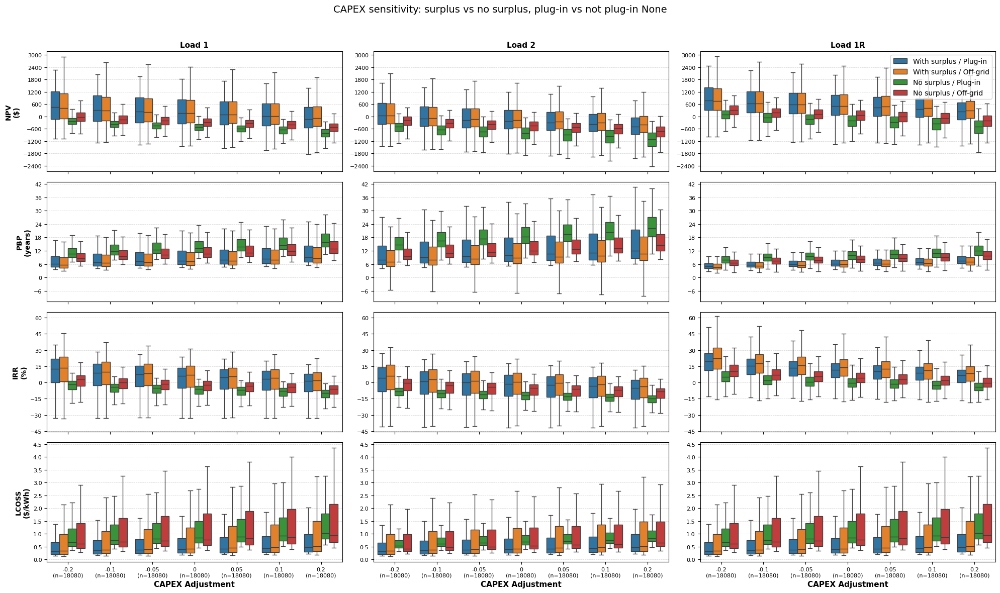

In [242]:
# Plot 1: Economic metrics (unfiltered — includes all systems, positive and negative NPV)
plot_capex_sensitivity_full(
    capex_sens_long,
    "economic_metrics",
    metrics=CAPEX_SENS_METRICS,
    units=UNITS
)

In [249]:
# #Energy/size metrics (filtered to positive-NPV systems only, per capex/surplus combo)
# ENERGY_METRICS = ["CSRP Flex", "DLRP Flex", "PV Size", "Battery Size"]
# capex_energy_long = capex_sens_full[capex_sens_full["metric"].isin(ENERGY_METRICS)]
# plot_capex_sensitivity_full(
#     capex_energy_long,
#     "energy_metrics_positive_npv",
#     metrics=ENERGY_METRICS,
#     units=UNITS_FULL,
#     title_suffix="(NPV>0)"
# )

In [245]:
def build_capex_sensitivity_long_filtered(df, id_cols=("network", "batModel", "pvW", "microinverter")):
    """Same as build_capex_sensitivity_long, but keeps only entries where NPV
    (from that same row, load, exact capex adjustment, and surplus assumption)
    is positive."""
    records = []
    id_col_arrays = {c: df[c].values for c in id_cols}

    for load in LOADS:
        npv_col_vals = df[f"{load}_NPV_capexSensitivity"].values
        for metric in CAPEX_SENS_METRICS:
            col = f"{load}_{metric}_capexSensitivity"
            col_vals = df[col].values
            for i, cell in enumerate(col_vals):
                if not isinstance(cell, dict):
                    continue
                npv_cell = npv_col_vals[i]
                if not isinstance(npv_cell, dict):
                    continue
                base = {ic: id_col_arrays[ic][i] for ic in id_cols}
                base["load"] = load
                base["metric"] = metric
                for capexMult, surplus_dict in cell.items():
                    if not isinstance(surplus_dict, dict):
                        continue
                    npv_surplus_dict = npv_cell.get(capexMult)
                    if not isinstance(npv_surplus_dict, dict):
                        continue
                    for surplus_key, val in surplus_dict.items():
                        npv_val = npv_surplus_dict.get(surplus_key)
                        if npv_val is None or not np.isfinite(npv_val) or npv_val <= 0:
                            continue  # only keep this row's value when its own NPV is positive
                        row = dict(base)
                        row["capexMultiplier"] = float(capexMult)
                        row["surplus"] = surplus_key
                        row["value"] = val
                        records.append(row)
    return pd.DataFrame(records)

capex_sens_long_filtered = build_capex_sensitivity_long_filtered(results_df_az180)

# drop non-finite values (getIRR can return nan, getPBP/getLCOSS can return inf on ~0 denominators)
capex_sens_long_filtered["value"] = pd.to_numeric(capex_sens_long_filtered["value"], errors="coerce")
capex_sens_long_filtered = capex_sens_long_filtered.replace([np.inf, -np.inf], np.nan).dropna(subset=["value"])

print(f"{len(capex_sens_long_filtered):,} rows")

593,128 rows


Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_energy_metrics_positive_npv_20260824_121334.png


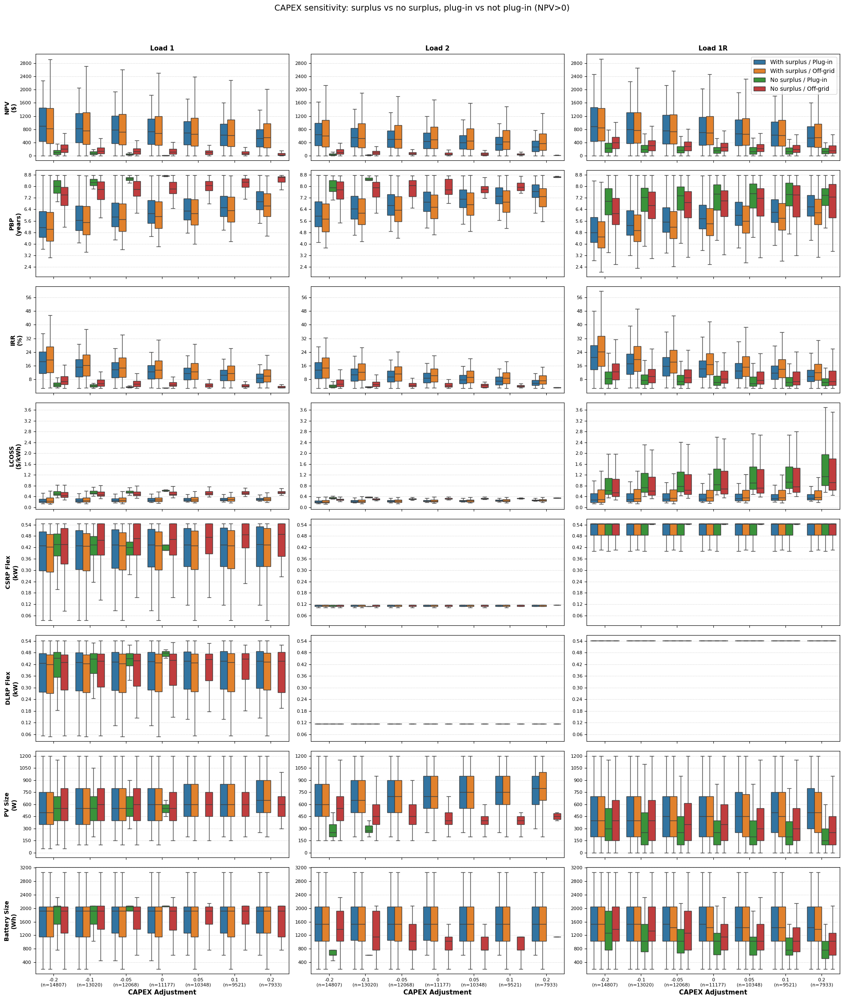

In [246]:
# Financial + energy/size metrics (filtered to positive-NPV systems only, per capex/surplus combo)
capex_full_positive_npv_long = pd.concat(
    [capex_sens_long_filtered, capex_flex_long, capex_static_long], ignore_index=True
)
plot_capex_sensitivity_full(
    capex_full_positive_npv_long,
    "energy_metrics_positive_npv",
    metrics=METRICS_FULL,
    units=UNITS_FULL,
    title_suffix="(NPV>0)"
)

In [125]:
# Map each load to its corresponding flex column, per program
FLEX_COL_MAP = {
    "csrp": {
        "load1": "csrpLoad1_flex",
        "load2": "csrpLoad2_flex",
        "load1R": "csrpLoad1replacement_flex",
    },
    "dlrp": {
        "load1": "dlrpLoad1_flex",
        "load2": "dlrpLoad2_flex",
        "load1R": "dlrpLoad1replacement_flex",
    },
}

def build_capex_positive_npv_flex(df, id_cols=("network", "batModel", "pvW", "microinverter")):
    """For each program (csrp/dlrp) / load / capexMultiplier / surplus combination,
    keep only rows where NPV (under that capex adjustment and surplus assumption)
    is positive, and record the corresponding average flex for that program/load."""
    records = []
    id_col_arrays = {c: df[c].values for c in id_cols}

    for program, load_map in FLEX_COL_MAP.items():
        for load in LOADS:
            npv_col = f"{load}_NPV_capexSensitivity"
            flex_col = load_map[load]

            npv_col_vals = df[npv_col].values
            flex_avg = df[flex_col].apply(
                lambda x: np.mean(x) if isinstance(x, (list, tuple, np.ndarray)) else np.nan
            ).values

            for i, cell in enumerate(npv_col_vals):
                if not isinstance(cell, dict):
                    continue
                base = {ic: id_col_arrays[ic][i] for ic in id_cols}
                base["load"] = load
                base["program"] = program
                flex_val = flex_avg[i]
                for capexMult, surplus_dict in cell.items():
                    if not isinstance(surplus_dict, dict):
                        continue
                    for surplus_key, npv_val in surplus_dict.items():
                        if npv_val is None or not np.isfinite(npv_val) or npv_val <= 0:
                            continue  # only keep positive NPV
                        row = dict(base)
                        row["capexMultiplier"] = float(capexMult)
                        row["surplus"] = surplus_key
                        row["flex"] = flex_val
                        records.append(row)
    return pd.DataFrame(records)

capex_posNPV_flex_long = build_capex_positive_npv_flex(results_df_az180)
capex_posNPV_flex_long = capex_posNPV_flex_long.dropna(subset=["flex"])

print(f"{len(capex_posNPV_flex_long):,} rows")
capex_posNPV_flex_long.head()

795,360 rows


,network,batModel,pvW,microinverter,load,program,capexMultiplier,surplus,flex
0,bowling green,Explorer 700 Plus,300,True,load1,csrp,-0.2,with_surplus,0.276736
1,bowling green,Explorer 700 Plus,300,True,load1,csrp,-0.1,with_surplus,0.276736
2,bowling green,Explorer 700 Plus,350,True,load1,csrp,-0.2,with_surplus,0.260817
3,bowling green,Explorer 700 Plus,350,True,load1,csrp,-0.2,with_surplus,0.301586
4,bowling green,Explorer 700 Plus,350,True,load1,csrp,-0.1,with_surplus,0.301586


In [254]:
# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)

# Convert IRR from decimal fraction to percentage, matching the plot function's treatment
capex_sens_with_size.loc[capex_sens_with_size["metric"] == "IRR", "value"] *= 100

# Median value per metric / capexMultiplier / surplus / plugin status (no load split)
median_by_group = (
    capex_sens_with_size.groupby(["metric", "capexMultiplier", "surplus", "microinverter"])["value"]
    .median()
    .reset_index()
)

median_by_group["capexPct"] = median_by_group["capexMultiplier"] * 100

def sensitivity_slope(g):
    if g["capexPct"].nunique() < 2:
        return np.nan
    slope, _ = np.polyfit(g["capexPct"], g["value"], 1)
    return slope

sensitivity_table = (
    median_by_group.groupby(["metric", "surplus", "microinverter"])
    .apply(sensitivity_slope)
    .reset_index(name="value_change_per_1pct_capex")
)

# Relabel plugin status for readability, and strip underscores from surplus labels
sensitivity_table["microinverter"] = sensitivity_table["microinverter"].map(
    {True: "Plug-in", False: "Off-grid"}
)
sensitivity_table["surplus"] = sensitivity_table["surplus"].str.replace("_", " ")

# Order metric columns explicitly so PV/battery size appear alongside the economic metrics sensibly
metric_order = list(CAPEX_SENS_METRICS) + ["PV Size", "Battery Size"]

sensitivity_pivot = sensitivity_table.pivot_table(
    index=["metric"],
    columns=["surplus", "microinverter"],
    values="value_change_per_1pct_capex"
).round(3)

sensitivity_pivot = sensitivity_pivot.reindex(metric_order)

# Rotate: capex-sensitivity groups become rows, metric becomes columns
sensitivity_pivot_rotated = sensitivity_pivot.T

# Remove the axis header labels without touching the actual row/column values
sensitivity_pivot_rotated.index.names = [None, None]
sensitivity_pivot_rotated.columns.name = None

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}/capex_sensitivity_slope_with_size_{timestamp}.csv"
sensitivity_pivot_rotated.to_csv(out_path)
print(f"Saved: {out_path}")

print("Change in Value per 1% CAPEX")
sensitivity_pivot_rotated

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_slope_with_size_20260824_132002.csv
Change in Value per 1% CAPEX


NPV    PBP    IRR  LCOSS  PV Size  Battery Size
with surplus    Off-grid -12.247  0.070 -0.289  0.005    2.619         0.000
                Plug-in  -14.463  0.075 -0.278  0.004    2.619         0.000
without surplus Off-grid -13.061  0.102 -0.223  0.008   -5.000       -14.438
                Plug-in  -14.096  0.132 -0.194  0.008   -5.000       -14.438

In [257]:
# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)
# Convert IRR from decimal fraction to percentage, matching the plot function's treatment
capex_sens_with_size.loc[capex_sens_with_size["metric"] == "IRR", "value"] *= 100
# Median value per metric / capexMultiplier / surplus / plugin status / load
median_by_group = (
    capex_sens_with_size.groupby(["metric", "capexMultiplier", "surplus", "microinverter", "load"])["value"]
    .median()
    .reset_index()
)
median_by_group["capexPct"] = median_by_group["capexMultiplier"] * 100
def sensitivity_slope(g):
    if g["capexPct"].nunique() < 2:
        return np.nan
    slope, _ = np.polyfit(g["capexPct"], g["value"], 1)
    return slope
sensitivity_table = (
    median_by_group.groupby(["metric", "surplus", "microinverter", "load"])
    .apply(sensitivity_slope)
    .reset_index(name="value_change_per_1pct_capex")
)
# Relabel plugin status for readability, and strip underscores from surplus labels
sensitivity_table["microinverter"] = sensitivity_table["microinverter"].map(
    {True: "Plug-in", False: "Off-grid"}
)
sensitivity_table["surplus"] = sensitivity_table["surplus"].str.replace("_", " ")
# Order metric columns explicitly so PV/battery size appear alongside the economic metrics sensibly
metric_order = list(CAPEX_SENS_METRICS) + ["PV Size", "Battery Size"]
sensitivity_pivot = sensitivity_table.pivot_table(
    index=["metric"],
    columns=["surplus", "microinverter", "load"],
    values="value_change_per_1pct_capex"
).round(3)
sensitivity_pivot = sensitivity_pivot.reindex(metric_order)
# Rotate: capex-sensitivity groups become rows, metric becomes columns
sensitivity_pivot_rotated = sensitivity_pivot.T
# Remove the axis header labels without touching the actual row/column values
sensitivity_pivot_rotated.index.names = [None, None, None]
sensitivity_pivot_rotated.columns.name = None
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}/capex_sensitivity_slope_with_size_by_load_{timestamp}.csv"
sensitivity_pivot_rotated.to_csv(out_path)
print(f"Saved: {out_path}")
print("Change in Value per 1% CAPEX (by load)")
sensitivity_pivot_rotated

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_slope_with_size_by_load_20260824_132720.csv
Change in Value per 1% CAPEX (by load)


NPV    PBP    IRR  LCOSS  PV Size  \
with surplus    Off-grid load1  -12.604  0.072 -0.284  0.005    3.571   
                         load1R -11.315  0.058 -0.350  0.005    2.619   
                         load2  -10.767  0.089 -0.236  0.005    5.000   
                Plug-in  load1  -15.073  0.076 -0.275  0.004    3.571   
                         load1R -13.660  0.062 -0.328  0.004    2.857   
                         load2  -13.131  0.100 -0.226  0.004    5.000   
without surplus Off-grid load1  -12.480  0.107 -0.218  0.008    0.952   
                         load1R -12.868  0.082 -0.260  0.008   -4.048   
                         load2  -13.229  0.120 -0.199  0.006   -2.619   
                Plug-in  load1  -14.143  0.132 -0.195  0.009   -0.000   
                         load1R -14.760  0.100 -0.231  0.009   -3.571   
                         load2  -14.826  0.184 -0.164  0.007    2.500   

                                 Battery Size  
with surplus    Off-grid load1          0.000  
                         load1R        -3.914  
                         load2          0.000  
                Plug-in  load1          0.000  
                         load1R        -3.433  
                         load2          0.000  
without surplus Off-grid load1          0.000  
                         load1R       -10.879  
                         load2         -5.600  
                Plug-in  load1          1.731  
                         load1R       -11.898  
                         load2         -0.000

In [258]:
# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)
# Convert IRR from decimal fraction to percentage, matching the plot function's treatment
capex_sens_with_size.loc[capex_sens_with_size["metric"] == "IRR", "value"] *= 100
# Median value per metric / capexMultiplier / surplus / plugin status / network
median_by_group = (
    capex_sens_with_size.groupby(["metric", "capexMultiplier", "surplus", "microinverter", "network"])["value"]
    .median()
    .reset_index()
)
median_by_group["capexPct"] = median_by_group["capexMultiplier"] * 100
def sensitivity_slope(g):
    if g["capexPct"].nunique() < 2:
        return np.nan
    slope, _ = np.polyfit(g["capexPct"], g["value"], 1)
    return slope
sensitivity_table = (
    median_by_group.groupby(["metric", "surplus", "microinverter", "network"])
    .apply(sensitivity_slope)
    .reset_index(name="value_change_per_1pct_capex")
)
# Relabel plugin status for readability, and strip underscores from surplus labels
sensitivity_table["microinverter"] = sensitivity_table["microinverter"].map(
    {True: "Plug-in", False: "Off-grid"}
)
sensitivity_table["surplus"] = sensitivity_table["surplus"].str.replace("_", " ")
# Order metric columns explicitly so PV/battery size appear alongside the economic metrics sensibly
metric_order = list(CAPEX_SENS_METRICS) + ["PV Size", "Battery Size"]
sensitivity_pivot = sensitivity_table.pivot_table(
    index=["metric"],
    columns=["surplus", "microinverter", "network"],
    values="value_change_per_1pct_capex"
).round(3)
sensitivity_pivot = sensitivity_pivot.reindex(metric_order)
# Rotate: capex-sensitivity groups become rows, metric becomes columns
sensitivity_pivot_rotated = sensitivity_pivot.T
# Remove the axis header labels without touching the actual row/column values
sensitivity_pivot_rotated.index.names = [None, None, None]
sensitivity_pivot_rotated.columns.name = None
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}/capex_sensitivity_slope_with_size_by_network_{timestamp}.csv"
sensitivity_pivot_rotated.to_csv(out_path)
print(f"Saved: {out_path}")
print("Change in Value per 1% CAPEX (by network)")
sensitivity_pivot_rotated

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_slope_with_size_by_network_20260824_133604.csv
Change in Value per 1% CAPEX (by network)


NPV    PBP    IRR  LCOSS  PV Size  \
with surplus    Off-grid borden        -12.125  0.069 -0.297  0.005    2.857   
                         bowling green -12.148  0.069 -0.297  0.005    2.857   
                         central bronx -12.229  0.067 -0.303  0.005    2.619   
                         fordham       -12.256  0.066 -0.306  0.005    2.619   
                         fresh kills   -11.523  0.079 -0.263  0.005    3.571   
                         grasslands    -11.639  0.079 -0.265  0.005    3.571   
                         park slope    -12.020  0.065 -0.309  0.005    2.619   
                         sunnyside     -11.976  0.070 -0.290  0.005    2.976   
                Plug-in  borden        -14.736  0.077 -0.275  0.004    2.619   
                         bowling green -14.460  0.079 -0.267  0.004    3.571   
                         central bronx -14.225  0.069 -0.298  0.004    2.619   
                         fordham       -14.487  0.070 -0.297  0.004    2.619   
                         fresh kills   -13.990  0.081 -0.270  0.004    4.048   
                         grasslands    -13.987  0.083 -0.263  0.004    3.571   
                         park slope    -15.036  0.073 -0.291  0.004    2.619   
                         sunnyside     -14.402  0.074 -0.281  0.004    3.095   
without surplus Off-grid borden        -13.837  0.098 -0.230  0.007   -7.143   
                         bowling green -13.681  0.095 -0.234  0.007   -6.190   
                         central bronx -13.523  0.100 -0.226  0.008   -5.000   
                         fordham       -13.855  0.095 -0.236  0.008   -3.810   
                         fresh kills   -13.170  0.124 -0.200  0.008   -7.143   
                         grasslands    -13.408  0.117 -0.204  0.008   -9.048   
                         park slope    -13.785  0.090 -0.243  0.007   -2.619   
                         sunnyside     -13.776  0.102 -0.223  0.008   -6.905   
                Plug-in  borden        -14.640  0.133 -0.196  0.008   -3.571   
                         bowling green -14.625  0.142 -0.189  0.009   -2.381   
                         central bronx -14.617  0.114 -0.213  0.008   -5.000   
                         fordham       -14.540  0.115 -0.208  0.008   -5.714   
                         fresh kills   -14.771  0.144 -0.186  0.008   -2.286   
                         grasslands    -14.759  0.150 -0.182  0.008   -4.643   
                         park slope    -14.635  0.122 -0.205  0.008   -5.357   
                         sunnyside     -14.492  0.126 -0.202  0.008   -5.238   

                                        Battery Size  
with surplus    Off-grid borden                0.000  
                         bowling green         0.000  
                         central bronx         0.000  
                         fordham               0.000  
                         fresh kills           0.000  
                         grasslands            0.000  
                         park slope            0.000  
                         sunnyside             0.000  
                Plug-in  borden                0.000  
                         bowling green         0.000  
                         central bronx         0.000  
                         fordham               0.000  
                         fresh kills           0.000  
                         grasslands            0.000  
                         park slope            0.000  
                         sunnyside             0.000  
without surplus Off-grid borden              -20.295  
                         bowling green       -15.419  
                         central bronx       -15.419  
                         fordham             -14.390  
                         fresh kills         -13.905  
                         grasslands          -18.590  
                         park slope          -12.461  
                         sunnyside           -19.032  
                Plug-in  bo

In [255]:
# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)
# Filter to a single network
capex_sens_with_size = capex_sens_with_size[capex_sens_with_size["network"] == "sunnyside"]
# Median value per metric / capexMultiplier / surplus / plugin status (no load split)

# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)

# Convert IRR from decimal fraction to percentage, matching the plot function's treatment
capex_sens_with_size.loc[capex_sens_with_size["metric"] == "IRR", "value"] *= 100
median_by_group = (
    capex_sens_with_size.groupby(["metric", "capexMultiplier", "surplus", "microinverter"])["value"]
    .median()
    .reset_index()
)
median_by_group["capexPct"] = median_by_group["capexMultiplier"] * 100
def sensitivity_slope(g):
    if g["capexPct"].nunique() < 2:
        return np.nan
    slope, _ = np.polyfit(g["capexPct"], g["value"], 1)
    return slope
sensitivity_table = (
    median_by_group.groupby(["metric", "surplus", "microinverter"])
    .apply(sensitivity_slope)
    .reset_index(name="value_change_per_1pct_capex")
)
# Relabel plugin status for readability, and strip underscores from surplus labels
sensitivity_table["microinverter"] = sensitivity_table["microinverter"].map(
    {True: "Plug-in", False: "Off-grid"}
)
sensitivity_table["surplus"] = sensitivity_table["surplus"].str.replace("_", " ")
# Order metric columns explicitly so PV/battery size appear alongside the economic metrics sensibly
metric_order = list(CAPEX_SENS_METRICS) + ["PV Size", "Battery Size"]
sensitivity_pivot = sensitivity_table.pivot_table(
    index=["metric"],
    columns=["surplus", "microinverter"],
    values="value_change_per_1pct_capex"
).round(3)
sensitivity_pivot = sensitivity_pivot.reindex(metric_order)
# Rotate: capex-sensitivity groups become rows, metric becomes columns
sensitivity_pivot_rotated = sensitivity_pivot.T
# Remove the axis header labels without touching the actual row/column values
sensitivity_pivot_rotated.index.names = [None, None]
sensitivity_pivot_rotated.columns.name = None
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}/capex_sensitivity_slope_with_size_sunnyside_{timestamp}.csv"
sensitivity_pivot_rotated.to_csv(out_path)
print(f"Saved: {out_path}")
print("Change in Median Value per 1% CAPEX (Sunnyside network)")
sensitivity_pivot_rotated

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_slope_with_size_sunnyside_20260824_132034.csv
Change in Median Value per 1% CAPEX (Sunnyside network)


NPV    PBP    IRR  LCOSS  PV Size  Battery Size
with surplus    Off-grid -12.247  0.070 -0.289  0.005    2.619         0.000
                Plug-in  -14.463  0.075 -0.278  0.004    2.619         0.000
without surplus Off-grid -13.061  0.102 -0.223  0.008   -5.000       -14.438
                Plug-in  -14.096  0.132 -0.194  0.008   -5.000       -14.438

In [256]:
# Combine economic metrics with PV/battery size metrics
capex_sens_with_size = pd.concat([capex_sens_long, capex_static_long], ignore_index=True)

# Convert IRR from decimal fraction to percentage, matching the plot function's treatment
capex_sens_with_size.loc[capex_sens_with_size["metric"] == "IRR", "value"] *= 100

# Min / median / mean / max per metric / capexMultiplier / surplus / plugin status (no load split)
stats_by_group = (
    capex_sens_with_size.groupby(["metric", "capexMultiplier", "surplus", "microinverter"])["value"]
    .agg(["min", "median", "mean", "max"])
    .reset_index()
)
stats_by_group["capexPct"] = stats_by_group["capexMultiplier"] * 100

def sensitivity_slope(g, stat_col):
    if g["capexPct"].nunique() < 2:
        return np.nan
    slope, _ = np.polyfit(g["capexPct"], g[stat_col], 1)
    return slope

STAT_COLS = ["min", "median", "mean", "max"]
metric_order = list(CAPEX_SENS_METRICS) + ["PV Size", "Battery Size"]

pivots = {}
for stat_col in STAT_COLS:
    sensitivity_table = (
        stats_by_group.groupby(["metric", "surplus", "microinverter"])
        .apply(lambda g: sensitivity_slope(g, stat_col))
        .reset_index(name="value_change_per_1pct_capex")
    )
    # Relabel plugin status for readability, and strip underscores from surplus labels
    sensitivity_table["microinverter"] = sensitivity_table["microinverter"].map(
        {True: "Plug-in", False: "Off-grid"}
    )
    sensitivity_table["surplus"] = sensitivity_table["surplus"].str.replace("_", " ")
    sensitivity_pivot = sensitivity_table.pivot_table(
        index=["metric"],
        columns=["surplus", "microinverter"],
        values="value_change_per_1pct_capex"
    ).round(3)
    sensitivity_pivot = sensitivity_pivot.reindex(metric_order)
    # Rotate: capex-sensitivity groups become rows, metric becomes columns
    sensitivity_pivot_rotated = sensitivity_pivot.T
    sensitivity_pivot_rotated.index.names = [None, None]
    sensitivity_pivot_rotated.columns.name = None
    pivots[stat_col] = sensitivity_pivot_rotated

# Stack min/median/mean/max on top of each other with a "stat" label
combined = pd.concat(pivots, names=["stat"])

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}/capex_sensitivity_slope_with_size_stats_{timestamp}.csv"
combined.to_csv(out_path)
print(f"Saved: {out_path}")
print("Change in Value per 1% CAPEX (min / median / mean / max)")
combined

Saved: results/final_aug17/primary_w_azimuth//capex_sensitivity_slope_with_size_stats_20260824_132345.csv
Change in Value per 1% CAPEX (min / median / mean / max)


NPV      PBP    IRR  LCOSS  PV Size  \
stat                                                                      
min    with surplus    Off-grid -16.320 -195.629 -0.092  0.002    0.000   
                       Plug-in  -18.667  -59.245 -0.077  0.002    0.000   
       without surplus Off-grid -16.320 -195.629 -0.092  0.003    0.000   
                       Plug-in  -28.858  -59.245 -0.069  0.004    0.000   
median with surplus    Off-grid -12.247    0.070 -0.289  0.005    2.619   
                       Plug-in  -14.463    0.075 -0.278  0.004    2.619   
       without surplus Off-grid -13.061    0.102 -0.223  0.008   -5.000   
                       Plug-in  -14.096    0.132 -0.194  0.008   -5.000   
mean   with surplus    Off-grid -13.219    0.042 -0.300  0.038    2.347   
                       Plug-in  -15.152    0.092 -0.277  0.030    2.584   
       without surplus Off-grid -13.219    0.060 -0.233  0.041   -4.952   
                       Plug-in  -15.152    0.140 -0.199  0.035   -5.208   
max    with surplus    Off-grid -21.034   93.800 -1.205  0.559    0.000   
                       Plug-in  -21.617   19.675 -0.644  0.737    0.000   
       without surplus Off-grid  -9.586   90.201 -0.963  0.559   -3.810   
                       Plug-in  -10.489   19.675 -0.514  0.737  -14.762   

                                 Battery Size  
stat                                           
min    with surplus    Off-grid         0.000  
                       Plug-in          0.000  
       without surplus Off-grid         0.000  
                       Plug-in          0.000  
median with surplus    Off-grid         0.000  
                       Plug-in          0.000  
       without surplus Off-grid       -14.438  
                       Plug-in        -14.438  
mean   with surplus    Off-grid        -0.702  
                       Plug-in         -0.744  
       without surplus Off-grid       -13.178  
                       Plug-in        -15.565  
max    with surplus    Off-grid         0.000  
                       Plug-in          0.000  
       without surplus Off-grid       -31.343  
                       Plug-in        -32.310

## Azimuth Sensitivity

In [124]:

# def extract_metric(df, load, metric, surplus_key):
#     """Pull a flat numeric Series out of the {load}_{metric} dict column."""
#     return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

# SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
# AZIMUTHS = [90, 180, 270]
# AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
# NETWORKS = sorted(results_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]
# load = "load1"
# iEA = 0
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# base_df = results_df[results_df["immediateEventAmt"] == iEA]

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(8, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)
#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]
#             npv = extract_metric(subset, load, "NPV", sk)
#             data = []
#             n_per_az = []
#             for az in AZIMUTHS:
#                 az_npv = npv[subset["az"] == az]  # .dropna()
#                 az_npv_positive = az_npv[az_npv >= 0]
#                 data.append(az_npv_positive)
#                 n_per_az.append(len(az_npv_positive))
#             bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
#                              widths=0.5, showfliers=True, patch_artist=True,
#                              flierprops=dict(marker="o", markersize=3, alpha=0.4))
#             for patch, az in zip(bp["boxes"], AZIMUTHS):
#                 patch.set_facecolor(AZ_COLORS[az])
#                 patch.set_alpha(0.6)
#             # annotate sample size directly above each box, at a consistent relative height
#             ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
#             for i, n in enumerate(n_per_az):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")
#             ax.set_xticks(range(1, len(AZIMUTHS) + 1))
#             ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
#             ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
#             ax.margins(y=0.15)  # leave room at top for the n= annotations
#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
#             ax.set_axisbelow(True)  # keep gridlines behind the boxplots
#             ax.tick_params(axis="y", labelsize=7)
#             if col == 0:
#                 ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold",pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Azimuth", fontsize=9)
#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 positive NPV by azimuth, network, and configuration ({surplus_label})\n"
#                  f"immediate event amount = 0",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()
#     filename = f"results/{directory}{d}npv_load1_positive_by_azimuth_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()
#     print(f"Saved: {filename}")

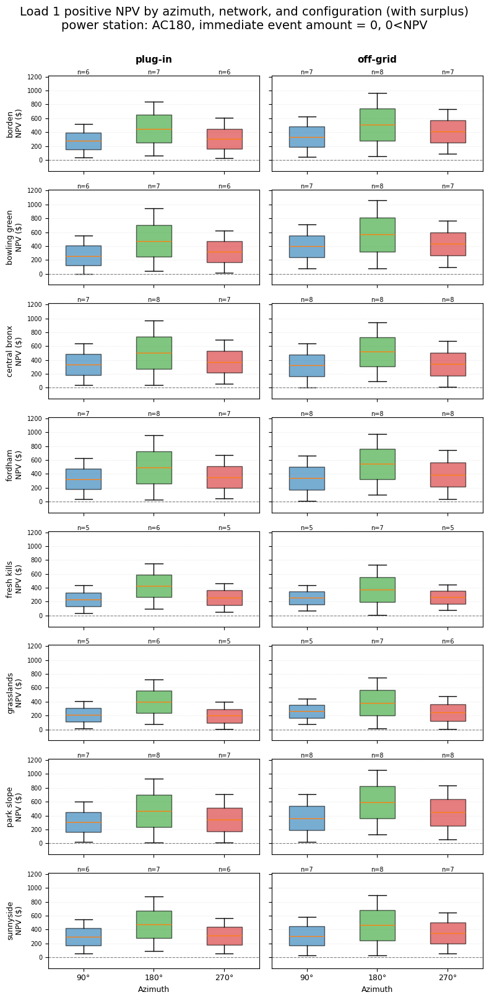

Saved: results/final_aug17/primary_w_azimuth/npv_load1_positive_by_azimuth_AC180_with_surplus_20260824_153940.png


In [265]:
def extract_metric(df, load, metric, surplus_key):
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
AZIMUTHS = [90, 180, 270]
AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
NETWORKS = sorted(results_df["network"].unique())
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
iEA = 0
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")


batModel = "AC180"

base_df = results_df[
    (results_df["immediateEventAmt"] == iEA) &
    (results_df["batModel"] == batModel)
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            data = []
            n_per_az = []
            for az in AZIMUTHS:
                az_npv = npv[subset["az"] == az]  # .dropna()
                az_npv_positive = az_npv[az_npv >= 0]
                data.append(az_npv_positive)
                n_per_az.append(len(az_npv_positive))
            bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, az in zip(bp["boxes"], AZIMUTHS):
                patch.set_facecolor(AZ_COLORS[az])
                patch.set_alpha(0.6)
            # annotate sample size directly above each box, at a consistent relative height
            ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
            for i, n in enumerate(n_per_az):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(AZIMUTHS) + 1))
            ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the boxplots
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold",pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Azimuth", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by azimuth, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, 0<NPV",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"results/{directory}{d}npv_load1_positive_by_azimuth_{batModel.replace(' ','')}_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

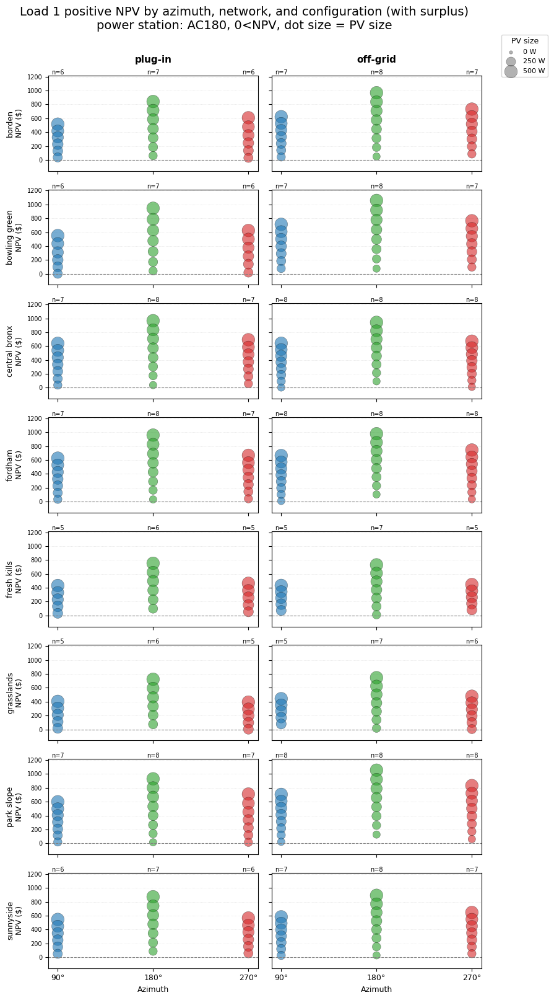

Saved: results/final_aug17/primary_w_azimuth/npv_load1_positive_by_azimuth_pvsize_AC180_with_surplus_20260828_190127.png


In [130]:
# def extract_metric(df, load, metric, surplus_key):
#     """Pull a flat numeric Series out of the {load}_{metric} dict column."""
#     return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

# def pv_size_to_marker_size(pv_vals, pv_min, pv_max, size_min=15, size_max=220):
#     """Linearly scale PV size (W) to a marker area for scatter plotting."""
#     pv_vals = np.asarray(pv_vals, dtype=float)
#     if pv_max == pv_min:
#         return np.full_like(pv_vals, (size_min + size_max) / 2)
#     frac = (pv_vals - pv_min) / (pv_max - pv_min)
#     return size_min + frac * (size_max - size_min)

# SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
# AZIMUTHS = [90, 180, 270]
# AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
# NETWORKS = sorted(results_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]
# load = "load1"
# iEA = 0
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# batModel = "AC180"
# base_df = results_df[
#     (results_df["immediateEventAmt"] == iEA) &
#     (results_df["batModel"] == batModel)
# ]

# # global PV size range so marker sizes are comparable across all subplots
# pv_min_global = base_df["pvW"].min()
# pv_max_global = base_df["pvW"].max()

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(8, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)
#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]
#             npv = extract_metric(subset, load, "NPV", sk)
#             n_per_az = []
#             for i, az in enumerate(AZIMUTHS):
#                 az_mask = subset["az"] == az
#                 az_npv = npv[az_mask]
#                 az_npv_positive = az_npv[az_npv >= 0]
#                 az_pv_size = subset.loc[az_npv_positive.index, "pvW"]
#                 n_per_az.append(len(az_npv_positive))

#                 if len(az_npv_positive) == 0:
#                     continue

#                 x_vals = np.full(len(az_npv_positive), i + 1)
#                 marker_sizes = pv_size_to_marker_size(az_pv_size, pv_min_global, pv_max_global)

#                 ax.scatter(x_vals, az_npv_positive, s=marker_sizes,
#                            color=AZ_COLORS[az], alpha=0.6,
#                            edgecolors="black", linewidths=0.3)

#             # annotate sample size directly above each group, at a consistent relative height
#             for i, n in enumerate(n_per_az):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")
#             ax.set_xticks(range(1, len(AZIMUTHS) + 1))
#             ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
#             ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
#             ax.margins(y=0.15)  # leave room at top for the n= annotations
#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
#             ax.set_axisbelow(True)  # keep gridlines behind the dots
#             ax.tick_params(axis="y", labelsize=7)
#             if col == 0:
#                 ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Azimuth", fontsize=9)

#     # size legend for PV size (built from representative min/median/max values)
#     pv_legend_vals = [pv_min_global, (pv_min_global + pv_max_global) / 2, pv_max_global]
#     pv_legend_sizes = pv_size_to_marker_size(pv_legend_vals, pv_min_global, pv_max_global)
#     legend_handles = [
#         plt.scatter([], [], s=s, color="gray", alpha=0.6, edgecolors="black", linewidths=0.3,
#                     label=f"{int(v)} W")
#         for v, s in zip(pv_legend_vals, pv_legend_sizes)
#     ]
#     fig.legend(handles=legend_handles, title="PV size", loc="upper right",
#                bbox_to_anchor=(1.12, 0.98), fontsize=8, title_fontsize=9, frameon=True)

#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 positive NPV by azimuth, network, and configuration ({surplus_label})\n"
#                  f"power station: {batModel}, 0<NPV, dot size = PV size",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()

#     timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
#     filename = f"results/{directory}{d}npv_load1_positive_by_azimuth_pvsize_{batModel.replace(' ','')}_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()
#     print(f"Saved: {filename}")

def extract_metric(df, load, metric, surplus_key):
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

def pv_size_to_marker_size(pv_vals, pv_min, pv_max, size_min=15, size_max=220):
    """Linearly scale PV size (W) to a marker area for scatter plotting."""
    pv_vals = np.asarray(pv_vals, dtype=float)
    if pv_max == pv_min:
        return np.full_like(pv_vals, (size_min + size_max) / 2)
    frac = (pv_vals - pv_min) / (pv_max - pv_min)
    return size_min + frac * (size_max - size_min)

SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
AZIMUTHS = [90, 180, 270]
AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
NETWORKS = sorted(results_df["network"].unique())
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
iEA = 0
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
batModel = "AC180"
base_df = results_df[
    (results_df["immediateEventAmt"] == iEA) &
    (results_df["batModel"] == batModel)
]

# global PV size range so marker sizes are comparable across all subplots
pv_min_global = base_df["pvW"].min()
pv_max_global = base_df["pvW"].max()

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            n_per_az = []
            for i, az in enumerate(AZIMUTHS):
                az_mask = subset["az"] == az
                az_npv = npv[az_mask]
                az_npv_positive = az_npv[az_npv >= 0]
                az_pv_size = subset.loc[az_npv_positive.index, "pvW"]
                n_per_az.append(len(az_npv_positive))

                if len(az_npv_positive) == 0:
                    continue

                # sort largest PV size first so smaller dots get drawn on top (and visible if overlapping)
                sort_order = az_pv_size.sort_values(ascending=False).index
                az_npv_sorted = az_npv_positive.loc[sort_order]
                az_pv_size_sorted = az_pv_size.loc[sort_order]

                x_vals = np.full(len(az_npv_sorted), i + 1)
                marker_sizes = pv_size_to_marker_size(az_pv_size_sorted, pv_min_global, pv_max_global)

                ax.scatter(x_vals, az_npv_sorted, s=marker_sizes,
                           color=AZ_COLORS[az], alpha=0.6,
                           edgecolors="black", linewidths=0.3)

            # annotate sample size directly above each group, at a consistent relative height
            for i, n in enumerate(n_per_az):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(AZIMUTHS) + 1))
            ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the dots
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Azimuth", fontsize=9)

    # size legend for PV size (built from representative min/median/max values)
    pv_legend_vals = [pv_min_global, (pv_min_global + pv_max_global) / 2, pv_max_global]
    pv_legend_sizes = pv_size_to_marker_size(pv_legend_vals, pv_min_global, pv_max_global)
    legend_handles = [
        plt.scatter([], [], s=s, color="gray", alpha=0.6, edgecolors="black", linewidths=0.3,
                    label=f"{int(v)} W")
        for v, s in zip(pv_legend_vals, pv_legend_sizes)
    ]
    fig.legend(handles=legend_handles, title="PV size", loc="upper right",
               bbox_to_anchor=(1.12, 0.98), fontsize=8, title_fontsize=9, frameon=True)

    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by azimuth, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, 0<NPV, dot size = PV size",
                 fontsize=14, y=1.005)
    fig.tight_layout()

    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"results/{directory}{d}npv_load1_positive_by_azimuth_pvsize_{batModel.replace(' ','')}_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

In [123]:

# def extract_metric(df, load, metric, surplus_key):
#     """Pull a flat numeric Series out of the {load}_{metric} dict column."""
#     return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

# SURPLUS_KEYS = ["with_surplus"]
# AZIMUTHS = [90, 180, 270]
# AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}

# NETWORKS = sorted(results_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]

# load = "load1"
# csrp_col = "csrpLoad1_flex"
# iEA = 0
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# base_df = results_df[results_df["immediateEventAmt"] == iEA]

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(11, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)

#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]

#             npv = extract_metric(subset, load, "NPV", sk)
#             csrp_flex = subset[csrp_col].apply(np.mean)

#             data = []
#             n_per_az = []
#             for az in AZIMUTHS:
#                 az_mask = subset["az"] == az
#                 az_npv = npv[az_mask]
#                 positive_mask = az_npv >= 0  # filter to rows with positive NPV
#                 az_csrp = csrp_flex[az_mask][positive_mask].dropna()
#                 data.append(az_csrp)
#                 n_per_az.append(len(az_csrp))

#             bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
#                              widths=0.5, showfliers=True, patch_artist=True,
#                              flierprops=dict(marker="o", markersize=3, alpha=0.4))
#             for patch, az in zip(bp["boxes"], AZIMUTHS):
#                 patch.set_facecolor(AZ_COLORS[az])
#                 patch.set_alpha(0.6)

#             for i, n in enumerate(n_per_az):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")

#             ax.set_xticks(range(1, len(AZIMUTHS) + 1))
#             ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
#             ax.margins(y=0.15)

#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)


#             if col == 0:
#                 ax.set_ylabel(f"{net}\nCSRP flex (kW)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Azimuth", fontsize=9)

#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 CSRP flex by azimuth, network, and configuration ({surplus_label})\n"
#                  f"immediate event amount = 0, filtered to positive NPV",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()

#     filename = f"results/{directory}{d}csrp_flex_load1_positive_npv_by_azimuth_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()

#     print(f"Saved: {filename}")

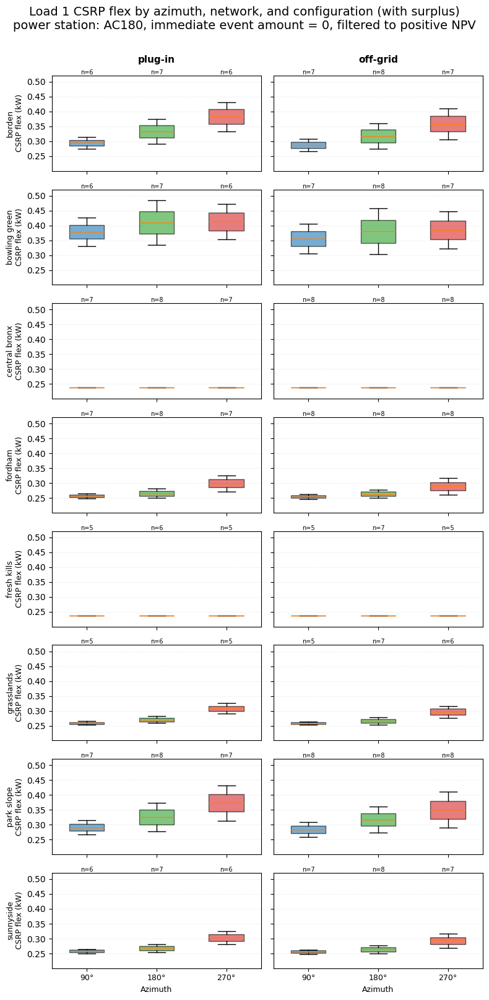

Saved: results/final_aug17/primary_w_azimuth/csrp_flex_load1_AC180_positive_npv_by_azimuth_with_surplus_20260824_154212.png


In [269]:

def extract_metric(df, load, metric, surplus_key):
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

SURPLUS_KEYS = ["with_surplus"]
AZIMUTHS = [90, 180, 270]
AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
NETWORKS = sorted(results_df["network"].unique())
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
csrp_col = "csrpLoad1_flex"
iEA = 0
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = results_df[
    (results_df["immediateEventAmt"] == iEA) &
    (results_df["batModel"] == batModel)
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            csrp_flex = subset[csrp_col].apply(np.mean)
            data = []
            n_per_az = []
            for az in AZIMUTHS:
                az_mask = subset["az"] == az
                az_npv = npv[az_mask]
                positive_mask = az_npv >= 0  # filter to rows with positive NPV
                az_csrp = csrp_flex[az_mask][positive_mask].dropna()
                data.append(az_csrp)
                n_per_az.append(len(az_csrp))
            bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, az in zip(bp["boxes"], AZIMUTHS):
                patch.set_facecolor(AZ_COLORS[az])
                patch.set_alpha(0.6)
            for i, n in enumerate(n_per_az):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(AZIMUTHS) + 1))
            ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
            ax.margins(y=0.15)
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            if col == 0:
                ax.set_ylabel(f"{net}\nCSRP flex (kW)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold",pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Azimuth", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 CSRP flex by azimuth, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, filtered to positive NPV",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"results/{directory}{d}csrp_flex_load1_{batModel.replace(' ','')}_positive_npv_by_azimuth_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

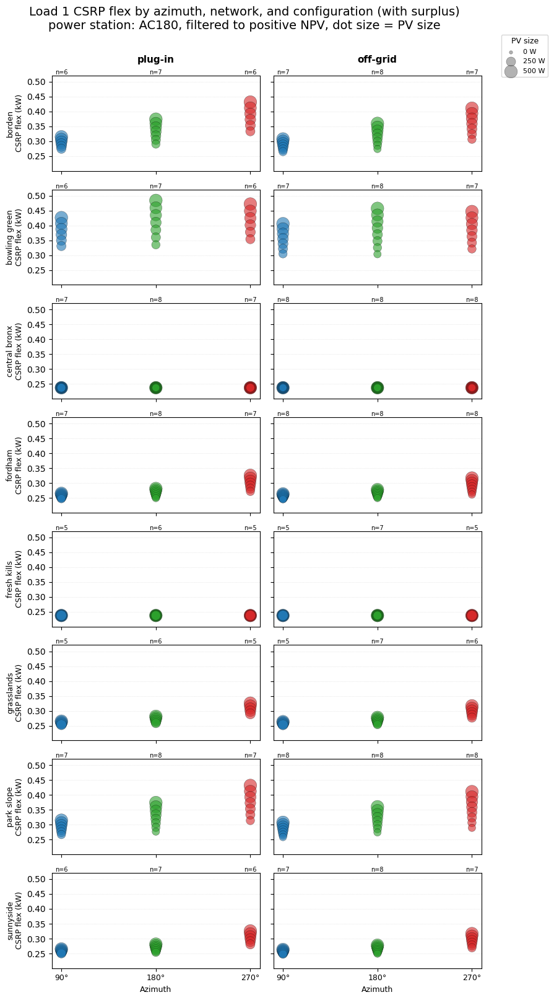

Saved: results/final_aug17/primary_w_azimuth/csrp_flex_load1_AC180_positive_npv_by_azimuth_pvsize_with_surplus_20260828_185605.png


In [129]:
def extract_metric(df, load, metric, surplus_key):
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

def pv_size_to_marker_size(pv_vals, pv_min, pv_max, size_min=15, size_max=220):
    """Linearly scale PV size (W) to a marker area for scatter plotting."""
    pv_vals = np.asarray(pv_vals, dtype=float)
    if pv_max == pv_min:
        return np.full_like(pv_vals, (size_min + size_max) / 2)
    frac = (pv_vals - pv_min) / (pv_max - pv_min)
    return size_min + frac * (size_max - size_min)

SURPLUS_KEYS = ["with_surplus"]
AZIMUTHS = [90, 180, 270]
AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
NETWORKS = sorted(results_df["network"].unique())
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
csrp_col = "csrpLoad1_flex"
iEA = 0
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
base_df = results_df[
    (results_df["immediateEventAmt"] == iEA) &
    (results_df["batModel"] == batModel)
]

# global PV size range so marker sizes are comparable across all subplots
pv_min_global = base_df["pvW"].min()
pv_max_global = base_df["pvW"].max()

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            csrp_flex = subset[csrp_col].apply(np.mean)
            n_per_az = []
            for i, az in enumerate(AZIMUTHS):
                az_mask = subset["az"] == az
                az_npv = npv[az_mask]
                positive_mask = az_npv >= 0  # filter to rows with positive NPV
                az_csrp = csrp_flex[az_mask][positive_mask].dropna()
                az_pv_size = subset.loc[az_csrp.index, "pvW"]
                n_per_az.append(len(az_csrp))

                if len(az_csrp) == 0:
                    continue

                # sort largest PV size first so smaller dots get drawn on top (and visible if overlapping)
                sort_order = az_pv_size.sort_values(ascending=False).index
                az_csrp_sorted = az_csrp.loc[sort_order]
                az_pv_size_sorted = az_pv_size.loc[sort_order]

                x_vals = np.full(len(az_csrp_sorted), i + 1)
                marker_sizes = pv_size_to_marker_size(az_pv_size_sorted, pv_min_global, pv_max_global)

                ax.scatter(x_vals, az_csrp_sorted, s=marker_sizes,
                           color=AZ_COLORS[az], alpha=0.6,
                           edgecolors="black", linewidths=0.3)

            for i, n in enumerate(n_per_az):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(AZIMUTHS) + 1))
            ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
            ax.margins(y=0.15)
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the dots
            if col == 0:
                ax.set_ylabel(f"{net}\nCSRP flex (kW)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Azimuth", fontsize=9)

    # size legend for PV size (built from representative min/median/max values)
    pv_legend_vals = [pv_min_global, (pv_min_global + pv_max_global) / 2, pv_max_global]
    pv_legend_sizes = pv_size_to_marker_size(pv_legend_vals, pv_min_global, pv_max_global)
    legend_handles = [
        plt.scatter([], [], s=s, color="gray", alpha=0.6, edgecolors="black", linewidths=0.3,
                    label=f"{int(v)} W")
        for v, s in zip(pv_legend_vals, pv_legend_sizes)
    ]
    fig.legend(handles=legend_handles, title="PV size", loc="upper right",
               bbox_to_anchor=(1.12, 0.98), fontsize=8, title_fontsize=9, frameon=True)

    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 CSRP flex by azimuth, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, filtered to positive NPV, dot size = PV size",
                 fontsize=14, y=1.005)
    fig.tight_layout()

    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"results/{directory}{d}csrp_flex_load1_{batModel.replace(' ','')}_positive_npv_by_azimuth_pvsize_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

In [122]:

# def extract_metric(df, load, metric, surplus_key):
#     """Pull a flat numeric Series out of the {load}_{metric} dict column."""
#     return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

# SURPLUS_KEYS = ["with_surplus"]
# AZIMUTHS = [90, 180, 270]
# AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}
# NETWORKS = sorted(results_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]
# load = "load1"
# csrp_col = "csrpLoad1_flex"
# iEA = 0
# batModel = "Elite 200V2"
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# base_df = results_df[
#     (results_df["immediateEventAmt"] == iEA) &
#     (results_df["batModel"] == batModel)
# ]

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(11, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)
#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]
#             npv = extract_metric(subset, load, "NPV", sk)
#             csrp_flex = subset[csrp_col].apply(np.mean)
#             data = []
#             n_per_az = []
#             for az in AZIMUTHS:
#                 az_mask = subset["az"] == az
#                 az_npv = npv[az_mask]
#                 positive_mask = az_npv >= 0  # filter to rows with positive NPV
#                 az_csrp = csrp_flex[az_mask][positive_mask].dropna()
#                 data.append(az_csrp)
#                 n_per_az.append(len(az_csrp))
#             bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
#                              widths=0.5, showfliers=True, patch_artist=True,
#                              flierprops=dict(marker="o", markersize=3, alpha=0.4))
#             for patch, az in zip(bp["boxes"], AZIMUTHS):
#                 patch.set_facecolor(AZ_COLORS[az])
#                 patch.set_alpha(0.6)
#             for i, n in enumerate(n_per_az):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")
#             ax.set_xticks(range(1, len(AZIMUTHS) + 1))
#             ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
#             ax.margins(y=0.15)
#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
#             if col == 0:
#                 ax.set_ylabel(f"{net}\nCSRP flex (kW)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold")
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Azimuth", fontsize=9)
#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 CSRP flex by azimuth, network, and configuration ({surplus_label})\n"
#                  f"power station: {batModel}, immediate event amount = 0, filtered to positive NPV",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()
#     filename = f"results/{directory}{d}csrp_flex_load1_{batModel.replace(' ','')}_positive_npv_by_azimuth_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()
#     print(f"Saved: {filename}")

In [121]:

# def extract_metric(df, load, metric, surplus_key):
#     """Pull a flat numeric Series out of the {load}_{metric} dict column."""
#     return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

# SURPLUS_KEYS = ["with_surplus"]
# AZIMUTHS = [90, 180, 270]
# AZ_COLORS = {90: "#1f77b4", 180: "#2ca02c", 270: "#d62728"}

# NETWORKS = sorted(results_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]

# load = "load1R"
# csrp_col = "csrpLoad1replacement_flex"
# iEA = 0
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# base_df = results_df[results_df["immediateEventAmt"] == iEA]

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(11, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)

#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]

#             npv = extract_metric(subset, load, "NPV", sk)
#             csrp_flex = subset[csrp_col].apply(np.mean)

#             data = []
#             n_per_az = []
#             for az in AZIMUTHS:
#                 az_mask = subset["az"] == az
#                 az_npv = npv[az_mask]
#                 positive_mask = az_npv >= 0  # filter to rows with positive NPV
#                 az_csrp = csrp_flex[az_mask][positive_mask].dropna()
#                 data.append(az_csrp)
#                 n_per_az.append(len(az_csrp))

#             bp = ax.boxplot(data, positions=range(1, len(AZIMUTHS) + 1),
#                              widths=0.5, showfliers=True, patch_artist=True,
#                              flierprops=dict(marker="o", markersize=3, alpha=0.4))
#             for patch, az in zip(bp["boxes"], AZIMUTHS):
#                 patch.set_facecolor(AZ_COLORS[az])
#                 patch.set_alpha(0.6)

#             for i, n in enumerate(n_per_az):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")

#             ax.set_xticks(range(1, len(AZIMUTHS) + 1))
#             ax.set_xticklabels([f"{az}\N{DEGREE SIGN}" for az in AZIMUTHS], fontsize=9)
#             ax.margins(y=0.15)

#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)


#             if col == 0:
#                 ax.set_ylabel(f"{net}\nCSRP flex (kW)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Azimuth", fontsize=9)

#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load {load.replace('load','')} CSRP flex by azimuth, network, and configuration ({surplus_label})\n"
#                  f"immediate event amount = 0, filtered to positive NPV",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()

#     filename = f"results/{directory}{d}csrp_flex_{load}_positive_npv_by_azimuth_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()

#     print(f"Saved: {filename}")

In [262]:
# calculate solar yield difference between azimuths

def compareAz(az_comparison_df):
    eL = []
    wL = []
    for pv in range(50,1250,50):
        #print(pv)
        az_df = az_comparison_df[az_comparison_df['pvW']==pv]
    
        e = az_df[az_df['az']==90]['annualPVkWhDC_degraded'].iloc[0][0]
        s = az_df[az_df['az']==180]['annualPVkWhDC_degraded'].iloc[0][0]
        w = az_df[az_df['az']==270]['annualPVkWhDC_degraded'].iloc[0][0]
    # print(f'east (90): {e}')
    # print(f'south (180): {s}')
    # print(f'west (270): {w}')

        eL.append(e/s)
        wL.append(w/s)
    #print(eL)
    print(mean(eL))
    #print(wL)
    print(mean(wL))

compareAz(results_df)

0.8446653068440381
0.8289454825345807


# Frequency Sensitivity

In [304]:
combined_df = pd.concat([results_df, s_results_df], ignore_index=True)

def extract_metric(df, load, metric, surplus_key):
    """Pull a flat numeric Series out of the {load}_{metric} dict column."""
    return df[f"{load}_{metric}"].apply(lambda d: d.get(surplus_key) if isinstance(d, dict) else None)

SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
AZ = 180
IMMEDIATE_EVENT_AMTS = [0, 1, 6]
F_COLORS = {0: "#1f77b4", 1: "#2ca02c", 6: "#d62728"}
NETWORKS = sorted(combined_df["network"].unique())


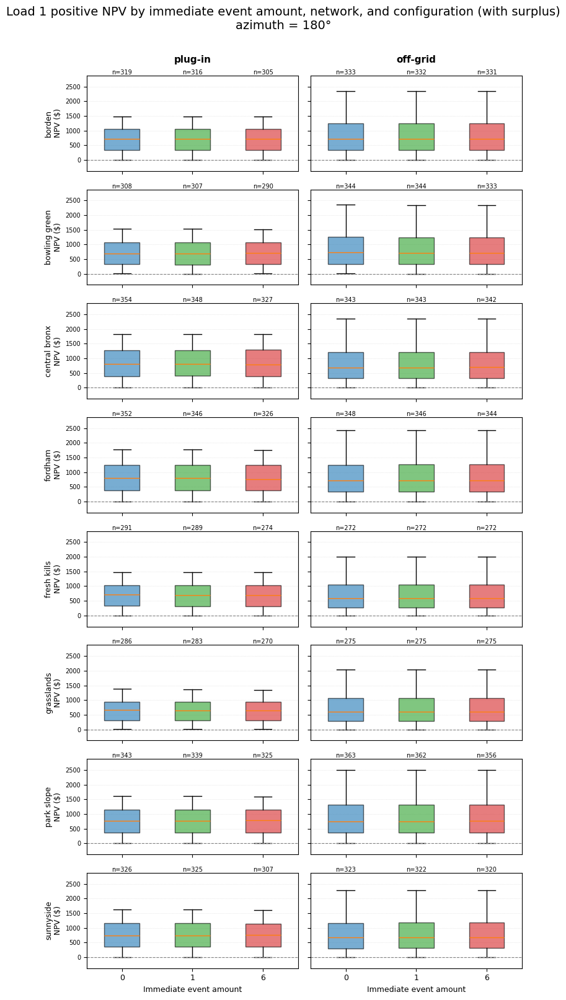

In [312]:

CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            data = []
            n_per_f = []
            for f in IMMEDIATE_EVENT_AMTS:
                f_npv = npv[subset["immediateEventAmt"] == f]  # .dropna()
                f_npv_positive = f_npv[f_npv >= 0]
                data.append(f_npv_positive)
                n_per_f.append(len(f_npv_positive))
            bp = ax.boxplot(data, positions=range(1, len(IMMEDIATE_EVENT_AMTS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, f in zip(bp["boxes"], IMMEDIATE_EVENT_AMTS):
                patch.set_facecolor(F_COLORS[f])
                patch.set_alpha(0.6)
            # annotate sample size directly above each box, at a consistent relative height
            ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the boxplots
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"azimuth = {AZ}\N{DEGREE SIGN}",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"results/{directory}{sd}npv_load1_positive_by_immediate_event_amount_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()

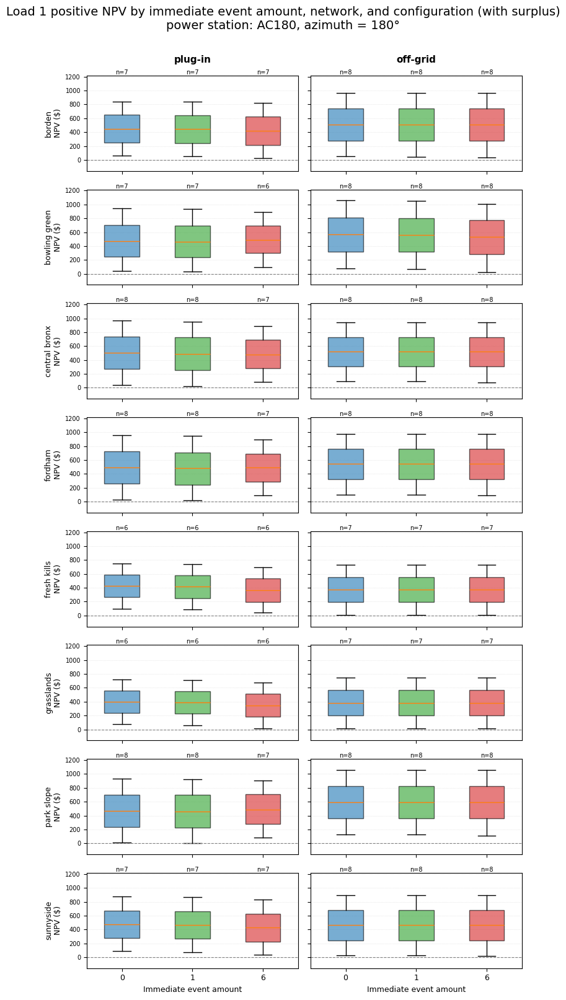

Saved: npv_load1_AC180_positive_by_immediate_event_amount_with_surplus_20260824_173740.png


In [302]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            data = []
            n_per_f = []
            for f in IMMEDIATE_EVENT_AMTS:
                f_npv = npv[subset["immediateEventAmt"] == f]  # .dropna()
                f_npv_positive = f_npv[f_npv >= 0]
                data.append(f_npv_positive)
                n_per_f.append(len(f_npv_positive))
            bp = ax.boxplot(data, positions=range(1, len(IMMEDIATE_EVENT_AMTS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, f in zip(bp["boxes"], IMMEDIATE_EVENT_AMTS):
                patch.set_facecolor(F_COLORS[f])
                patch.set_alpha(0.6)
            # annotate sample size directly above each box, at a consistent relative height
            ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the boxplots
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"results/{directory}{sd}npv_load1_{batModel}_positive_by_immediate_event_amount_{sk}_{timestamp}.png"
    # fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

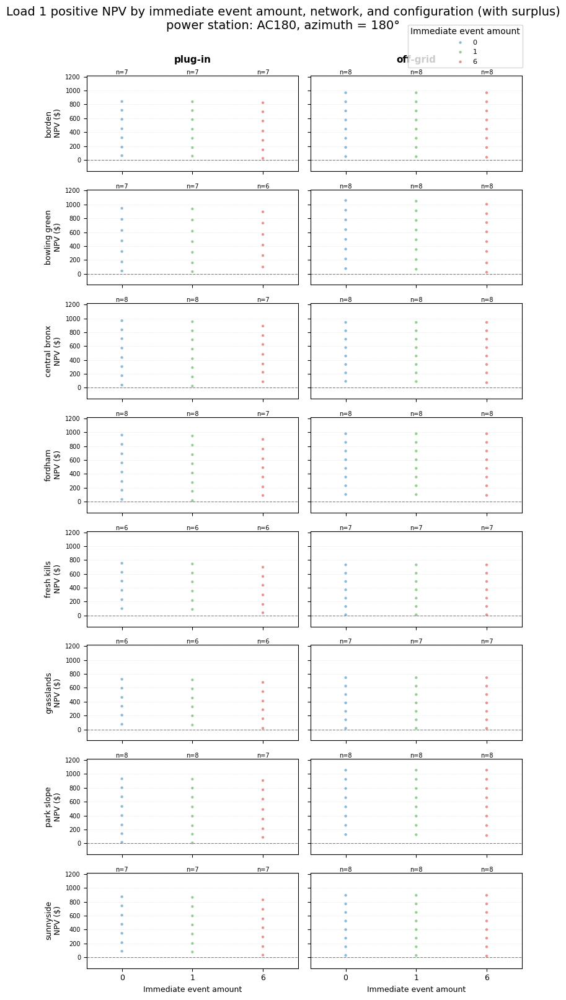

Saved: npv_load1_AC180_positive_scatter_by_immediate_event_amount_with_surplus_20260824_173803.png


In [303]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            n_per_f = []
            for i, f in enumerate(IMMEDIATE_EVENT_AMTS):
                f_npv = npv[subset["immediateEventAmt"] == f]  # .dropna()
                f_npv_positive = f_npv[f_npv >= 0]
                n_per_f.append(len(f_npv_positive))

                ax.scatter(np.full(len(f_npv_positive), i + 1), f_npv_positive,
                           color=F_COLORS[f], alpha=0.5, s=10, edgecolors="none",
                           label=str(f) if row == 0 and col == 0 else None)

            # annotate sample size directly above each column, at a consistent relative height
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.set_xlim(0.5, len(IMMEDIATE_EVENT_AMTS) + 0.5)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the scatter points
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)

    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}",
                 fontsize=14, y=1.005)
    fig.legend(title="Immediate event amount", loc="upper right", bbox_to_anchor=(0.99, 0.99), fontsize=8)
    fig.tight_layout()
    filename = f"results/{directory}{sd}npv_load1_{batModel}_positive_scatter_by_immediate_event_amount_{sk}_{timestamp}.png"
    # fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

In [297]:

batModel = "AC180"
load = "load1"
sk = "with_surplus"

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel)
].copy()

base_df["npv_val"] = extract_metric(base_df, load, "NPV", sk)

# 1) what immediateEventAmt values actually exist in this slice?
print("Unique immediateEventAmt values present:")
print(sorted(base_df["immediateEventAmt"].unique()))

# 2) raw row counts by immediateEventAmt (no NPV filter at all)
print("\nRaw row counts by immediateEventAmt:")
print(base_df["immediateEventAmt"].value_counts().sort_index())

# 3) NPV stats (mean, min, max, count of positive) by immediateEventAmt -- no network/config split yet
npv_stats = base_df.groupby("immediateEventAmt")["npv_val"].agg(
    mean="mean", min="min", max="max",
    n_total="count",
    n_positive=lambda s: (s >= 0).sum()
)
print("\nNPV stats by immediateEventAmt (all networks/configs pooled):")
display(npv_stats)

Unique immediateEventAmt values present:
[np.int64(0), np.int64(1), np.int64(6)]

Raw row counts by immediateEventAmt:
immediateEventAmt
0    176
1    176
6    176
Name: count, dtype: int64

NPV stats by immediateEventAmt (all networks/configs pooled):


,mean,min,max,n_total,n_positive
immediateEventAmt,,,,,
0,250.374311,-499.418135,1058.411934,176,119
1,242.477764,-508.815762,1055.366413,176,119
6,206.695423,-580.277150,1055.366413,176,115


In [351]:
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]
# load = "load1"
# dlrp_col = "dlrpLoad1_flex"
# batModel = "AC180"
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# base_df = combined_df[
#     (combined_df["az"] == AZ) &
#     (combined_df["batModel"] == batModel) &
#     (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
# ]

# # global pvW range across everything that'll be plotted, so marker sizes are
# # comparable across subplots rather than rescaled per-panel
# pvW_min = base_df["pvW"].min()
# pvW_max = base_df["pvW"].max()
# size_min, size_max = 8, 200  # marker area (points^2) range

# def scale_size(pvW_series):
#     if pvW_max == pvW_min:
#         return np.full(len(pvW_series), (size_min + size_max) / 2)
#     frac = (pvW_series - pvW_min) / (pvW_max - pvW_min)
#     return size_min + frac * (size_max - size_min)

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(8, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)
#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]
#             npv = extract_metric(subset, load, "NPV", sk)
#             dlrp_flex = subset[dlrp_col].apply(np.mean)
#             n_per_f = []
#             for i, f in enumerate(IMMEDIATE_EVENT_AMTS):
#                 f_mask = subset["immediateEventAmt"] == f
#                 f_npv = npv[f_mask]
#                 positive_mask = f_npv >= 0  # filter to rows with positive NPV
#                 f_dlrp = dlrp_flex[f_mask][positive_mask].dropna()
#                 f_pvW = subset["pvW"][f_mask][positive_mask].loc[f_dlrp.index]
#                 n_per_f.append(len(f_dlrp))

#                 ax.scatter(np.full(len(f_dlrp), i + 1), f_dlrp,
#                            s=scale_size(f_pvW),
#                            color=F_COLORS[f], alpha=0.5, edgecolors="none",
#                            label=str(f) if row == 0 and col == 0 else None)

#             # annotate sample size directly above each column, at a consistent relative height
#             for i, n in enumerate(n_per_f):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")
#             ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
#             ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
#             ax.set_xlim(0.5, len(IMMEDIATE_EVENT_AMTS) + 0.5)
#             ax.margins(y=0.15)  # leave room at top for the n= annotations
#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
#             ax.set_axisbelow(True)  # keep gridlines behind the scatter points
#             ax.tick_params(axis="y", labelsize=7)
#             if col == 0:
#                 ax.set_ylabel(f"{net}\nDLRP flex (kW)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Immediate event amount", fontsize=9)

#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 DLRP flex by immediate event amount, network, and configuration ({surplus_label})\n"
#                  f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}, filtered to positive NPV, dot size = pvW",
#                  fontsize=14, y=1.005)

#     # color legend (event frequency)
#     color_legend = fig.legend(title="Immediate event amount", loc="upper right",
#                                bbox_to_anchor=(0.99, 0.99), fontsize=8)
#     fig.add_artist(color_legend)

#     # size legend (pvW) -- a few representative example sizes
#     example_pvW = np.linspace(pvW_min, pvW_max, 4)
#     size_handles = [
#         plt.scatter([], [], s=scale_size(pd.Series([pw]))[0], color="gray", alpha=0.5,
#                     edgecolors="none", label=f"{int(pw)} W")
#         for pw in example_pvW
#     ]
#     fig.legend(handles=size_handles, title="pvW", loc="upper right",
#                bbox_to_anchor=(0.99, 0.90), fontsize=8)

#     fig.tight_layout()
#     filename = f"results/{directory}{sd}dlrp_flex_load1_{batModel}_positive_npv_scatter_by_immediate_event_amount_{sk}_{timestamp}.png"
#     fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()
#     print(f"Saved: {filename}")

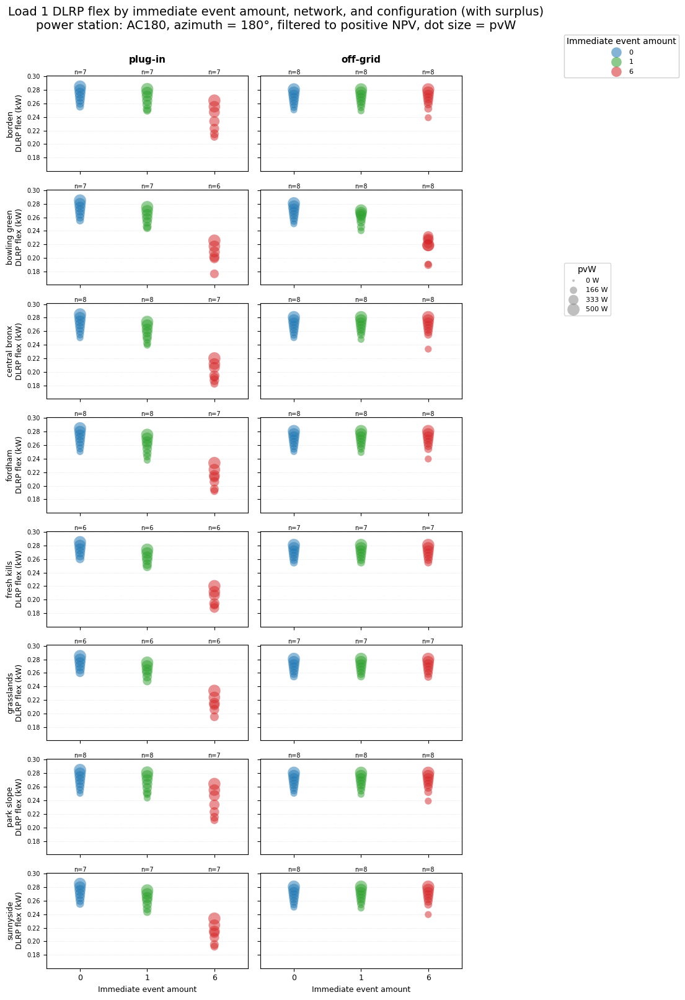

Saved: results/final_aug17/frequency/dlrp_flex_load1_AC180_positive_npv_scatter_by_immediate_event_amount_with_surplus_20260824_204855.png


In [350]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

# global pvW range across everything that'll be plotted, so marker sizes are
# comparable across subplots rather than rescaled per-panel
pvW_min = base_df["pvW"].min()
pvW_max = base_df["pvW"].max()
size_min, size_max = 8, 200  # marker area (points^2) range

def scale_size(pvW_series):
    if pvW_max == pvW_min:
        return np.full(len(pvW_series), (size_min + size_max) / 2)
    frac = (pvW_series - pvW_min) / (pvW_max - pvW_min)
    return size_min + frac * (size_max - size_min)

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(9, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            dlrp_flex = subset[dlrp_col].apply(np.mean)
            n_per_f = []
            for i, f in enumerate(IMMEDIATE_EVENT_AMTS):
                f_mask = subset["immediateEventAmt"] == f
                f_npv = npv[f_mask]
                positive_mask = f_npv >= 0  # filter to rows with positive NPV
                f_dlrp = dlrp_flex[f_mask][positive_mask].dropna()
                f_pvW = subset["pvW"][f_mask][positive_mask].loc[f_dlrp.index]
                n_per_f.append(len(f_dlrp))

                ax.scatter(np.full(len(f_dlrp), i + 1), f_dlrp,
                           s=scale_size(f_pvW),
                           color=F_COLORS[f], alpha=0.5, edgecolors="none",
                           label=str(f) if row == 0 and col == 0 else None)

            # annotate sample size directly above each column, at a consistent relative height
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.set_xlim(0.5, len(IMMEDIATE_EVENT_AMTS) + 0.5)
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the scatter points
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nDLRP flex (kW)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)

    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 DLRP flex by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}, filtered to positive NPV, dot size = pvW",
                 fontsize=14, y=1.005)

    # color legend (event frequency) -- placed fully outside the axes, to the right
    color_legend = fig.legend(title="Immediate event amount", loc="upper left",
                               bbox_to_anchor=(1.01, 0.98), fontsize=8)
    fig.add_artist(color_legend)

    # size legend (pvW) -- a few representative example sizes, stacked below the color legend
    example_pvW = np.linspace(pvW_min, pvW_max, 4)
    size_handles = [
        plt.scatter([], [], s=scale_size(pd.Series([pw]))[0], color="gray", alpha=0.5,
                    edgecolors="none", label=f"{int(pw)} W")
        for pw in example_pvW
    ]
    fig.legend(handles=size_handles, title="pvW", loc="upper left",
               bbox_to_anchor=(1.01, 0.75), fontsize=8)

    fig.tight_layout(rect=[0, 0, 0.85, 1])  # reserve right-hand margin for the legends
    filename = f"results/{directory}{sd}dlrp_flex_load1_{batModel}_positive_npv_scatter_by_immediate_event_amount_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

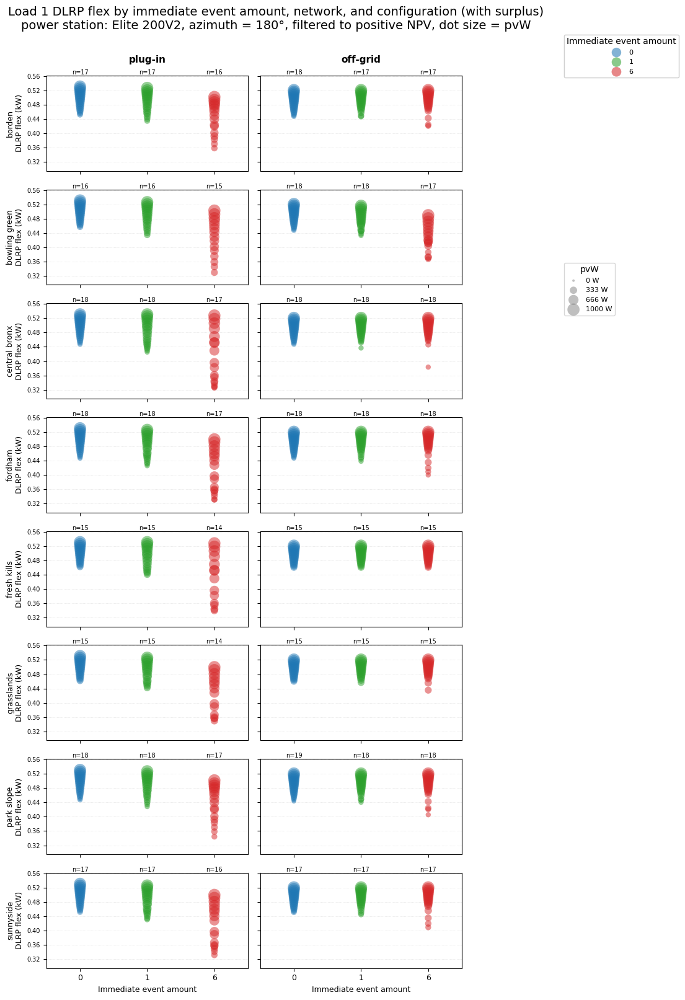

Saved: results/final_aug17/frequency/dlrp_flex_load1_Elite 200V2_positive_npv_scatter_by_immediate_event_amount_with_surplus_20260824_205341.png


In [353]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
batModel = "Elite 200V2"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

# global pvW range across everything that'll be plotted, so marker sizes are
# comparable across subplots rather than rescaled per-panel
pvW_min = base_df["pvW"].min()
pvW_max = base_df["pvW"].max()
size_min, size_max = 8, 200  # marker area (points^2) range

def scale_size(pvW_series):
    if pvW_max == pvW_min:
        return np.full(len(pvW_series), (size_min + size_max) / 2)
    frac = (pvW_series - pvW_min) / (pvW_max - pvW_min)
    return size_min + frac * (size_max - size_min)

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(9, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            dlrp_flex = subset[dlrp_col].apply(np.mean)
            n_per_f = []
            for i, f in enumerate(IMMEDIATE_EVENT_AMTS):
                f_mask = subset["immediateEventAmt"] == f
                f_npv = npv[f_mask]
                positive_mask = f_npv >= 0  # filter to rows with positive NPV
                f_dlrp = dlrp_flex[f_mask][positive_mask].dropna()
                f_pvW = subset["pvW"][f_mask][positive_mask].loc[f_dlrp.index]
                n_per_f.append(len(f_dlrp))

                ax.scatter(np.full(len(f_dlrp), i + 1), f_dlrp,
                           s=scale_size(f_pvW),
                           color=F_COLORS[f], alpha=0.5, edgecolors="none",
                           label=str(f) if row == 0 and col == 0 else None)

            # annotate sample size directly above each column, at a consistent relative height
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.set_xlim(0.5, len(IMMEDIATE_EVENT_AMTS) + 0.5)
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the scatter points
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nDLRP flex (kW)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)

    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 DLRP flex by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}, filtered to positive NPV, dot size = pvW",
                 fontsize=14, y=1.005)

    # color legend (event frequency) -- placed fully outside the axes, to the right
    color_legend = fig.legend(title="Immediate event amount", loc="upper left",
                               bbox_to_anchor=(1.01, 0.98), fontsize=8)
    fig.add_artist(color_legend)

    # size legend (pvW) -- a few representative example sizes, stacked below the color legend
    example_pvW = np.linspace(pvW_min, pvW_max, 4)
    size_handles = [
        plt.scatter([], [], s=scale_size(pd.Series([pw]))[0], color="gray", alpha=0.5,
                    edgecolors="none", label=f"{int(pw)} W")
        for pw in example_pvW
    ]
    fig.legend(handles=size_handles, title="pvW", loc="upper left",
               bbox_to_anchor=(1.01, 0.75), fontsize=8)

    fig.tight_layout(rect=[0, 0, 0.85, 1])  # reserve right-hand margin for the legends
    filename = f"results/{directory}{sd}dlrp_flex_load1_{batModel}_positive_npv_scatter_by_immediate_event_amount_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

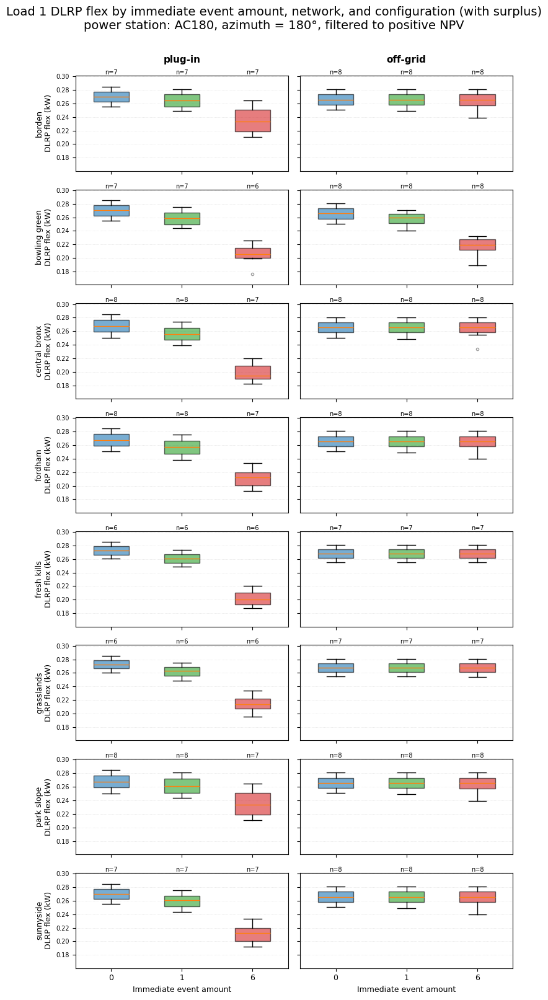

Saved: dlrp_flex_load1_AC180_positive_npv_by_immediate_event_amount_with_surplus_20260824_173957.png


In [306]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
batModel = "AC180"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["batModel"] == batModel) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            dlrp_flex = subset[dlrp_col].apply(np.mean)
            data = []
            n_per_f = []
            for f in IMMEDIATE_EVENT_AMTS:
                f_mask = subset["immediateEventAmt"] == f
                f_npv = npv[f_mask]
                positive_mask = f_npv >= 0  # filter to rows with positive NPV
                f_dlrp = dlrp_flex[f_mask][positive_mask].dropna()
                data.append(f_dlrp)
                n_per_f.append(len(f_dlrp))
            bp = ax.boxplot(data, positions=range(1, len(IMMEDIATE_EVENT_AMTS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, f in zip(bp["boxes"], IMMEDIATE_EVENT_AMTS):
                patch.set_facecolor(F_COLORS[f])
                patch.set_alpha(0.6)
            for i, n in enumerate(n_per_f):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(IMMEDIATE_EVENT_AMTS) + 1))
            ax.set_xticklabels([str(f) for f in IMMEDIATE_EVENT_AMTS], fontsize=9)
            ax.margins(y=0.15)
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nDLRP flex (kW)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Immediate event amount", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 DLRP flex by immediate event amount, network, and configuration ({surplus_label})\n"
                 f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}, filtered to positive NPV",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"dlrp_flex_load1_{batModel}_positive_npv_by_immediate_event_amount_{sk}_{timestamp}.png"
    fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {filename}")

In [344]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASELINE_F = min(IMMEDIATE_EVENT_AMTS)
MATCH_KEYS = ["batModel", "pvW", "network", "az"]

EVENT_LIKELIHOOD = {11: 4.8, 14: 12.5, 16: 60.5, 19: 62.5}  # % likelihood of at least 1 immediate event, by CSRP start hour

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
].copy()
rows = []
for net in NETWORKS:
    for mi, config_label in CONFIGS:
        subset = base_df[
            (base_df["network"] == net) &
            (base_df["microinverter"] == mi)
        ].copy()
        subset["dlrp"] = subset[dlrp_col].apply(np.mean)
        pivoted = subset.pivot_table(
            index=MATCH_KEYS,
            columns="immediateEventAmt",
            values=["dlrp", "dlrp_rate", "workingLife", "eventStart"],
            aggfunc="first"
        )
        if BASELINE_F not in pivoted["dlrp"].columns:
            continue
        baseline = pivoted["dlrp"][BASELINE_F]
        for f in IMMEDIATE_EVENT_AMTS:
            if f == BASELINE_F or f not in pivoted["dlrp"].columns:
                continue
            f_values = pivoted["dlrp"][f]
            pct_change = (f_values - baseline) / baseline * 100
            pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
            flex_change = (f_values - baseline).loc[pct_change.index]
            dlrp_rate_vals = pivoted["dlrp_rate"][f].loc[pct_change.index]
            working_life_vals = pivoted["workingLife"][f].loc[pct_change.index]
            event_start_vals = pivoted["eventStart"][f].loc[pct_change.index]
            median_dlrp_rate = dlrp_rate_vals.median()
            median_working_life = working_life_vals.median()
            median_flex_change = flex_change.median()
            median_event_start = event_start_vals.median()
            event_start_hour = int(round(median_event_start))
            likelihood_pct = EVENT_LIKELIHOOD.get(event_start_hour)
            monetary_value = median_flex_change * median_dlrp_rate * 5 * median_working_life
            rows.append({
                "network": net,
                "configuration": config_label,
                "compared frequency": f,
                #"min kW flex change": flex_change.min(),
                "median annual change (kW)": round(median_flex_change,3),
                #"mean kW flex change": flex_change.mean(),
                #"max kW flex change": flex_change.max(),
                #"min pct change": pct_change.min(),
                "median annual change (%)": round(pct_change.median(),2),
                #"mean pct change": pct_change.mean(),
                #"max pct change": pct_change.max(),
                "DLRP rate": f'${median_dlrp_rate}',
                #"median working life": median_working_life,
                "median lifetime monetary impact": f"${round(monetary_value,2)}",
                "likelihood of at least 1 event (%)": likelihood_pct,
            })
dlrp_pct_change_summary = pd.DataFrame(rows)
filename = f"results/{directory}{sd}dlrp load1 pct change by frequency network summary {timestamp}.csv"
dlrp_pct_change_summary.to_csv(filename, index=False)
print(f"Saved: {filename}")
dlrp_pct_change_summary

Saved: results/final_aug17/frequency/dlrp load1 pct change by frequency network summary 20260824_195927.csv


,network,configuration,compared frequency,median annual change (kW),median annual change (%),DLRP rate,median lifetime monetary impact,likelihood of at least 1 event (%)
0,borden,plug-in,1,-0.006,-2.38,$18.0,$-5.32,12.5
1,borden,plug-in,6,-0.038,-14.43,$18.0,$-32.75,12.5
2,borden,off-grid,1,0.000,0.00,$18.0,$0.0,12.5
3,borden,off-grid,6,0.000,0.00,$18.0,$0.0,12.5
4,bowling green,plug-in,1,-0.010,-4.39,$18.0,$-8.99,4.8
5,bowling green,plug-in,6,-0.062,-26.57,$18.0,$-53.76,4.8
6,bowling green,off-grid,1,-0.010,-3.17,$18.0,$-8.34,4.8
7,bowling green,off-grid,6,-0.059,-19.23,$18.0,$-50.89,4.8
8,central bronx,plug-in,1,-0.010,-4.43,$25.0,$-12.39,62.5
9,central bronx,plug-in,6,-0.063,-26.63,$25.0,$-75.51,62.5


In [349]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASELINE_F = min(IMMEDIATE_EVENT_AMTS)
MATCH_KEYS = ["batModel", "pvW", "network", "az"]
EVENT_LIKELIHOOD = {11: 4.8, 14: 12.5, 16: 60.5, 19: 62.5}  # % likelihood of at least 1 immediate event, by CSRP start hour
base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
].copy()
rows = []
for net in NETWORKS:
    for mi, config_label in CONFIGS:
        subset = base_df[
            (base_df["network"] == net) &
            (base_df["microinverter"] == mi)
        ].copy()
        subset["dlrp"] = subset[dlrp_col].apply(np.mean)
        pivoted = subset.pivot_table(
            index=MATCH_KEYS,
            columns="immediateEventAmt",
            values=["dlrp", "dlrp_rate", "workingLife", "eventStart"],
            aggfunc="first"
        )
        if BASELINE_F not in pivoted["dlrp"].columns:
            continue
        baseline = pivoted["dlrp"][BASELINE_F]

        # compute monetary value for every non-baseline frequency first, so we can
        # attach the 6-event figure onto the 1-event row below
        monetary_value_by_f = {}
        for f in IMMEDIATE_EVENT_AMTS:
            if f == BASELINE_F or f not in pivoted["dlrp"].columns:
                continue
            f_values = pivoted["dlrp"][f]
            pct_change = (f_values - baseline) / baseline * 100
            pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
            flex_change = (f_values - baseline).loc[pct_change.index]
            dlrp_rate_vals = pivoted["dlrp_rate"][f].loc[pct_change.index]
            working_life_vals = pivoted["workingLife"][f].loc[pct_change.index]
            median_dlrp_rate = dlrp_rate_vals.median()
            median_working_life = working_life_vals.median()
            median_flex_change = flex_change.median()
            median_pct_change = pct_change.median()
            monetary_value = median_flex_change * median_dlrp_rate * 5 * median_working_life
            monetary_value_by_f[f] = {
                "monetary_value": monetary_value,
                "median_flex_change": median_flex_change,
                "median_pct_change": median_pct_change,
                "median_dlrp_rate": median_dlrp_rate,
                "event_start_vals": pivoted["eventStart"][f].loc[pct_change.index],
            }

        # only build an output row for the 1-event frequency, pulling in the
        # 6-event monetary value as an extra column
        target_f = 1
        other_f = 6
        if target_f not in monetary_value_by_f:
            continue
        d1 = monetary_value_by_f[target_f]
        median_event_start = d1["event_start_vals"].median()
        event_start_hour = int(round(median_event_start))
        likelihood_pct = EVENT_LIKELIHOOD.get(event_start_hour)

        monetary_value_6_events = (
            monetary_value_by_f[other_f]["monetary_value"] if other_f in monetary_value_by_f else None
        )

        rows.append({
            "network": net,
            "configuration": config_label,
            "median annual change (kW)": round(d1["median_flex_change"],3),
            "median annual change (%)": round(d1["median_pct_change"],2),
            "DLRP rate": f'${d1["median_dlrp_rate"]}',
            "median lifetime monetary impact (1 year)": f"${round(d1['monetary_value'],2)}",
            "median lifetime monetary impact (6 years)": (
                f"${round(monetary_value_6_events,2)}" if monetary_value_6_events is not None else None
            ),
            "likelihood of at least 1 immediate event (%)": likelihood_pct,
        })
dlrp_pct_change_summary = pd.DataFrame(rows)
filename = f"results/{directory}{sd}dlrp load1 per event impact by frequency network summary {timestamp}.csv"
dlrp_pct_change_summary.to_csv(filename, index=False)
print(f"Saved: {filename}")
dlrp_pct_change_summary

Saved: results/final_aug17/frequency/dlrp load1 per event impact by frequency network summary 20260824_201410.csv


,network,configuration,median annual change (kW),median annual change (%),DLRP rate,median lifetime monetary impact (1 year),median lifetime monetary impact (6 years),likelihood of at least 1 immediate event (%)
0,borden,plug-in,-0.006,-2.38,$18.0,$-5.32,$-32.75,12.5
1,borden,off-grid,0.000,0.00,$18.0,$0.0,$0.0,12.5
2,bowling green,plug-in,-0.010,-4.39,$18.0,$-8.99,$-53.76,4.8
3,bowling green,off-grid,-0.010,-3.17,$18.0,$-8.34,$-50.89,4.8
4,central bronx,plug-in,-0.010,-4.43,$25.0,$-12.39,$-75.51,62.5
5,central bronx,off-grid,0.000,0.00,$25.0,$0.0,$0.0,62.5
6,fordham,plug-in,-0.010,-4.05,$25.0,$-11.46,$-69.32,60.5
7,fordham,off-grid,0.000,0.00,$25.0,$0.0,$0.0,60.5
8,fresh kills,plug-in,-0.010,-4.43,$18.0,$-8.92,$-54.36,62.5
9,fresh kills,off-grid,0.000,0.00,$18.0,$0.0,$0.0,62.5


In [355]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASELINE_F = min(IMMEDIATE_EVENT_AMTS)
MATCH_KEYS = ["batModel", "pvW", "network", "az"]
PV_W = 200
EVENT_LIKELIHOOD = {11: 4.8, 14: 12.5, 16: 60.5, 19: 62.5}  # % likelihood of at least 1 immediate event, by CSRP start hour
base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["pvW"] == PV_W) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
].copy()
rows = []
for net in NETWORKS:
    for mi, config_label in CONFIGS:
        subset = base_df[
            (base_df["network"] == net) &
            (base_df["microinverter"] == mi)
        ].copy()
        subset["dlrp"] = subset[dlrp_col].apply(np.mean)
        pivoted = subset.pivot_table(
            index=MATCH_KEYS,
            columns="immediateEventAmt",
            values=["dlrp", "dlrp_rate", "workingLife", "eventStart"],
            aggfunc="first"
        )
        if BASELINE_F not in pivoted["dlrp"].columns:
            continue
        baseline = pivoted["dlrp"][BASELINE_F]
        # compute monetary value for every non-baseline frequency first, so we can
        # attach the 6-event figure onto the 1-event row below
        monetary_value_by_f = {}
        for f in IMMEDIATE_EVENT_AMTS:
            if f == BASELINE_F or f not in pivoted["dlrp"].columns:
                continue
            f_values = pivoted["dlrp"][f]
            pct_change = (f_values - baseline) / baseline * 100
            pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
            flex_change = (f_values - baseline).loc[pct_change.index]
            dlrp_rate_vals = pivoted["dlrp_rate"][f].loc[pct_change.index]
            working_life_vals = pivoted["workingLife"][f].loc[pct_change.index]
            median_dlrp_rate = dlrp_rate_vals.median()
            median_working_life = working_life_vals.median()
            median_flex_change = flex_change.median()
            median_pct_change = pct_change.median()
            monetary_value = median_flex_change * median_dlrp_rate * 5 * median_working_life
            monetary_value_by_f[f] = {
                "monetary_value": monetary_value,
                "median_flex_change": median_flex_change,
                "median_pct_change": median_pct_change,
                "median_dlrp_rate": median_dlrp_rate,
                "event_start_vals": pivoted["eventStart"][f].loc[pct_change.index],
            }
        # only build an output row for the 1-event frequency, pulling in the
        # 6-event monetary value as an extra column
        target_f = 1
        other_f = 6
        if target_f not in monetary_value_by_f:
            continue
        d1 = monetary_value_by_f[target_f]
        median_event_start = d1["event_start_vals"].median()
        event_start_hour = int(round(median_event_start))
        likelihood_pct = EVENT_LIKELIHOOD.get(event_start_hour)
        monetary_value_6_events = (
            monetary_value_by_f[other_f]["monetary_value"] if other_f in monetary_value_by_f else None
        )
        rows.append({
            "network": net,
            "configuration": config_label,
            "median annual change (kW)": round(d1["median_flex_change"],3),
            "median annual change (%)": round(d1["median_pct_change"],2),
            "DLRP rate": f'${d1["median_dlrp_rate"]}',
            "median lifetime monetary impact (1 year)": f"${round(d1['monetary_value'],2)}",
            "median lifetime monetary impact (6 years)": (
                f"${round(monetary_value_6_events,2)}" if monetary_value_6_events is not None else None
            ),
            "likelihood of at least 1 immediate event (%)": likelihood_pct,
        })
dlrp_pct_change_summary = pd.DataFrame(rows)
filename = f"results/{directory}{sd}dlrp load1 per event impact by frequency network summary pvW{PV_W} {timestamp}.csv"
dlrp_pct_change_summary.to_csv(filename, index=False)
print(f"Saved: {filename}")
dlrp_pct_change_summary

Saved: results/final_aug17/frequency/dlrp load1 per event impact by frequency network summary pvW200 20260824_210550.csv


,network,configuration,median annual change (kW),median annual change (%),DLRP rate,median lifetime monetary impact (1 year),median lifetime monetary impact (6 years),likelihood of at least 1 immediate event (%)
0,borden,plug-in,-0.008,-3.41,$18.0,$-6.5,$-41.55,12.5
1,borden,off-grid,-0.000,-0.10,$18.0,$-0.18,$-2.19,12.5
2,bowling green,plug-in,-0.012,-4.94,$18.0,$-10.73,$-63.37,4.8
3,bowling green,off-grid,-0.011,-4.38,$18.0,$-9.21,$-55.82,4.8
4,central bronx,plug-in,-0.012,-4.76,$25.0,$-14.55,$-85.88,62.5
5,central bronx,off-grid,0.000,0.00,$25.0,$0.0,$0.0,62.5
6,fordham,plug-in,-0.011,-4.34,$25.0,$-13.23,$-75.62,60.5
7,fordham,off-grid,-0.000,-0.01,$25.0,$-0.03,$-0.86,60.5
8,fresh kills,plug-in,-0.012,-4.76,$18.0,$-10.48,$-61.83,62.5
9,fresh kills,off-grid,0.000,0.00,$18.0,$0.0,$0.0,62.5


In [357]:
CONFIGS = [(True, "plug-in"), (False, "off-grid")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASELINE_F = min(IMMEDIATE_EVENT_AMTS)
MATCH_KEYS = ["batModel", "pvW", "network", "az"]
PV_W = 'NA'#400
EVENT_LIKELIHOOD = {11: 4.8, 14: 12.5, 16: 60.5, 19: 62.5}  # % likelihood of at least 1 immediate event, by CSRP start hour
base_df = combined_df[
    (combined_df["az"] == AZ) &
    #(combined_df["pvW"] == PV_W) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
].copy()
rows = []
for net in NETWORKS:
    for mi, config_label in CONFIGS:
        subset = base_df[
            (base_df["network"] == net) &
            (base_df["microinverter"] == mi)
        ].copy()
        subset["dlrp"] = subset[dlrp_col].apply(np.mean)
        pivoted = subset.pivot_table(
            index=MATCH_KEYS,
            columns="immediateEventAmt",
            values=["dlrp", "dlrp_rate", "workingLife", "eventStart"],
            aggfunc="first"
        )
        if BASELINE_F not in pivoted["dlrp"].columns:
            continue
        baseline = pivoted["dlrp"][BASELINE_F]
        # compute stats for every non-baseline frequency first, so we can
        # attach the 6-event figure onto the 1-event row below
        stats_by_f = {}
        for f in IMMEDIATE_EVENT_AMTS:
            if f == BASELINE_F or f not in pivoted["dlrp"].columns:
                continue
            f_values = pivoted["dlrp"][f]
            pct_change = (f_values - baseline) / baseline * 100
            pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
            flex_change = (f_values - baseline).loc[pct_change.index]
            dlrp_rate_vals = pivoted["dlrp_rate"][f].loc[pct_change.index]
            working_life_vals = pivoted["workingLife"][f].loc[pct_change.index]
            median_dlrp_rate = dlrp_rate_vals.median()
            median_working_life = working_life_vals.median()
            median_flex_change = flex_change.median()
            monetary_value = median_flex_change * median_dlrp_rate * 5 * median_working_life
            stats_by_f[f] = {
                "monetary_value": monetary_value,
                "median_flex_change": median_flex_change,
                "min_pct_change": pct_change.min(),
                "mean_pct_change": pct_change.mean(),
                "median_pct_change": pct_change.median(),
                "max_pct_change": pct_change.max(),
                "median_dlrp_rate": median_dlrp_rate,
                "event_start_vals": pivoted["eventStart"][f].loc[pct_change.index],
            }
        # only build an output row for the 1-event frequency, pulling in the
        # 6-event monetary value as an extra column
        target_f = 1
        other_f = 6
        if target_f not in stats_by_f:
            continue
        d1 = stats_by_f[target_f]
        median_event_start = d1["event_start_vals"].median()
        event_start_hour = int(round(median_event_start))
        likelihood_pct = EVENT_LIKELIHOOD.get(event_start_hour)
        monetary_value_6_events = (
            stats_by_f[other_f]["monetary_value"] if other_f in stats_by_f else None
        )
        rows.append({
            "network": net,
            "configuration": config_label,
            "min annual change (%)": round(d1["min_pct_change"],2),
            "mean annual change (%)": round(d1["mean_pct_change"],2),
            "median annual change (%)": round(d1["median_pct_change"],2),
            "max annual change (%)": round(d1["max_pct_change"],2),
            "DLRP rate": f'${d1["median_dlrp_rate"]}',
            "median lifetime monetary impact (1 year)": f"${round(d1['monetary_value'],2)}",
            "median lifetime monetary impact (6 years)": (
                f"${round(monetary_value_6_events,2)}" if monetary_value_6_events is not None else None
            ),
            "likelihood of at least 1 immediate event (%)": likelihood_pct,
        })
dlrp_pct_change_summary = pd.DataFrame(rows)
filename = f"results/{directory}{sd}dlrp load1 pct change stats network summary pvW{PV_W} {timestamp}.csv"
dlrp_pct_change_summary.to_csv(filename, index=False)
print(f"Saved: {filename}")
dlrp_pct_change_summary

Saved: results/final_aug17/frequency/dlrp load1 pct change stats network summary pvWNA 20260824_210756.csv


,network,configuration,min annual change (%),mean annual change (%),median annual change (%),max annual change (%),DLRP rate,median lifetime monetary impact (1 year),median lifetime monetary impact (6 years),likelihood of at least 1 immediate event (%)
0,borden,plug-in,-12.83,-2.66,-2.38,0.0,$18.0,$-5.32,$-32.75,12.5
1,borden,off-grid,-13.29,-1.39,0.00,0.0,$18.0,$0.0,$0.0,12.5
2,bowling green,plug-in,-12.83,-3.94,-4.39,0.0,$18.0,$-8.99,$-53.76,4.8
3,bowling green,off-grid,-13.29,-3.80,-3.17,0.0,$18.0,$-8.34,$-50.89,4.8
4,central bronx,plug-in,-12.83,-3.80,-4.43,0.0,$25.0,$-12.39,$-75.51,62.5
5,central bronx,off-grid,-13.29,-1.38,0.00,0.0,$25.0,$0.0,$0.0,62.5
6,fordham,plug-in,-12.83,-3.76,-4.05,0.0,$25.0,$-11.46,$-69.32,60.5
7,fordham,off-grid,-13.29,-1.40,0.00,0.0,$25.0,$0.0,$0.0,60.5
8,fresh kills,plug-in,-12.83,-3.80,-4.43,0.0,$18.0,$-8.92,$-54.36,62.5
9,fresh kills,off-grid,-13.29,-1.38,0.00,0.0,$18.0,$0.0,$0.0,62.5


In [368]:
CONFIGS = [(True, "plug-in")]
load = "load1"
dlrp_col = "dlrpLoad1_flex"
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASELINE_F = min(IMMEDIATE_EVENT_AMTS)
MATCH_KEYS = ["batModel", "pvW", "network", "az"]
EVENT_LIKELIHOOD = {11: 4.8, 14: 12.5, 16: 60.5, 19: 62.5}  # % likelihood of at least 1 immediate event, by CSRP start hour

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"].isin(IMMEDIATE_EVENT_AMTS))
].copy()

rows = []
for net in NETWORKS:
    for mi, config_label in CONFIGS:
        subset = base_df[
            (base_df["network"] == net) &
            (base_df["microinverter"] == mi)
        ].copy()
        subset["dlrp"] = subset[dlrp_col].apply(np.mean)
        pivoted = subset.pivot_table(
            index=MATCH_KEYS,
            columns="immediateEventAmt",
            values=["dlrp", "dlrp_rate", "workingLife", "eventStart"],
            aggfunc="first"
        )
        if BASELINE_F not in pivoted["dlrp"].columns:
            continue
        baseline = pivoted["dlrp"][BASELINE_F]

        # compute row-level pct change / stats for every non-baseline frequency
        stats_by_f = {}
        for f in IMMEDIATE_EVENT_AMTS:
            if f == BASELINE_F or f not in pivoted["dlrp"].columns:
                continue
            f_values = pivoted["dlrp"][f]
            pct_change = (f_values - baseline) / baseline * 100
            pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
            flex_change = (f_values - baseline).loc[pct_change.index]
            dlrp_rate_vals = pivoted["dlrp_rate"][f].loc[pct_change.index]
            working_life_vals = pivoted["workingLife"][f].loc[pct_change.index]
            event_start_vals = pivoted["eventStart"][f].loc[pct_change.index]
            monetary_value_per_row = flex_change * dlrp_rate_vals * 5 * working_life_vals
            stats_by_f[f] = {
                "pct_change": pct_change,
                "flex_change": flex_change,
                "monetary_value": monetary_value_per_row,
                "event_start_vals": event_start_vals,
            }

        target_f = 1
        other_f = 6
        if target_f not in stats_by_f:
            continue

        # group by pvW (a level of the MATCH_KEYS index) so % change is broken out by PV size
        pvW_values = stats_by_f[target_f]["pct_change"].index.get_level_values("pvW")
        for pv in list(range(200,1250,50)):#sorted(set(pvW_values)):
            pv_mask = pvW_values == pv
            pct_change_pv = stats_by_f[target_f]["pct_change"][pv_mask]
            monetary_1_pv = stats_by_f[target_f]["monetary_value"][pv_mask]
            event_start_pv = stats_by_f[target_f]["event_start_vals"][pv_mask]

            median_event_start = event_start_pv.median()
            event_start_hour = int(round(median_event_start))
            likelihood_pct = EVENT_LIKELIHOOD.get(event_start_hour)

            monetary_6_pv = None
            if other_f in stats_by_f:
                pvW_values_6 = stats_by_f[other_f]["pct_change"].index.get_level_values("pvW")
                pv_mask_6 = pvW_values_6 == pv
                monetary_6_vals = stats_by_f[other_f]["monetary_value"][pv_mask_6]
                if len(monetary_6_vals):
                    monetary_6_pv = monetary_6_vals.median()

            rows.append({
                "network": net,
                "configuration": config_label,
                "pvW": pv,
                "min annual change (%)": round(pct_change_pv.min(),2),
                "mean annual change (%)": round(pct_change_pv.mean(),2),
                "median annual change (%)": round(pct_change_pv.median(),2),
                "max annual change (%)": round(pct_change_pv.max(),2),
                "median lifetime monetary impact (1 year)": (
                    f"${round(monetary_1_pv.median(),2)}" if len(monetary_1_pv) else None
                ),
                "median lifetime monetary impact (6 years)": (
                    f"${round(monetary_6_pv,2)}" if monetary_6_pv is not None else None
                ),
                "likelihood of at least 1 immediate event (%)": likelihood_pct,
            })

dlrp_pct_change_by_pvW = pd.DataFrame(rows)
filename = f"results/{directory}{sd}dlrp load1 pct change by pvW network summary {timestamp}.csv"
dlrp_pct_change_by_pvW.to_csv(filename, index=False)
print(f"Saved: {filename}")
dlrp_pct_change_by_pvW

Saved: results/final_aug17/frequency/dlrp load1 pct change by pvW network summary 20260824_212403.csv


,network,configuration,pvW,min annual change (%),mean annual change (%),median annual change (%),max annual change (%),median lifetime monetary impact (1 year),median lifetime monetary impact (6 years),likelihood of at least 1 immediate event (%)
0,borden,plug-in,200,-4.64,-3.01,-3.41,-0.61,$-5.85,$-38.44,12.5
1,borden,plug-in,250,-3.99,-3.10,-3.15,-1.12,$-9.28,$-51.64,12.5
2,borden,plug-in,300,-3.74,-2.64,-2.63,-0.70,$-7.41,$-45.11,12.5
3,borden,plug-in,350,-3.21,-2.35,-2.58,-0.33,$-8.44,$-41.98,12.5
4,borden,plug-in,400,-3.12,-2.00,-1.99,-0.07,$-5.61,$-35.52,12.5
...,...,...,...,...,...,...,...,...,...,...
163,sunnyside,plug-in,1000,-1.49,-1.00,-0.97,0.00,$-3.85,$-25.59,60.5
164,sunnyside,plug-in,1050,-1.44,-0.94,-0.94,0.00,$-3.81,$-24.3,60.5
165,sunnyside,plug-in,1100,-1.48,-0.94,-0.94,0.00,$-3.88,$-23.88,60.5
166,sunnyside,plug-in,1150,-1.51,-0.95,-0.92,0.00,$-3.99,$-24.15,60.5


[150, 250, 350, 450, 550, 650, 750, 850, 950, 1050, 1150]

# Baseline Sensitivity

In [377]:
combined_df = pd.concat([results_df, s_results_df], ignore_index=True)


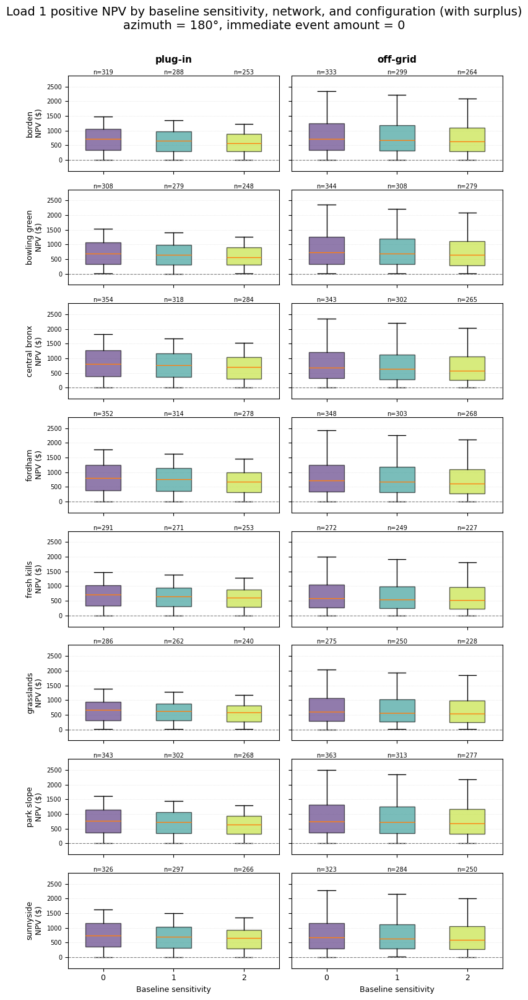

In [378]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
load = "load1"

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
]

BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
_cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(BASELINE_VALS)))
BASELINE_COLORS = {val: _cmap[i] for i, val in enumerate(BASELINE_VALS)}

NETWORKS = sorted(combined_df["network"].unique())
CONFIGS = [(True, "plug-in"), (False, "off-grid")]

for sk in SURPLUS_KEYS:
    fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
                             figsize=(8, 2 * len(NETWORKS)),
                             sharex=True, sharey=True)
    for row, net in enumerate(NETWORKS):
        for col, (mi, config_label) in enumerate(CONFIGS):
            ax = axs[row, col]
            subset = base_df[
                (base_df["network"] == net) &
                (base_df["microinverter"] == mi)
            ]
            npv = extract_metric(subset, load, "NPV", sk)
            data = []
            n_per_b = []
            for b in BASELINE_VALS:
                b_npv = npv[subset["baselineSensitivity"] == b]  # .dropna()
                b_npv_positive = b_npv[b_npv >= 0]
                data.append(b_npv_positive)
                n_per_b.append(len(b_npv_positive))
            bp = ax.boxplot(data, positions=range(1, len(BASELINE_VALS) + 1),
                             widths=0.5, showfliers=True, patch_artist=True,
                             flierprops=dict(marker="o", markersize=3, alpha=0.4))
            for patch, b in zip(bp["boxes"], BASELINE_VALS):
                patch.set_facecolor(BASELINE_COLORS[b])
                patch.set_alpha(0.6)
            # annotate sample size directly above each box, at a consistent relative height
            ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
            for i, n in enumerate(n_per_b):
                ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                            ha="center", va="bottom", fontsize=7, color="black")
            ax.set_xticks(range(1, len(BASELINE_VALS) + 1))
            ax.set_xticklabels([str(b) for b in BASELINE_VALS], fontsize=9)
            ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
            ax.margins(y=0.15)  # leave room at top for the n= annotations
            ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
            ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
            ax.set_axisbelow(True)  # keep gridlines behind the boxplots
            ax.tick_params(axis="y", labelsize=7)
            if col == 0:
                ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
            if row == 0:
                ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
            if row == len(NETWORKS) - 1:
                ax.set_xlabel("Baseline sensitivity", fontsize=9)
    surplus_label = sk.replace("_", " ")
    fig.suptitle(f"Load 1 positive NPV by baseline sensitivity, network, and configuration ({surplus_label})\n"
                 f"azimuth = {AZ}\N{DEGREE SIGN}, immediate event amount = {IMMEDIATE_EVENT_AMT}",
                 fontsize=14, y=1.005)
    fig.tight_layout()
    filename = f"npv load1 positive by baseline sensitivity {sk} {timestamp}.png"
    # fig.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()

In [379]:
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# AZ = 180
# IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
# SURPLUS_KEYS = ["with_surplus"]  # "without_surplus",
# load = "load1"
# batModel = "AC180"

# # build the baseline sensitivity -> color mapping from the FULL dataset, not the
# # filtered subset, so colors stay consistent across every plot regardless of filters
# ALL_BASELINE_VALS = sorted(combined_df["baselineSensitivity"].dropna().unique())
# _cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(ALL_BASELINE_VALS)))
# BASELINE_COLORS = {val: _cmap[i] for i, val in enumerate(ALL_BASELINE_VALS)}

# base_df = combined_df[
#     (combined_df["az"] == AZ) &
#     (combined_df["batModel"] == batModel) &
#     (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
# ]

# BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
# NETWORKS = sorted(combined_df["network"].unique())
# CONFIGS = [(True, "plug-in"), (False, "off-grid")]

# for sk in SURPLUS_KEYS:
#     fig, axs = plt.subplots(len(NETWORKS), len(CONFIGS),
#                              figsize=(8, 2 * len(NETWORKS)),
#                              sharex=True, sharey=True)
#     for row, net in enumerate(NETWORKS):
#         for col, (mi, config_label) in enumerate(CONFIGS):
#             ax = axs[row, col]
#             subset = base_df[
#                 (base_df["network"] == net) &
#                 (base_df["microinverter"] == mi)
#             ]
#             npv = extract_metric(subset, load, "NPV", sk)
#             data = []
#             n_per_b = []
#             for b in BASELINE_VALS:
#                 b_npv = npv[subset["baselineSensitivity"] == b]  # .dropna()
#                 b_npv_positive = b_npv[b_npv >= 0]
#                 data.append(b_npv_positive)
#                 n_per_b.append(len(b_npv_positive))
#             bp = ax.boxplot(data, positions=range(1, len(BASELINE_VALS) + 1),
#                              widths=0.5, showfliers=True, patch_artist=True,
#                              flierprops=dict(marker="o", markersize=3, alpha=0.4))
#             for patch, b in zip(bp["boxes"], BASELINE_VALS):
#                 patch.set_facecolor(BASELINE_COLORS[b])
#                 patch.set_alpha(0.6)
#             # annotate sample size directly above each box, at a consistent relative height
#             ymax = ax.get_ylim()[1] if any(len(d) for d in data) else 1
#             for i, n in enumerate(n_per_b):
#                 ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
#                             ha="center", va="bottom", fontsize=7, color="black")
#             ax.set_xticks(range(1, len(BASELINE_VALS) + 1))
#             ax.set_xticklabels([str(b) for b in BASELINE_VALS], fontsize=9)
#             ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
#             ax.margins(y=0.15)  # leave room at top for the n= annotations
#             ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
#             ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
#             ax.set_axisbelow(True)  # keep gridlines behind the boxplots
#             ax.tick_params(axis="y", labelsize=7)
#             if col == 0:
#                 ax.set_ylabel(f"{net}\nNPV ($)", fontsize=9)
#             if row == 0:
#                 ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
#             if row == len(NETWORKS) - 1:
#                 ax.set_xlabel("Baseline sensitivity", fontsize=9)

#     surplus_label = sk.replace("_", " ")
#     fig.suptitle(f"Load 1 positive NPV by baseline sensitivity, network, and configuration ({surplus_label})\n"
#                  f"power station: {batModel}, azimuth = {AZ}\N{DEGREE SIGN}, immediate event amount = {IMMEDIATE_EVENT_AMT}",
#                  fontsize=14, y=1.005)
#     fig.tight_layout()
#     filename = f"results/{directory}{sd}npv load1 positive by baseline sensitivity {sk} {timestamp}.png"
#     #fig.savefig(filename, dpi=150, bbox_inches="tight")
#     plt.show()
#     print(f"Saved: {filename}")

In [380]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEY = "with_surplus"
load = "load1"

# columns that identify a unique "system" (power station + solar array) independent of baselineSensitivity
SYSTEM_ID_COLS = ["batModel", "network", "microinverter", "pvW", "batWh", "az", "immediateEventAmt"]

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
].copy()

base_df["NPV"] = extract_metric(base_df, load, "NPV", SURPLUS_KEY)

BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
print(f"Baseline sensitivity levels found: {BASELINE_VALS}")

# pivot to one row per system, one column per baseline sensitivity level
pivot_df = base_df.pivot_table(
    index=SYSTEM_ID_COLS,
    columns="baselineSensitivity",
    values="NPV",
    aggfunc="first"
)
pivot_df.columns = [f"NPV_b{b}" for b in pivot_df.columns]
pivot_df = pivot_df.reset_index()

npv_cols = [f"NPV_b{b}" for b in BASELINE_VALS]

# keep only systems present at every baseline level, with positive NPV at every level
complete_mask = pivot_df[npv_cols].notna().all(axis=1)
positive_mask = (pivot_df[npv_cols] >= 0).all(axis=1)
qualifying_df = pivot_df[complete_mask & positive_mask].copy()

print(f"{len(qualifying_df)} of {len(pivot_df)} systems have positive NPV at all "
      f"{len(BASELINE_VALS)} baseline sensitivity levels")

# percentage drop in NPV between each consecutive pair of baseline levels, per system
drop_records = []
for prev_b, curr_b in zip(BASELINE_VALS[:-1], BASELINE_VALS[1:]):
    prev_col = f"NPV_b{prev_b}"
    curr_col = f"NPV_b{curr_b}"
    pct_drop = (qualifying_df[prev_col] - qualifying_df[curr_col]) / qualifying_df[prev_col] * 100
    for bat_model, val in zip(qualifying_df["batModel"], pct_drop):
        drop_records.append({
            "power station": bat_model,
            "baseline change": f"{prev_b} to {curr_b}",
            "pct drop": val,
        })

drop_df = pd.DataFrame(drop_records)

summary = drop_df.groupby(["power station", "baseline change"])["pct drop"].agg(
    median_pct_drop="median", mean_pct_drop="mean", n="count"
).reset_index()
summary.columns = [c.replace("_", " ") for c in summary.columns]

print(summary.to_string(index=False))

filename = f"results/{directory}{sd}npv percent drop by baseline sensitivity per power station {timestamp}.csv"
summary.to_csv(filename, index=False)
print(f"Saved: {filename}")

Baseline sensitivity levels found: [np.int64(0), np.int64(1), np.int64(2)]
4148 of 9040 systems have positive NPV at all 3 baseline sensitivity levels
             power station baseline change  median pct drop  mean pct drop   n
                     AC180          0 to 1        21.968220      24.508607  85
                     AC180          1 to 2        28.152914      34.769827  85
                    AC180T          0 to 1        28.084237      30.305765  51
                    AC180T          1 to 2        39.051573      45.947483  51
                    AC200L          0 to 1        11.504662      14.478551 284
                    AC200L          1 to 2        13.000304      18.557786 284
                    AC200P          0 to 1        20.367208      23.740091  98
                    AC200P          1 to 2        25.576773      33.392557  98
                     AC240          0 to 1        12.065585      15.143618 253
                     AC240          1 to 2        13.721118

In [398]:
# timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# AZ = 180
# IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
# SURPLUS_KEY = "with_surplus"

# # columns that identify a unique "system" (power station + solar array) independent of baselineSensitivity
# SYSTEM_ID_COLS = ["batModel", "network", "microinverter", "pvW", "batWh", "az", "immediateEventAmt"]

# base_df = combined_df[
#     (combined_df["az"] == AZ) &
#     (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
# ].copy()

# BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
# print(f"Baseline sensitivity levels found: {BASELINE_VALS}")

# all_summaries = []

# for load in LOADS:
#     load_df = base_df.copy()
#     load_df["NPV"] = extract_metric(load_df, load, "NPV", SURPLUS_KEY)

#     # pivot to one row per system, one column per baseline sensitivity level
#     pivot_df = load_df.pivot_table(
#         index=SYSTEM_ID_COLS,
#         columns="baselineSensitivity",
#         values="NPV",
#         aggfunc="first"
#     )
#     pivot_df.columns = [f"NPV_b{b}" for b in pivot_df.columns]
#     pivot_df = pivot_df.reset_index()

#     npv_cols = [f"NPV_b{b}" for b in BASELINE_VALS]

#     # keep only systems present at every baseline level, with positive NPV at every level
#     complete_mask = pivot_df[npv_cols].notna().all(axis=1)
#     positive_mask = (pivot_df[npv_cols] >= 0).all(axis=1)
#     qualifying_df = pivot_df[complete_mask & positive_mask].copy()

#     print(f"[{load}] {len(qualifying_df)} of {len(pivot_df)} systems have positive NPV at all "
#           f"{len(BASELINE_VALS)} baseline sensitivity levels")

#     # percentage drop in NPV between each consecutive pair of baseline levels, per system
#     drop_records = []
#     for prev_b, curr_b in zip(BASELINE_VALS[:-1], BASELINE_VALS[1:]):
#         prev_col = f"NPV_b{prev_b}"
#         curr_col = f"NPV_b{curr_b}"
#         pct_drop = (qualifying_df[prev_col] - qualifying_df[curr_col]) / qualifying_df[prev_col] * 100
#         for bat_model, val in zip(qualifying_df["batModel"], pct_drop):
#             drop_records.append({
#                 "load": load,
#                 "power station": bat_model,
#                 "baseline change": f"{prev_b} to {curr_b}",
#                 "pct drop": val,
#             })

#     drop_df = pd.DataFrame(drop_records)

#     summary = drop_df.groupby(["load", "power station", "baseline change"])["pct drop"].agg(
#         median_pct_drop="median", mean_pct_drop="mean", n="count"
#     ).reset_index()
#     summary.columns = [c.replace("_", " ") for c in summary.columns]

#     all_summaries.append(summary)

# full_summary = pd.concat(all_summaries, ignore_index=True)
# print(full_summary.to_string(index=False))

# filename = f"results/{directory}{sd}npv percent drop by baseline sensitivity per power station per load {timestamp}.csv"
# #full_summary.to_csv(filename, index=False)
# print(f"Saved: {filename}")

In [382]:

PV_ARRAY_W = 600  # <-- set the solar array size to filter to


timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEY = "with_surplus"

# columns that identify a unique "system" (power station + solar array) independent of baselineSensitivity
SYSTEM_ID_COLS = ["batModel", "network", "microinverter", "pvW", "batWh", "az", "immediateEventAmt"]

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT) &
    (combined_df["pvW"]== PV_ARRAY_W)
].copy()

BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
print(f"Baseline sensitivity levels found: {BASELINE_VALS}")

qualifying_dfs = {}  # load -> DataFrame with one row per qualifying system, NPV_b* columns, and pv

for load in LOADS:
    load_df = base_df.copy()
    load_df["NPV"] = extract_metric(load_df, load, "NPV", SURPLUS_KEY)

    pivot_df = load_df.pivot_table(
        index=SYSTEM_ID_COLS,
        columns="baselineSensitivity",
        values="NPV",
        aggfunc="first"
    )
    pivot_df.columns = [f"NPV_b{b}" for b in pivot_df.columns]
    pivot_df = pivot_df.reset_index()
    pivot_df = pivot_df.rename(columns={"pvW": "pv"})

    npv_cols = [f"NPV_b{b}" for b in BASELINE_VALS]

    complete_mask = pivot_df[npv_cols].notna().all(axis=1)
    positive_mask = (pivot_df[npv_cols] >= 0).all(axis=1)
    qualifying_df = pivot_df[complete_mask & positive_mask].copy()

    print(f"[{load}] {len(qualifying_df)} of {len(pivot_df)} systems have positive NPV at all "
          f"{len(BASELINE_VALS)} baseline sensitivity levels")

    qualifying_dfs[load] = qualifying_df

print(f"Baseline NPV columns available: {[f'NPV_b{b}' for b in BASELINE_VALS]}")

Baseline sensitivity levels found: [np.int64(0), np.int64(1), np.int64(2)]
[load1] 318 of 336 systems have positive NPV at all 3 baseline sensitivity levels
[load2] 209 of 336 systems have positive NPV at all 3 baseline sensitivity levels
[load1R] 325 of 336 systems have positive NPV at all 3 baseline sensitivity levels
Baseline NPV columns available: ['NPV_b0', 'NPV_b1', 'NPV_b2']


C:\Users\alexn\AppData\Local\Temp\ipykernel_17172\3615431310.py:119: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",


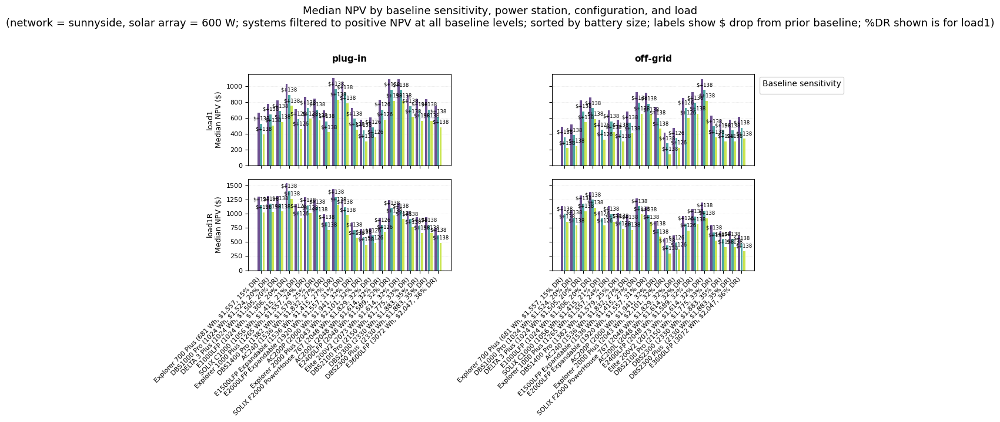

Saved: results/final_aug17/baseline/npv by baseline sensitivity per power station per config per load sunnyside pv600W 20260824_220854.png


In [383]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

NETWORK = "sunnyside"  # <-- set the network to filter to
CONFIGS = [(True, "plug-in"), (False, "off-grid")]

LOADS_ORDER = [l for l in LOADS if l != "load2"]  # drop load2
npv_cols = [f"NPV_b{b}" for b in BASELINE_VALS]

available_pv = sorted(qualifying_dfs[LOADS_ORDER[0]]["pv"].unique())
if PV_ARRAY_W not in available_pv:
    raise ValueError(f"pv={PV_ARRAY_W} not found; available values: {available_pv}")

available_networks = sorted(qualifying_dfs[LOADS_ORDER[0]]["network"].unique())
if NETWORK not in available_networks:
    raise ValueError(f"network={NETWORK!r} not found; available values: {available_networks}")

bat_wh_lookup = hardware_df.set_index("Model")["Battery Wh"].to_dict()

# capex is a modeled system cost (power station + this PV array), so pull it
# from combined_df at this pvW rather than from hardware_df's raw retail price
capex_lookup = (
    combined_df[combined_df["pvW"] == PV_ARRAY_W]
    .groupby("batModel")["capex"]
    .median()
    .to_dict()
)

# %DR value (share of system value coming from DR income vs. grid/PV avoidance) --
# always computed for load1 (regardless of which load's row is being plotted),
# at the baseline (first BASELINE_VALS entry)
PCTDR_LOAD = "load1"
pctdr_base_df = base_df[base_df["baselineSensitivity"] == BASELINE_VALS[0]].copy()
pctdr_base_df["pctDR"] = pct_dr_value(pctdr_base_df, PCTDR_LOAD, True)  # True = with_surplus

# power stations present (at this pv size + network) for at least one load/config, sorted by battery Wh
all_stations = set()
for load in LOADS_ORDER:
    filt = qualifying_dfs[load][
        (qualifying_dfs[load]["pv"] == PV_ARRAY_W) &
        (qualifying_dfs[load]["network"] == NETWORK)
    ]
    all_stations.update(filt["batModel"].unique())
POWER_STATIONS = sorted(all_stations, key=lambda ps: bat_wh_lookup.get(ps, float("inf")))

_cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(BASELINE_VALS)))
BASELINE_COLORS = {b: _cmap[i] for i, b in enumerate(BASELINE_VALS)}

n_baselines = len(BASELINE_VALS)
bar_width = 0.8 / n_baselines
x = np.arange(len(POWER_STATIONS))

fig, axs = plt.subplots(len(LOADS_ORDER), len(CONFIGS),
                         figsize=(6 * len(CONFIGS), 3.5 * len(LOADS_ORDER)),
                         sharex=True, sharey="row")
if len(LOADS_ORDER) == 1:
    axs = axs.reshape(1, -1)

for row, load in enumerate(LOADS_ORDER):
    for col, (mi, config_label) in enumerate(CONFIGS):
        ax = axs[row, col]
        filt = qualifying_dfs[load][
            (qualifying_dfs[load]["pv"] == PV_ARRAY_W) &
            (qualifying_dfs[load]["network"] == NETWORK) &
            (qualifying_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")

        # %DR value per power station -- always load1, for this network/config/pv
        pctdr_filt = pctdr_base_df[
            (pctdr_base_df["pvW"] == PV_ARRAY_W) &
            (pctdr_base_df["network"] == NETWORK) &
            (pctdr_base_df["microinverter"] == mi)
        ]
        pctdr_lookup = pctdr_filt.groupby("batModel")["pctDR"].median().to_dict()

        # medians per baseline level, per power station -- needed both for the bars
        # and for computing the drop between consecutive baseline levels
        medians_by_b = {}
        for b in BASELINE_VALS:
            npv_col = f"NPV_b{b}"
            medians_by_b[b] = [filt.loc[filt.index == ps, npv_col].median() if ps in filt.index else np.nan
                                for ps in POWER_STATIONS]

        for i, b in enumerate(BASELINE_VALS):
            medians = medians_by_b[b]
            bar_positions = x - 0.4 + bar_width * (i + 0.5)
            ax.bar(bar_positions, medians, width=bar_width * 0.9,
                   color=BASELINE_COLORS[b], alpha=0.8,
                   label=str(b) if row == 0 and col == 0 else None)

            # annotate the absolute NPV drop from the PREVIOUS baseline level, on this bar
            if i > 0:
                prev_medians = medians_by_b[BASELINE_VALS[i - 1]]
                for bp, med, prev_med in zip(bar_positions, medians, prev_medians):
                    if not np.isnan(med) and not np.isnan(prev_med):
                        npv_drop = prev_med - med
                        ax.annotate(f"${npv_drop:+,.0f}", xy=(bp, med), xytext=(0, 3),
                                    textcoords="offset points", ha="center", va="bottom",
                                    fontsize=6, color="black")

        ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
        ax.set_xticks(x)
        # label each power station on a single line: name, battery size (Wh), system capex ($), load1 %DR value
        xtick_labels = [
            f"{ps.replace('_', ' ')} "
            f"({bat_wh_lookup.get(ps, float('nan')):.0f} Wh, "
            f"${capex_lookup.get(ps, float('nan')):,.0f}, "
            f"{pctdr_lookup.get(ps, float('nan')):.0f}% DR)"
            for ps in POWER_STATIONS
        ]
        ax.set_xticklabels(xtick_labels, rotation=45, ha="right", fontsize=8)
        if col == 0:
            ax.set_ylabel(f"{load.replace('_', ' ')}\nMedian NPV ($)", fontsize=9)
        if row == 0:
            ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
        ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
        ax.set_axisbelow(True)
        ax.tick_params(axis="y", labelsize=8)

axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",
                   bbox_to_anchor=(1.01, 1.0), fontsize=8)

fig.suptitle(f"Median NPV by baseline sensitivity, power station, configuration, and load\n"
             f"(network = {NETWORK}, solar array = {PV_ARRAY_W} W; systems filtered to positive NPV "
             f"at all baseline levels; sorted by battery size; labels show $ drop from prior baseline; "
             f"%DR shown is for load1)",
             fontsize=13, y=1.02)
fig.tight_layout()

filename = f"results/{directory}{sd}npv by baseline sensitivity per power station per config per load {NETWORK} pv{PV_ARRAY_W}W {timestamp}.png"
fig.savefig(filename, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

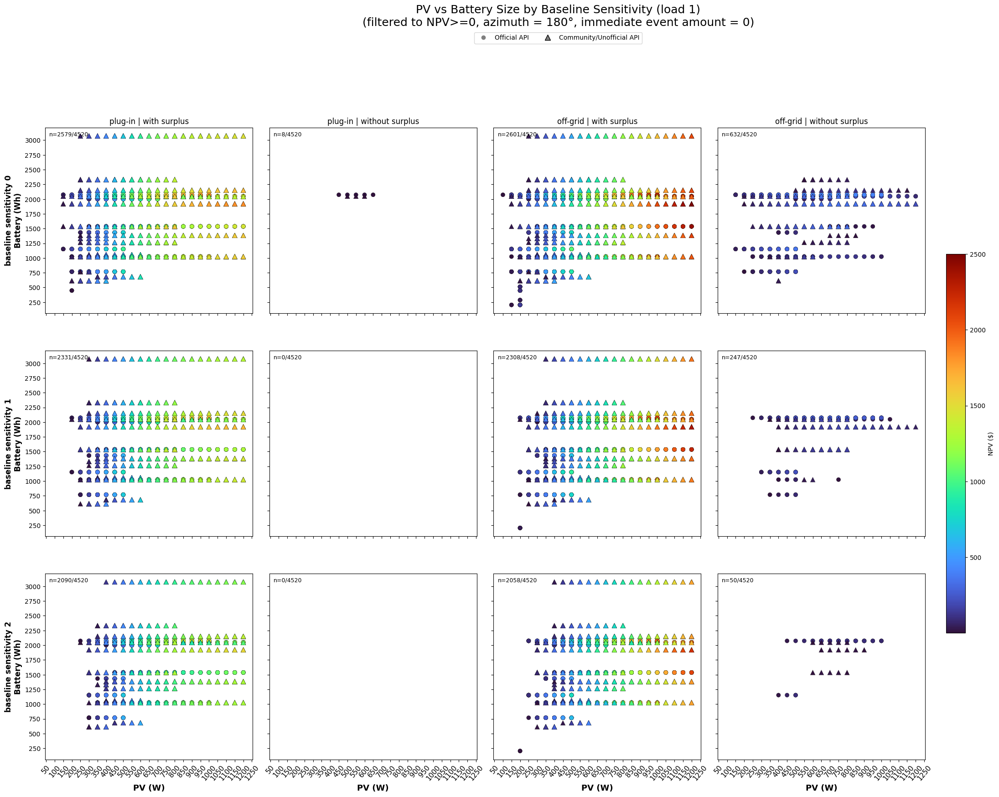

Saved: results/final_aug17/baseline/pv vs battery scatter by baseline sensitivity load1 20260824_235814.png


In [408]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEYS = ["with_surplus", "without_surplus"]
LOAD = "load1"

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
]
BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())

# PV size vs battery Wh scatter, load1 only, rows = baseline sensitivity,
# columns = mi x surplus scenarios. Filtered to 0 <= NPV, azimuth/immediate
# event amount fixed as above, color-coded by NPV (shared scale across all
# panels). Devices without an official API (community API only) shown as triangles.
scenarios = [(mi, sk) for mi in [True, False] for sk in SURPLUS_KEYS]

# models that only have a community (unofficial) API
unofficial_models = set(hardware_df.loc[hardware_df['official API'] == False, 'Model'])

# first pass: gather all favorable data per (baseline, scenario) cell, and find the global NPV range
cell_data = {}
global_min, global_max = np.inf, -np.inf
for b in BASELINE_VALS:
    b_df = base_df[base_df["baselineSensitivity"] == b]
    for (mi, sk) in scenarios:
        subset = b_df[b_df["microinverter"] == mi]
        npv = extract_metric(subset, LOAD, "NPV", sk)
        favorable = subset[npv >= 0]
        npv_favorable = npv.loc[favorable.index]
        cell_data[(b, mi, sk)] = (favorable, npv_favorable, len(subset), len(favorable))
        if len(npv_favorable):
            global_min = min(global_min, npv_favorable.min())
            global_max = max(global_max, npv_favorable.max())

# second pass: plot everything on the same color scale
fig, axs = plt.subplots(len(BASELINE_VALS), len(scenarios), figsize=(15 * len(scenarios) / 2, 6 * len(BASELINE_VALS)),
                         sharex=True, sharey=True)
axs = axs.reshape(len(BASELINE_VALS), -1)
cmap = "turbo"  # more contrast across the range than viridis

for row, b in enumerate(BASELINE_VALS):
    for col, (mi, sk) in enumerate(scenarios):
        ax = axs[row, col]
        favorable, npv_favorable, n_before, n_after = cell_data[(b, mi, sk)]

        is_unofficial = favorable["batModel"].isin(unofficial_models)

        # official-API devices: circles, drawn first (sorted ascending within group)
        off_idx = favorable.index[~is_unofficial]
        off_order = npv_favorable.loc[off_idx].sort_values().index
        sc = ax.scatter(favorable.loc[off_order, "pvW"], favorable.loc[off_order, "batWh"],
                   c=npv_favorable.loc[off_order], cmap=cmap, vmin=global_min, vmax=global_max,
                   marker="o", alpha=1.0, s=45, edgecolors="black", linewidths=0.2)

        # unofficial/community-API devices: triangles, drawn on top (sorted ascending within group)
        un_idx = favorable.index[is_unofficial]
        un_order = npv_favorable.loc[un_idx].sort_values().index
        ax.scatter(favorable.loc[un_order, "pvW"], favorable.loc[un_order, "batWh"],
                   c=npv_favorable.loc[un_order], cmap=cmap, vmin=global_min, vmax=global_max,
                   marker="^", alpha=1.0, s=60, edgecolors="black", linewidths=0.2)

        config = "plug-in" if mi else "off-grid"
        sk_label = sk.replace("_", " ")
        if row == 0:
            ax.set_title(f"{config} | {sk_label}", fontsize=12)
        ax.text(0.02, 0.98, f"n={n_after}/{n_before}", transform=ax.transAxes,
                fontsize=9, va="top", ha="left")
        if col == 0:
            ax.set_ylabel(f"baseline sensitivity {b}\nBattery (Wh)", fontsize=12, fontweight="bold")
        if row == len(BASELINE_VALS) - 1:
            ax.set_xlabel("PV (W)", fontsize=13, fontweight="bold")
        ax.tick_params(labelsize=11, axis="x", rotation=50)
        ax.xaxis.set_major_locator(mticker.MultipleLocator(50))
        ax.yaxis.set_major_locator(mticker.MultipleLocator(250))

fig.subplots_adjust(wspace=0.08)
# single shared colorbar for the whole figure, using the shared vmin/vmax
fig.colorbar(sc, ax=axs, shrink=0.6, pad=0.02, label="NPV ($)")

# marker legend (circle = official API, triangle = community/unofficial API)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Official API'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=9, label='Community/Unofficial API'),
]
fig.legend(handles=legend_elements, loc="upper center", ncol=2, bbox_to_anchor=(0.5, 1.0), fontsize=10)

load_label = LOAD.replace("_", " ").replace("load", "load ")
fig.suptitle(f"PV vs Battery Size by Baseline Sensitivity ({load_label})\n"
             f"(filtered to NPV>=0, azimuth = {AZ}\N{DEGREE SIGN}, immediate event amount = {IMMEDIATE_EVENT_AMT})",
             fontsize=18, y=1.03)

filename = f"results/{directory}{sd}pv vs battery scatter by baseline sensitivity {LOAD} {timestamp}.png"
fig.savefig(filename, dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

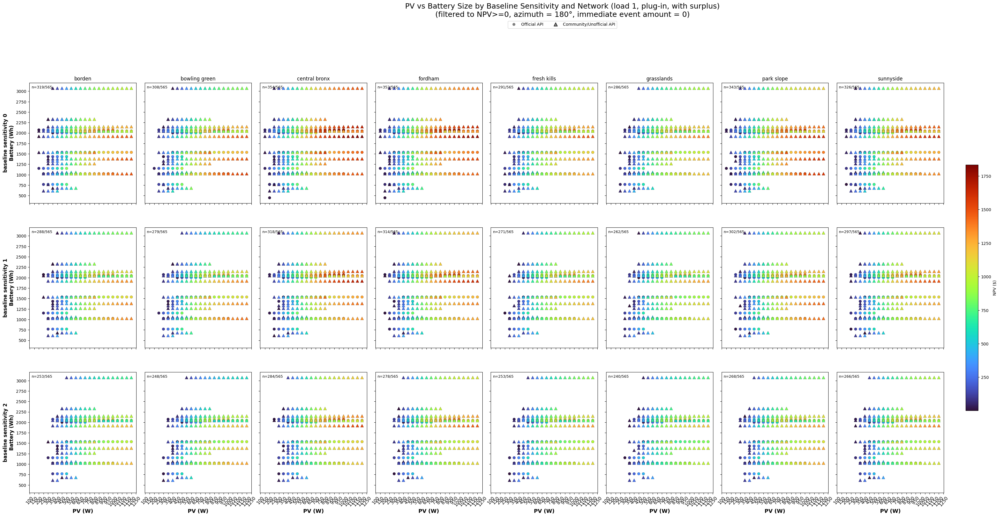

Saved: results/final_aug17/baseline/pv vs battery scatter by baseline sensitivity per network load1 plugin 20260825_001424.png


In [411]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEY = "with_surplus"
MICROINVERTER = True  # plug-in only
LOAD = "load1"

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT) &
    (combined_df["microinverter"] == MICROINVERTER)
]
BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
NETWORKS = sorted(base_df["network"].unique())

# PV size vs battery Wh scatter, load1 only, plug-in + with_surplus only,
# rows = baseline sensitivity, columns = network. Filtered to 0 <= NPV,
# azimuth/immediate event amount fixed as above, color-coded by NPV (shared
# scale across all panels). Devices without an official API (community API
# only) shown as triangles.

# models that only have a community (unofficial) API
unofficial_models = set(hardware_df.loc[hardware_df['official API'] == False, 'Model'])

# first pass: gather all favorable data per (baseline, network) cell, and find the global NPV range
cell_data = {}
global_min, global_max = np.inf, -np.inf
for b in BASELINE_VALS:
    b_df = base_df[base_df["baselineSensitivity"] == b]
    for net in NETWORKS:
        subset = b_df[b_df["network"] == net]
        npv = extract_metric(subset, LOAD, "NPV", SURPLUS_KEY)
        favorable = subset[npv >= 0]
        npv_favorable = npv.loc[favorable.index]
        cell_data[(b, net)] = (favorable, npv_favorable, len(subset), len(favorable))
        if len(npv_favorable):
            global_min = min(global_min, npv_favorable.min())
            global_max = max(global_max, npv_favorable.max())

# second pass: plot everything on the same color scale
fig, axs = plt.subplots(len(BASELINE_VALS), len(NETWORKS), figsize=(6 * len(NETWORKS), 6 * len(BASELINE_VALS)),
                         sharex=True, sharey=True)
axs = axs.reshape(len(BASELINE_VALS), -1)
cmap = "turbo"  # more contrast across the range than viridis

for row, b in enumerate(BASELINE_VALS):
    for col, net in enumerate(NETWORKS):
        ax = axs[row, col]
        favorable, npv_favorable, n_before, n_after = cell_data[(b, net)]

        is_unofficial = favorable["batModel"].isin(unofficial_models)

        # official-API devices: circles, drawn first (sorted ascending within group)
        off_idx = favorable.index[~is_unofficial]
        off_order = npv_favorable.loc[off_idx].sort_values().index
        sc = ax.scatter(favorable.loc[off_order, "pvW"], favorable.loc[off_order, "batWh"],
                   c=npv_favorable.loc[off_order], cmap=cmap, vmin=global_min, vmax=global_max,
                   marker="o", alpha=1.0, s=45, edgecolors="black", linewidths=0.2)

        # unofficial/community-API devices: triangles, drawn on top (sorted ascending within group)
        un_idx = favorable.index[is_unofficial]
        un_order = npv_favorable.loc[un_idx].sort_values().index
        ax.scatter(favorable.loc[un_order, "pvW"], favorable.loc[un_order, "batWh"],
                   c=npv_favorable.loc[un_order], cmap=cmap, vmin=global_min, vmax=global_max,
                   marker="^", alpha=1.0, s=60, edgecolors="black", linewidths=0.2)

        if row == 0:
            ax.set_title(f"{net}", fontsize=12)
        ax.text(0.02, 0.98, f"n={n_after}/{n_before}", transform=ax.transAxes,
                fontsize=9, va="top", ha="left")
        if col == 0:
            ax.set_ylabel(f"baseline sensitivity {b}\nBattery (Wh)", fontsize=12, fontweight="bold")
        if row == len(BASELINE_VALS) - 1:
            ax.set_xlabel("PV (W)", fontsize=13, fontweight="bold")
        ax.tick_params(labelsize=11, axis="x", rotation=50)
        ax.xaxis.set_major_locator(mticker.MultipleLocator(50))
        ax.yaxis.set_major_locator(mticker.MultipleLocator(250))

fig.subplots_adjust(wspace=0.08)
# single shared colorbar for the whole figure, using the shared vmin/vmax
fig.colorbar(sc, ax=axs, shrink=0.6, pad=0.02, label="NPV ($)")

# marker legend (circle = official API, triangle = community/unofficial API)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Official API'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markeredgecolor='black', markersize=9, label='Community/Unofficial API'),
]
fig.legend(handles=legend_elements, loc="upper center", ncol=2, bbox_to_anchor=(0.5, 1.0), fontsize=10)

load_label = LOAD.replace("_", " ").replace("load", "load ")
sk_label = SURPLUS_KEY.replace("_", " ")
fig.suptitle(f"PV vs Battery Size by Baseline Sensitivity and Network ({load_label}, plug-in, {sk_label})\n"
             f"(filtered to NPV>=0, azimuth = {AZ}\N{DEGREE SIGN}, immediate event amount = {IMMEDIATE_EVENT_AMT})",
             fontsize=18, y=1.03)

filename = f"results/{directory}{sd}pv vs battery scatter by baseline sensitivity per network {LOAD} plugin {timestamp}.png"
fig.savefig(filename, dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

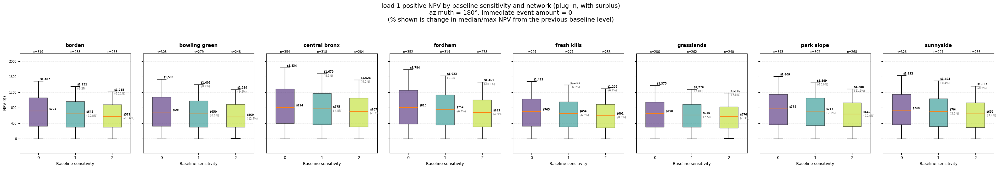

Saved: results/final_aug17/baseline/npv positive by baseline sensitivity per network load1 plugin 20260825_003030.png


In [416]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEY = "with_surplus"
MICROINVERTER = True  # plug-in only
LOAD = "load1"

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT) &
    (combined_df["microinverter"] == MICROINVERTER)
]
BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
NETWORKS = sorted(base_df["network"].unique())
_cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(BASELINE_VALS)))
BASELINE_COLORS = {val: _cmap[i] for i, val in enumerate(BASELINE_VALS)}

# NPV box plot, load1 only, plug-in + with_surplus only, one panel per network,
# x-axis = baseline sensitivity level, filtered to positive NPV only

fig, axs = plt.subplots(1, len(NETWORKS), figsize=(4 * len(NETWORKS), 5), sharex=True, sharey=True)
if len(NETWORKS) == 1:
    axs = [axs]

for col, net in enumerate(NETWORKS):
    ax = axs[col]
    subset = base_df[base_df["network"] == net]
    npv = extract_metric(subset, LOAD, "NPV", SURPLUS_KEY)

    data = []
    n_per_b = []
    medians_per_b = []
    for b in BASELINE_VALS:
        b_npv = npv[subset["baselineSensitivity"] == b]
        b_npv_positive = b_npv[b_npv >= 0]
        data.append(b_npv_positive)
        n_per_b.append(len(b_npv_positive))
        medians_per_b.append(b_npv_positive.median() if len(b_npv_positive) else np.nan)

    bp = ax.boxplot(data, positions=range(1, len(BASELINE_VALS) + 1),
                     widths=0.5, showfliers=True, patch_artist=True,
                     flierprops=dict(marker="o", markersize=3, alpha=0.4))
    for patch, b in zip(bp["boxes"], BASELINE_VALS):
        patch.set_facecolor(BASELINE_COLORS[b])
        patch.set_alpha(0.6)

    # annotate sample size directly above each box, at a consistent relative height
    for i, n in enumerate(n_per_b):
        ax.annotate(f"n={n}", xy=(i + 1, 1.0), xycoords=("data", "axes fraction"),
                    ha="center", va="bottom", fontsize=7, color="black")

    # annotate the median value (and % change from the previous baseline) next to each box
    for i, med_line in enumerate(bp["medians"]):
        med_val = med_line.get_ydata()[0]
        x_pos = med_line.get_xdata()[1]  # right end of the median line segment
        ax.annotate(f"${med_val:,.0f}", xy=(x_pos, med_val), xytext=(4, 4),
                    textcoords="offset points", ha="left", va="center",
                    fontsize=6, color="black", fontweight="bold")

        if i > 0 and not np.isnan(medians_per_b[i]) and not np.isnan(medians_per_b[i - 1]) and medians_per_b[i - 1] != 0:
            pct_change = (medians_per_b[i] - medians_per_b[i - 1]) / medians_per_b[i - 1] * 100
            ax.annotate(f"({pct_change:+.1f}%)", xy=(x_pos, med_val), xytext=(4, -5),
                        textcoords="offset points", ha="left", va="center",
                        fontsize=6, color="dimgray")

    # annotate the max value (top of upper whisker) and % change from the previous baseline
    max_per_b = []
    for i in range(len(BASELINE_VALS)):
        upper_whisker = bp["whiskers"][2 * i + 1]  # each box has 2 whiskers; the 2nd is the upper one
        max_val = upper_whisker.get_ydata()[1]  # far end of the upper whisker
        x_pos = upper_whisker.get_xdata()[1] if len(upper_whisker.get_xdata()) > 1 else upper_whisker.get_xdata()[0]
        max_per_b.append(max_val)

        ax.annotate(f"${max_val:,.0f}", xy=(x_pos, max_val), xytext=(4, 4),
                    textcoords="offset points", ha="left", va="center",
                    fontsize=6, color="black", fontweight="bold")

        if i > 0 and not np.isnan(max_per_b[i]) and not np.isnan(max_per_b[i - 1]) and max_per_b[i - 1] != 0:
            pct_change = (max_per_b[i] - max_per_b[i - 1]) / max_per_b[i - 1] * 100
            ax.annotate(f"({pct_change:+.1f}%)", xy=(x_pos, max_val), xytext=(4, -5),
                        textcoords="offset points", ha="left", va="center",
                        fontsize=6, color="dimgray")

    ax.set_xticks(range(1, len(BASELINE_VALS) + 1))
    ax.set_xticklabels([str(b) for b in BASELINE_VALS], fontsize=9)
    ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
    ax.margins(y=0.2)  # leave room at top for the n= and max annotations
    ax.yaxis.set_major_locator(MaxNLocator(nbins=8))
    ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
    ax.set_axisbelow(True)  # keep gridlines behind the boxplots
    ax.tick_params(axis="y", labelsize=7)
    ax.set_title(f"{net}", fontsize=11, fontweight="bold", pad=15)
    ax.set_xlabel("Baseline sensitivity", fontsize=9)
    if col == 0:
        ax.set_ylabel("NPV ($)", fontsize=9)

load_label = LOAD.replace("_", " ").replace("load", "load ")
sk_label = SURPLUS_KEY.replace("_", " ")
fig.suptitle(f"{load_label} positive NPV by baseline sensitivity and network (plug-in, {sk_label})\n"
             f"azimuth = {AZ}\N{DEGREE SIGN}, immediate event amount = {IMMEDIATE_EVENT_AMT}\n"
             f"(% shown is change in median/max NPV from the previous baseline level)",
             fontsize=14, y=1.07)
fig.tight_layout()

filename = f"results/{directory}{sd}npv positive by baseline sensitivity per network {LOAD} plugin {timestamp}.png"
fig.savefig(filename, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

In [410]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
AZ = 180
IMMEDIATE_EVENT_AMT = 0  # baseline sensitivity data is assumed to be run at a single immediate event amount
SURPLUS_KEYS = ["with_surplus", "without_surplus"]
LOAD = "load1"
# columns that identify a unique "system" (power station + solar array) independent of baselineSensitivity
SYSTEM_ID_COLS = ["batModel", "network", "microinverter", "pvW", "batWh", "az", "immediateEventAmt"]

base_df = combined_df[
    (combined_df["az"] == AZ) &
    (combined_df["immediateEventAmt"] == IMMEDIATE_EVENT_AMT)
].copy()
BASELINE_VALS = sorted(base_df["baselineSensitivity"].dropna().unique())
print(f"Baseline sensitivity levels found: {BASELINE_VALS}")

# build one qualifying-systems pivot per (mi, sk) scenario, then compute the
# $ change in NPV between each consecutive baseline pair, per network -- then
# average across all consecutive pairs into a single number per network/scenario
change_records = []
for mi in [True, False]:
    for sk in SURPLUS_KEYS:
        scen_df = base_df[base_df["microinverter"] == mi].copy()
        scen_df["NPV"] = extract_metric(scen_df, LOAD, "NPV", sk)
        pivot_df = scen_df.pivot_table(
            index=SYSTEM_ID_COLS,
            columns="baselineSensitivity",
            values="NPV",
            aggfunc="first"
        )
        pivot_df.columns = [f"NPV_b{b}" for b in pivot_df.columns]
        pivot_df = pivot_df.reset_index()
        npv_cols = [f"NPV_b{b}" for b in BASELINE_VALS]

        # keep only systems present at every baseline level, with positive NPV at every level
        complete_mask = pivot_df[npv_cols].notna().all(axis=1)
        positive_mask = (pivot_df[npv_cols] >= 0).all(axis=1)
        qualifying_df = pivot_df[complete_mask & positive_mask].copy()

        config_label = "plug-in" if mi else "off-grid"
        scenario_label = f"{config_label} | {sk.replace('_', ' ')}"

        for prev_b, curr_b in zip(BASELINE_VALS[:-1], BASELINE_VALS[1:]):
            prev_col = f"NPV_b{prev_b}"
            curr_col = f"NPV_b{curr_b}"
            change = qualifying_df[curr_col] - qualifying_df[prev_col]
            for net, val in zip(qualifying_df["network"], change):
                change_records.append({
                    "network": net,
                    "scenario": scenario_label,
                    "npv change": val,
                })

change_df = pd.DataFrame(change_records)
summary = change_df.groupby(["network", "scenario"])["npv change"].agg(
    median_npv_change="median", n="count"
).reset_index()
summary.columns = [c.replace("_", " ") for c in summary.columns]
print(summary.to_string(index=False))

filename = f"results/{directory}{sd}avg npv change by baseline sensitivity per network per scenario {LOAD} {timestamp}.csv"
summary.to_csv(filename, index=False)
print(f"Saved: {filename}")

Baseline sensitivity levels found: [np.int64(0), np.int64(1), np.int64(2)]
      network                   scenario  median npv change   n
       borden    off-grid | with surplus        -136.193474 528
       borden off-grid | without surplus        -136.193474   6
       borden     plug-in | with surplus        -136.193474 506
bowling green    off-grid | with surplus        -133.306359 558
bowling green off-grid | without surplus        -133.306359  30
bowling green     plug-in | with surplus        -133.306359 496
central bronx    off-grid | with surplus        -155.242637 530
central bronx     plug-in | with surplus        -155.242637 568
      fordham    off-grid | with surplus        -161.668797 536
      fordham off-grid | without surplus        -161.668797  16
      fordham     plug-in | with surplus        -161.668797 556
  fresh kills    off-grid | with surplus         -93.524615 454
  fresh kills     plug-in | with surplus         -93.524615 506
   grasslands    off-grid | w

### Baseline impact on DR 

In [384]:
# LOADS_ORDER = [l for l in LOADS if l != "load2"]  # drop load2

In [385]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# reuses base_df, BASELINE_VALS, SYSTEM_ID_COLS, and qualifying_dfs already built earlier
# (base_df already filtered to AZ = 180, IMMEDIATE_EVENT_AMT = 0)

csrp_dfs = {}  # load -> DataFrame with one row per qualifying system, CSRP_b* columns, and pv

for load in LOADS_ORDER:
    load_df = base_df.copy()
    csrp_col = LOAD_FLEX_MAP[load][0]  # e.g. "csrpLoad1_flex" for load1
    load_df["CSRP"] = load_df[csrp_col].apply(np.mean)

    pivot_df = load_df.pivot_table(
        index=SYSTEM_ID_COLS,
        columns="baselineSensitivity",
        values="CSRP",
        aggfunc="first"
    )
    pivot_df.columns = [f"CSRP_b{b}" for b in pivot_df.columns]
    pivot_df = pivot_df.reset_index()
    pivot_df = pivot_df.rename(columns={"pvW": "pv"})

    # keep only the same systems that qualified (positive NPV at all baseline levels) for this load
    key_cols = ["batModel", "network", "microinverter", "pv", "batWh", "az", "immediateEventAmt"]
    qualifying_keys = qualifying_dfs[load][key_cols].drop_duplicates()
    csrp_dfs[load] = pivot_df.merge(qualifying_keys, on=key_cols, how="inner")

    print(f"[{load}] {len(csrp_dfs[load])} qualifying systems carried over for CSRP")

[load1] 318 qualifying systems carried over for CSRP
[load1R] 325 qualifying systems carried over for CSRP


C:\Users\alexn\AppData\Local\Temp\ipykernel_17172\1325205837.py:101: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",


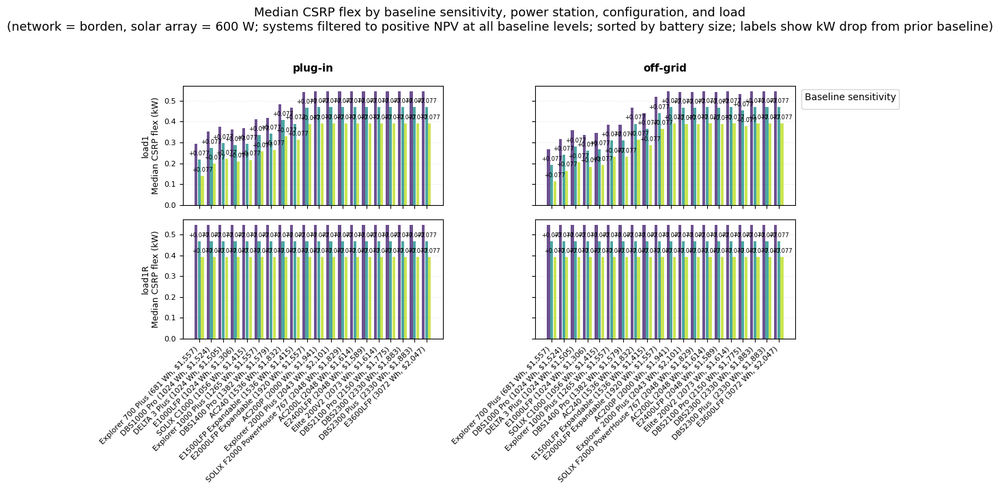

Saved: results/final_aug17/baseline/csrp flex by baseline sensitivity per power station per config per load borden pv600W 20260824_220903.png


In [386]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

NETWORK = "borden"  # <-- set the network to filter to
CONFIGS = [(True, "plug-in"), (False, "off-grid")]

csrp_cols = [f"CSRP_b{b}" for b in BASELINE_VALS]

available_pv = sorted(csrp_dfs[LOADS_ORDER[0]]["pv"].unique())
if PV_ARRAY_W not in available_pv:
    raise ValueError(f"pv={PV_ARRAY_W} not found; available values: {available_pv}")

available_networks = sorted(csrp_dfs[LOADS_ORDER[0]]["network"].unique())
if NETWORK not in available_networks:
    raise ValueError(f"network={NETWORK!r} not found; available values: {available_networks}")

bat_wh_lookup = hardware_df.set_index("Model")["Battery Wh"].to_dict()

# capex is a modeled system cost (power station + this PV array), so pull it
# from combined_df at this pvW rather than from hardware_df's raw retail price
capex_lookup = (
    combined_df[combined_df["pvW"] == PV_ARRAY_W]
    .groupby("batModel")["capex"]
    .median()
    .to_dict()
)

# power stations present (at this pv size + network) for at least one load/config, sorted by battery Wh
all_stations = set()
for load in LOADS_ORDER:
    filt = csrp_dfs[load][
        (csrp_dfs[load]["pv"] == PV_ARRAY_W) &
        (csrp_dfs[load]["network"] == NETWORK)
    ]
    all_stations.update(filt["batModel"].unique())
POWER_STATIONS = sorted(all_stations, key=lambda ps: bat_wh_lookup.get(ps, float("inf")))

_cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(BASELINE_VALS)))
BASELINE_COLORS = {b: _cmap[i] for i, b in enumerate(BASELINE_VALS)}

n_baselines = len(BASELINE_VALS)
bar_width = 0.8 / n_baselines
x = np.arange(len(POWER_STATIONS))

fig, axs = plt.subplots(2, len(CONFIGS),
                         figsize=(6 * len(CONFIGS), 3.5 * len(LOADS_ORDER)),
                         sharex=True, sharey="row")
if len(LOADS_ORDER) == 1:
    axs = axs.reshape(1, -1)

for row, load in enumerate(LOADS_ORDER):
    for col, (mi, config_label) in enumerate(CONFIGS):
        ax = axs[row, col]
        filt = csrp_dfs[load][
            (csrp_dfs[load]["pv"] == PV_ARRAY_W) &
            (csrp_dfs[load]["network"] == NETWORK) &
            (csrp_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")

        # medians per baseline level, per power station -- needed both for the bars
        # and for computing the drop between consecutive baseline levels
        medians_by_b = {}
        for b in BASELINE_VALS:
            col_name = f"CSRP_b{b}"
            medians_by_b[b] = [filt.loc[filt.index == ps, col_name].median() if ps in filt.index else np.nan
                                for ps in POWER_STATIONS]

        for i, b in enumerate(BASELINE_VALS):
            medians = medians_by_b[b]
            bar_positions = x - 0.4 + bar_width * (i + 0.5)
            ax.bar(bar_positions, medians, width=bar_width * 0.9,
                   color=BASELINE_COLORS[b], alpha=0.8,
                   label=str(b) if row == 0 and col == 0 else None)

            # annotate the absolute CSRP flex drop from the PREVIOUS baseline level, on this bar
            if i > 0:
                prev_medians = medians_by_b[BASELINE_VALS[i - 1]]
                for bp, med, prev_med in zip(bar_positions, medians, prev_medians):
                    if not np.isnan(med) and not np.isnan(prev_med):
                        csrp_drop = prev_med - med
                        ax.annotate(f"{csrp_drop:+.3f}", xy=(bp, med), xytext=(0, 3),
                                    textcoords="offset points", ha="center", va="bottom",
                                    fontsize=6, color="black")

        ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
        ax.set_xticks(x)
        # label each power station on a single line: name, battery size (Wh), system capex ($)
        xtick_labels = [
            f"{ps.replace('_', ' ')} "
            f"({bat_wh_lookup.get(ps, float('nan')):.0f} Wh, ${capex_lookup.get(ps, float('nan')):,.0f})"
            for ps in POWER_STATIONS
        ]
        ax.set_xticklabels(xtick_labels, rotation=45, ha="right", fontsize=8)
        if col == 0:
            ax.set_ylabel(f"{load.replace('_', ' ')}\nMedian CSRP flex (kW)", fontsize=9)
        if row == 0:
            ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
        ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
        ax.set_axisbelow(True)
        ax.tick_params(axis="y", labelsize=8)

axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",
                   bbox_to_anchor=(1.01, 1.0), fontsize=8)

fig.suptitle(f"Median CSRP flex by baseline sensitivity, power station, configuration, and load\n"
             f"(network = {NETWORK}, solar array = {PV_ARRAY_W} W; systems filtered to positive NPV "
             f"at all baseline levels; sorted by battery size; labels show kW drop from prior baseline)",
             fontsize=13, y=1.02)
fig.tight_layout()

filename = f"results/{directory}{sd}csrp flex by baseline sensitivity per power station per config per load {NETWORK} pv{PV_ARRAY_W}W {timestamp}.png"
fig.savefig(filename, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

In [387]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# reuses base_df, BASELINE_VALS, SYSTEM_ID_COLS, and qualifying_dfs already built earlier
# (base_df already filtered to AZ = 180, IMMEDIATE_EVENT_AMT = 0)

dlrp_dfs = {}  # load -> DataFrame with one row per qualifying system, DLRP_b* columns, and pv

for load in LOADS:
    load_df = base_df.copy()
    dlrp_col = LOAD_FLEX_MAP[load][1]  # e.g. "dlrpLoad1_flex" for load1
    load_df["DLRP"] = load_df[dlrp_col].apply(np.mean)

    pivot_df = load_df.pivot_table(
        index=SYSTEM_ID_COLS,
        columns="baselineSensitivity",
        values="DLRP",
        aggfunc="first"
    )
    pivot_df.columns = [f"DLRP_b{b}" for b in pivot_df.columns]
    pivot_df = pivot_df.reset_index()
    pivot_df = pivot_df.rename(columns={"pvW": "pv"})

    # keep only the same systems that qualified (positive NPV at all baseline levels) for this load
    key_cols = ["batModel", "network", "microinverter", "pv", "batWh", "az", "immediateEventAmt"]
    qualifying_keys = qualifying_dfs[load][key_cols].drop_duplicates()
    dlrp_dfs[load] = pivot_df.merge(qualifying_keys, on=key_cols, how="inner")

    print(f"[{load}] {len(dlrp_dfs[load])} qualifying systems carried over for DLRP")

[load1] 318 qualifying systems carried over for DLRP
[load2] 209 qualifying systems carried over for DLRP
[load1R] 325 qualifying systems carried over for DLRP


C:\Users\alexn\AppData\Local\Temp\ipykernel_17172\2355484803.py:101: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",


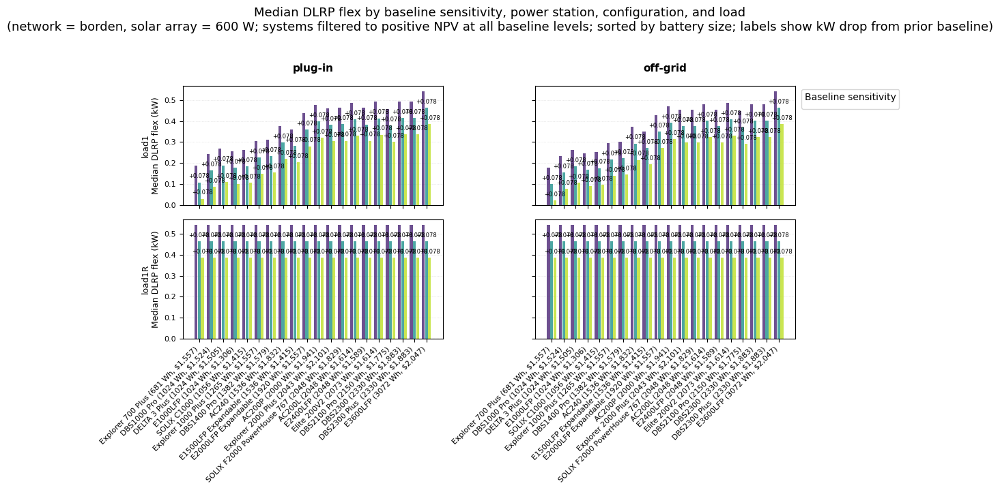

Saved: results/final_aug17/baseline/dlrp flex by baseline sensitivity per power station per config per load borden pv600W 20260824_220911.png


In [388]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

NETWORK = "borden"  # <-- set the network to filter to
CONFIGS = [(True, "plug-in"), (False, "off-grid")]

dlrp_cols = [f"DLRP_b{b}" for b in BASELINE_VALS]

available_pv = sorted(dlrp_dfs[LOADS_ORDER[0]]["pv"].unique())
if PV_ARRAY_W not in available_pv:
    raise ValueError(f"pv={PV_ARRAY_W} not found; available values: {available_pv}")

available_networks = sorted(dlrp_dfs[LOADS_ORDER[0]]["network"].unique())
if NETWORK not in available_networks:
    raise ValueError(f"network={NETWORK!r} not found; available values: {available_networks}")

bat_wh_lookup = hardware_df.set_index("Model")["Battery Wh"].to_dict()

# capex is a modeled system cost (power station + this PV array), so pull it
# from combined_df at this pvW rather than from hardware_df's raw retail price
capex_lookup = (
    combined_df[combined_df["pvW"] == PV_ARRAY_W]
    .groupby("batModel")["capex"]
    .median()
    .to_dict()
)

# power stations present (at this pv size + network) for at least one load/config, sorted by battery Wh
all_stations = set()
for load in LOADS_ORDER:
    filt = dlrp_dfs[load][
        (dlrp_dfs[load]["pv"] == PV_ARRAY_W) &
        (dlrp_dfs[load]["network"] == NETWORK)
    ]
    all_stations.update(filt["batModel"].unique())
POWER_STATIONS = sorted(all_stations, key=lambda ps: bat_wh_lookup.get(ps, float("inf")))

_cmap = plt.cm.viridis(np.linspace(0.1, 0.9, len(BASELINE_VALS)))
BASELINE_COLORS = {b: _cmap[i] for i, b in enumerate(BASELINE_VALS)}

n_baselines = len(BASELINE_VALS)
bar_width = 0.8 / n_baselines
x = np.arange(len(POWER_STATIONS))

fig, axs = plt.subplots(2, len(CONFIGS),
                         figsize=(6 * len(CONFIGS), 3.5 * len(LOADS_ORDER)),
                         sharex=True, sharey="row")
if len(LOADS_ORDER) == 1:
    axs = axs.reshape(1, -1)

for row, load in enumerate(LOADS_ORDER):
    for col, (mi, config_label) in enumerate(CONFIGS):
        ax = axs[row, col]
        filt = dlrp_dfs[load][
            (dlrp_dfs[load]["pv"] == PV_ARRAY_W) &
            (dlrp_dfs[load]["network"] == NETWORK) &
            (dlrp_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")

        # medians per baseline level, per power station -- needed both for the bars
        # and for computing the drop between consecutive baseline levels
        medians_by_b = {}
        for b in BASELINE_VALS:
            col_name = f"DLRP_b{b}"
            medians_by_b[b] = [filt.loc[filt.index == ps, col_name].median() if ps in filt.index else np.nan
                                for ps in POWER_STATIONS]

        for i, b in enumerate(BASELINE_VALS):
            medians = medians_by_b[b]
            bar_positions = x - 0.4 + bar_width * (i + 0.5)
            ax.bar(bar_positions, medians, width=bar_width * 0.9,
                   color=BASELINE_COLORS[b], alpha=0.8,
                   label=str(b) if row == 0 and col == 0 else None)

            # annotate the absolute DLRP flex drop from the PREVIOUS baseline level, on this bar
            if i > 0:
                prev_medians = medians_by_b[BASELINE_VALS[i - 1]]
                for bp, med, prev_med in zip(bar_positions, medians, prev_medians):
                    if not np.isnan(med) and not np.isnan(prev_med):
                        dlrp_drop = prev_med - med
                        ax.annotate(f"{dlrp_drop:+.3f}", xy=(bp, med), xytext=(0, 3),
                                    textcoords="offset points", ha="center", va="bottom",
                                    fontsize=6, color="black")

        ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
        ax.set_xticks(x)
        # label each power station on a single line: name, battery size (Wh), system capex ($)
        xtick_labels = [
            f"{ps.replace('_', ' ')} "
            f"({bat_wh_lookup.get(ps, float('nan')):.0f} Wh, ${capex_lookup.get(ps, float('nan')):,.0f})"
            for ps in POWER_STATIONS
        ]
        ax.set_xticklabels(xtick_labels, rotation=45, ha="right", fontsize=8)
        if col == 0:
            ax.set_ylabel(f"{load.replace('_', ' ')}\nMedian DLRP flex (kW)", fontsize=9)
        if row == 0:
            ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
        ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
        ax.set_axisbelow(True)
        ax.tick_params(axis="y", labelsize=8)

axs[0, -1].legend(title="Baseline sensitivity", loc="upper left",
                   bbox_to_anchor=(1.01, 1.0), fontsize=8)

fig.suptitle(f"Median DLRP flex by baseline sensitivity, power station, configuration, and load\n"
             f"(network = {NETWORK}, solar array = {PV_ARRAY_W} W; systems filtered to positive NPV "
             f"at all baseline levels; sorted by battery size; labels show kW drop from prior baseline)",
             fontsize=13, y=1.02)
fig.tight_layout()

filename = f"results/{directory}{sd}dlrp flex by baseline sensitivity per power station per config per load {NETWORK} pv{PV_ARRAY_W}W {timestamp}.png"
fig.savefig(filename, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

#### Decompose NPV

In [399]:
# this is all from the model
realDiscountRate = 0.03 # 3% real rate
discountRate = realDiscountRate

def discountIt(v, y, r=discountRate):
    return v / (1 + r)**y

# args: capex, grid value, dr value
def getNPV(c, g, dr):
    subC = -1 * c
    npv = {'without_surplus': subC, 'with_surplus': subC}
    wl = min(10, len(dr))
    
    for y in range(wl):
        cashFlow = g['avoidedGridkWhAC_value'][y] - g['requiredGridkWhAC_cost'][y] - g['eventGridChargekWhAC_cost'][y] + dr[y]
        npv['without_surplus'] += discountIt(cashFlow, y)
        npv['with_surplus'] += discountIt(cashFlow + g['ann_surpluskWhAC_value'][y], y)
    return npv

In [400]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

SURPLUS_KEY = "with_surplus"

def compute_npv_components(df, load, surplus_key=SURPLUS_KEY):
    """Split each row's NPV into capex-free grid value, CSRP income, and DLRP
    income, using getNPV(). Assumes getNPV is additive in its drIncome argument
    (no cross-term between grid value, CSRP, and DLRP)."""
    gv_col = f"gridValue_{load}"
    csrp_col = f"csrpLoad{load[4:]}Income"
    dlrp_col = f"dlrpLoad{load[4:]}Income"

    def _row(row):
        gridValue = row[gv_col]
        csrpIncome = row[csrp_col]
        dlrpIncome = row[dlrp_col]
        zero_dr = [0.0] * len(csrpIncome)

        def gv(d):
            return d.get(surplus_key) if isinstance(d, dict) else d

        grid_baseline = gv(getNPV(0, gridValue, zero_dr))       # pure PV(grid), no capex, no DR
        csrp_only = gv(getNPV(0, gridValue, csrpIncome))
        dlrp_only = gv(getNPV(0, gridValue, dlrpIncome))

        return pd.Series({
            "NPV_grid_gross": grid_baseline,
            "NPV_csrp": csrp_only - grid_baseline,
            "NPV_dlrp": dlrp_only - grid_baseline,
        })

    return df.apply(_row, axis=1)

component_dfs = {}  # load -> pivoted DataFrame with NPV_grid_gross_b*, NPV_csrp_b*, NPV_dlrp_b* columns

for load in LOADS_ORDER:
    comp = compute_npv_components(base_df, load)
    load_df = pd.concat([base_df[SYSTEM_ID_COLS + ["baselineSensitivity"]], comp], axis=1)

    pivot_df = load_df.pivot_table(
        index=SYSTEM_ID_COLS,
        columns="baselineSensitivity",
        values=["NPV_grid_gross", "NPV_csrp", "NPV_dlrp"],
        aggfunc="first"
    )
    pivot_df.columns = [f"{val}_b{b}" for val, b in pivot_df.columns]
    pivot_df = pivot_df.reset_index().rename(columns={"pvW": "pv"})

    key_cols = ["batModel", "network", "microinverter", "pv", "batWh", "az", "immediateEventAmt"]
    qualifying_keys = qualifying_dfs[load][key_cols].drop_duplicates()
    component_dfs[load] = pivot_df.merge(qualifying_keys, on=key_cols, how="inner")

    print(f"[{load}] {len(component_dfs[load])} qualifying systems, NPV decomposed into grid + CSRP + DLRP")

[load1] 318 qualifying systems, NPV decomposed into grid + CSRP + DLRP
[load1R] 325 qualifying systems, NPV decomposed into grid + CSRP + DLRP


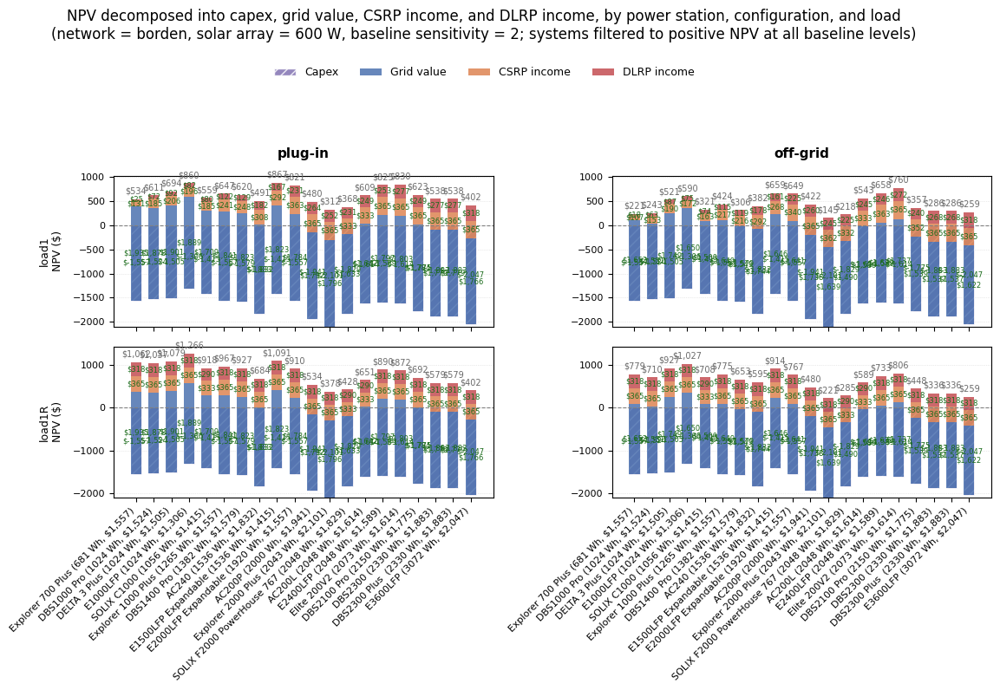

Saved: results/final_aug17/baseline/npv decomposed capex grid csrp dlrp borden pv600W baseline2 20260824_234341.png


In [403]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

CAPEX_COLOR = "#8172b2"
GRID_COLOR = "#4c72b0"
CSRP_COLOR = "#dd8452"
DLRP_COLOR = "#c44e52"
LABEL_COLOR = "#1a6b1a"  # dark green
NEGATIVE_HATCH = "///"
REFERENCE_BASELINE = BASELINE_VALS[2]  # <-- which baseline sensitivity level to decompose

bat_wh_lookup = hardware_df.set_index("Model")["Battery Wh"].to_dict()
capex_lookup = (
    combined_df[combined_df["pvW"] == PV_ARRAY_W]
    .groupby("batModel")["capex"]
    .median()
    .to_dict()
)

all_stations = set()
for load in LOADS_ORDER:
    filt = component_dfs[load][
        (component_dfs[load]["pv"] == PV_ARRAY_W) &
        (component_dfs[load]["network"] == NETWORK)
    ]
    all_stations.update(filt["batModel"].unique())
POWER_STATIONS = sorted(all_stations, key=lambda ps: bat_wh_lookup.get(ps, float("inf")))

x = np.arange(len(POWER_STATIONS))
bar_width = 0.6

fig, axs = plt.subplots(len(LOADS_ORDER), len(CONFIGS),
                         figsize=(6 * len(CONFIGS), 3.5 * len(LOADS_ORDER)),
                         sharex=True, sharey="row")
if len(LOADS_ORDER) == 1:
    axs = axs.reshape(1, -1)

for row, load in enumerate(LOADS_ORDER):
    for col, (mi, config_label) in enumerate(CONFIGS):
        ax = axs[row, col]
        filt = component_dfs[load][
            (component_dfs[load]["pv"] == PV_ARRAY_W) &
            (component_dfs[load]["network"] == NETWORK) &
            (component_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")

        capex_vals, grid_vals, csrp_vals, dlrp_vals = [], [], [], []
        for ps in POWER_STATIONS:
            rows = filt.loc[filt.index == ps,
                             [f"NPV_grid_gross_b{REFERENCE_BASELINE}",
                              f"NPV_csrp_b{REFERENCE_BASELINE}",
                              f"NPV_dlrp_b{REFERENCE_BASELINE}"]]
            capex_val = capex_lookup.get(ps, np.nan)
            if len(rows) == 0 or np.isnan(capex_val):
                capex_vals.append(np.nan)
                grid_vals.append(np.nan)
                csrp_vals.append(np.nan)
                dlrp_vals.append(np.nan)
            else:
                if len(rows) > 1:
                    print(f"WARNING: {ps} has {len(rows)} rows at network={NETWORK}, pv={PV_ARRAY_W}, "
                          f"mi={mi} -- expected exactly 1")
                capex_vals.append(-capex_val)
                grid_vals.append(rows[f"NPV_grid_gross_b{REFERENCE_BASELINE}"].iloc[0])
                csrp_vals.append(rows[f"NPV_csrp_b{REFERENCE_BASELINE}"].iloc[0])
                dlrp_vals.append(rows[f"NPV_dlrp_b{REFERENCE_BASELINE}"].iloc[0])

        # waterfall: capex, grid, CSRP, DLRP -- each stacked on the running total
        # from the previous segment, so the top of the stack always equals NPV
        for xi, c, g, cs, dl in zip(x, capex_vals, grid_vals, csrp_vals, dlrp_vals):
            if any(np.isnan(v) for v in (c, g, cs, dl)):
                continue
            running = 0.0
            for val, color in [(c, CAPEX_COLOR), (g, GRID_COLOR), (cs, CSRP_COLOR), (dl, DLRP_COLOR)]:
                bottom = running
                running += val
                ax.bar(xi, val, width=bar_width, bottom=bottom, color=color, alpha=0.85,
                       hatch=NEGATIVE_HATCH if val < 0 else None,
                       edgecolor="white" if val < 0 else None, linewidth=0.6 if val < 0 else 0)
                ax.annotate(f"${val:,.0f}", xy=(xi, bottom + val / 2), ha="center", va="center",
                            fontsize=6, color=LABEL_COLOR)

        # total NPV label at the very top of the stack
        for xi, c, g, cs, dl in zip(x, capex_vals, grid_vals, csrp_vals, dlrp_vals):
            if not any(np.isnan(v) for v in (c, g, cs, dl)):
                total = c + g + cs + dl
                ax.annotate(f"${total:,.0f}", xy=(xi, total), xytext=(0, 3),
                            textcoords="offset points", ha="center", va="bottom",
                            fontsize=7, color="dimgray")

        ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
        ax.set_xticks(x)
        xtick_labels = [
            f"{ps.replace('_', ' ')} "
            f"({bat_wh_lookup.get(ps, float('nan')):.0f} Wh, ${capex_lookup.get(ps, float('nan')):,.0f})"
            for ps in POWER_STATIONS
        ]
        ax.set_xticklabels(xtick_labels, rotation=45, ha="right", fontsize=8)
        if col == 0:
            ax.set_ylabel(f"{load.replace('_', ' ')}\nNPV ($)", fontsize=9, labelpad=8)
        ax.yaxis.set_tick_params(labelleft=True)  # force y tick labels visible even with sharey
        if row == 0:
            ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
        ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
        ax.set_axisbelow(True)
        ax.tick_params(axis="y", labelsize=8)

legend_handles = [
    plt.Rectangle((0, 0), 1, 1, facecolor=CAPEX_COLOR, alpha=0.85, hatch=NEGATIVE_HATCH,
                  edgecolor="white", label="Capex"),
    plt.Rectangle((0, 0), 1, 1, facecolor=GRID_COLOR, alpha=0.85, label="Grid value"),
    plt.Rectangle((0, 0), 1, 1, facecolor=CSRP_COLOR, alpha=0.85, label="CSRP income"),
    plt.Rectangle((0, 0), 1, 1, facecolor=DLRP_COLOR, alpha=0.85, label="DLRP income"),
]
fig.legend(handles=legend_handles, loc="upper center", bbox_to_anchor=(0.5, 1.05),
           ncol=4, fontsize=9, frameon=False)

fig.suptitle(f"NPV decomposed into capex, grid value, CSRP income, and DLRP income, by power station, "
             f"configuration, and load\n(network = {NETWORK}, solar array = {PV_ARRAY_W} W, "
             f"baseline sensitivity = {REFERENCE_BASELINE}; systems filtered to positive NPV at all "
             f"baseline levels)",
             fontsize=12, y=1.13)
fig.tight_layout(rect=[0.03, 0, 1, 1])  # reserve left margin so y-labels aren't clipped

filename = f"results/{directory}{sd}npv decomposed capex grid csrp dlrp {NETWORK} pv{PV_ARRAY_W}W baseline{REFERENCE_BASELINE} {timestamp}.png"
fig.savefig(filename, dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

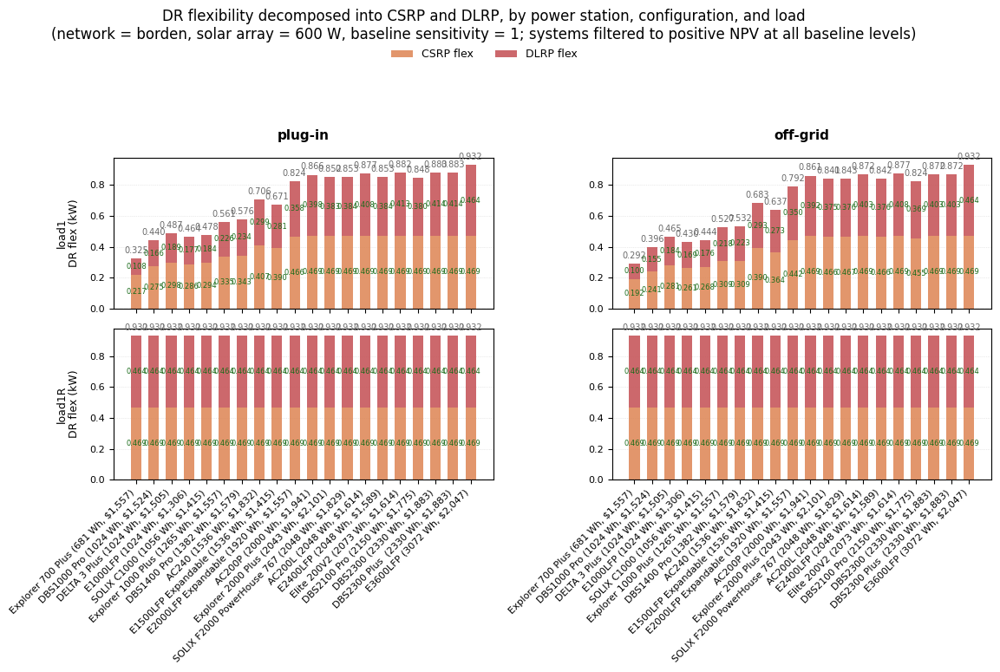

Saved: results/final_aug17/baseline/dr flex decomposed csrp dlrp borden pv600W baseline1 20260824_222043.png


In [392]:
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

CSRP_COLOR = "#dd8452"
DLRP_COLOR = "#c44e52"
LABEL_COLOR = "#1a6b1a"  # dark green
REFERENCE_BASELINE = BASELINE_VALS[1]  # <-- which baseline sensitivity level to show

bat_wh_lookup = hardware_df.set_index("Model")["Battery Wh"].to_dict()
capex_lookup = (
    combined_df[combined_df["pvW"] == PV_ARRAY_W]
    .groupby("batModel")["capex"]
    .median()
    .to_dict()
)

all_stations = set()
for load in LOADS_ORDER:
    filt = csrp_dfs[load][
        (csrp_dfs[load]["pv"] == PV_ARRAY_W) &
        (csrp_dfs[load]["network"] == NETWORK)
    ]
    all_stations.update(filt["batModel"].unique())
POWER_STATIONS = sorted(all_stations, key=lambda ps: bat_wh_lookup.get(ps, float("inf")))

x = np.arange(len(POWER_STATIONS))
bar_width = 0.6

fig, axs = plt.subplots(len(LOADS_ORDER), len(CONFIGS),
                         figsize=(6 * len(CONFIGS), 3.5 * len(LOADS_ORDER)),
                         sharex=True, sharey="row")
if len(LOADS_ORDER) == 1:
    axs = axs.reshape(1, -1)

for row, load in enumerate(LOADS_ORDER):
    for col, (mi, config_label) in enumerate(CONFIGS):
        ax = axs[row, col]
        csrp_filt = csrp_dfs[load][
            (csrp_dfs[load]["pv"] == PV_ARRAY_W) &
            (csrp_dfs[load]["network"] == NETWORK) &
            (csrp_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")
        dlrp_filt = dlrp_dfs[load][
            (dlrp_dfs[load]["pv"] == PV_ARRAY_W) &
            (dlrp_dfs[load]["network"] == NETWORK) &
            (dlrp_dfs[load]["microinverter"] == mi)
        ].set_index("batModel")

        csrp_vals, dlrp_vals = [], []
        for ps in POWER_STATIONS:
            c_rows = csrp_filt.loc[csrp_filt.index == ps, f"CSRP_b{REFERENCE_BASELINE}"]
            d_rows = dlrp_filt.loc[dlrp_filt.index == ps, f"DLRP_b{REFERENCE_BASELINE}"]
            if len(c_rows) == 0 or len(d_rows) == 0:
                csrp_vals.append(np.nan)
                dlrp_vals.append(np.nan)
            else:
                if len(c_rows) > 1 or len(d_rows) > 1:
                    print(f"WARNING: {ps} has {len(c_rows)} CSRP rows / {len(d_rows)} DLRP rows at "
                          f"network={NETWORK}, pv={PV_ARRAY_W}, mi={mi} -- expected exactly 1 each")
                csrp_vals.append(c_rows.iloc[0])
                dlrp_vals.append(d_rows.iloc[0])

        # stack CSRP then DLRP so the top of the bar equals total DR flex
        for xi, cs, dl in zip(x, csrp_vals, dlrp_vals):
            if np.isnan(cs) or np.isnan(dl):
                continue
            ax.bar(xi, cs, width=bar_width, bottom=0, color=CSRP_COLOR, alpha=0.85)
            ax.bar(xi, dl, width=bar_width, bottom=cs, color=DLRP_COLOR, alpha=0.85)
            ax.annotate(f"{cs:.3f}", xy=(xi, cs / 2), ha="center", va="center",
                        fontsize=6, color=LABEL_COLOR)
            ax.annotate(f"{dl:.3f}", xy=(xi, cs + dl / 2), ha="center", va="center",
                        fontsize=6, color=LABEL_COLOR)
            total = cs + dl
            ax.annotate(f"{total:.3f}", xy=(xi, total), xytext=(0, 3),
                        textcoords="offset points", ha="center", va="bottom",
                        fontsize=7, color="dimgray")

        ax.axhline(0, color="gray", linewidth=0.8, linestyle="--")
        ax.set_xticks(x)
        xtick_labels = [
            f"{ps.replace('_', ' ')} "
            f"({bat_wh_lookup.get(ps, float('nan')):.0f} Wh, ${capex_lookup.get(ps, float('nan')):,.0f})"
            for ps in POWER_STATIONS
        ]
        ax.set_xticklabels(xtick_labels, rotation=45, ha="right", fontsize=8)
        if col == 0:
            ax.set_ylabel(f"{load.replace('_', ' ')}\nDR flex (kW)", fontsize=9, labelpad=8)
        ax.yaxis.set_tick_params(labelleft=True)
        if row == 0:
            ax.set_title(config_label, fontsize=11, fontweight="bold", pad=15)
        ax.grid(True, axis="y", linestyle=":", linewidth=0.5, alpha=0.5, zorder=0)
        ax.set_axisbelow(True)
        ax.tick_params(axis="y", labelsize=8)

legend_handles = [
    plt.Rectangle((0, 0), 1, 1, facecolor=CSRP_COLOR, alpha=0.85, label="CSRP flex"),
    plt.Rectangle((0, 0), 1, 1, facecolor=DLRP_COLOR, alpha=0.85, label="DLRP flex"),
]
fig.legend(handles=legend_handles, loc="upper center", bbox_to_anchor=(0.5, 1.05),
           ncol=2, fontsize=9, frameon=False)

fig.suptitle(f"DR flexibility decomposed into CSRP and DLRP, by power station, configuration, and load\n"
             f"(network = {NETWORK}, solar array = {PV_ARRAY_W} W, baseline sensitivity = {REFERENCE_BASELINE}; "
             f"systems filtered to positive NPV at all baseline levels)",
             fontsize=12, y=1.1)
fig.tight_layout(rect=[0.03, 0, 1, 1])

filename = f"results/{directory}{sd}dr flex decomposed csrp dlrp {NETWORK} pv{PV_ARRAY_W}W baseline{REFERENCE_BASELINE} {timestamp}.png"
fig.savefig(filename, dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved: {filename}")

# Plug-in Only Analysis

must be run after the stuff in Analyze Results


In [144]:
pvComp = 800

In [145]:
sComp_results_df=s_results_df[s_results_df["microinverter"] == True]
#s_results_df=s_results_df[s_results_df["NPV"] >= 0]

sComp_results_df= sComp_results_df[(sComp_results_df['pvW']==pvComp) & (sComp_results_df['az']==180) & (sComp_results_df['baselineSensitivity']==0)]

In [146]:
# filter out mi=false and withoutSurplus # plug-in only - must be run after the stuff in Analyze Results
# Network comparison: with-surplus, plug-in only, 8 metrics,
# filtered to 0 <= NPV -- summary table (min/mean/median/max), all networks combined
scenarios = [
    (load, mi, sk)
    for load in LOADS
    for mi in [True]                 # plug-in only
    for sk in SURPLUS_KEYS
    if sk != "without_surplus"       # drop withoutSurplus
]
all_rows = METRICS + FLEX_ROW_LABELS + SCALAR_METRICS + VALUE_METRICS  # 8 metrics, uses generic flex labels
stats = ["min", "mean", "median", "max"]

# build a MultiIndex column structure: (scenario_label, stat)
scenario_labels = [f"{load}|mi={mi}|{sk}" for (load, mi, sk) in scenarios]
columns = pd.MultiIndex.from_product([scenario_labels, stats], names=["scenario", "stat"])
summary_df = pd.DataFrame(index=all_rows, columns=columns, dtype=float)
n_counts = {}  # track n_after/n_before per scenario for reference

for col_idx, (load, mi, sk) in enumerate(scenarios):
    scenario_label = scenario_labels[col_idx]
    subset = sComp_results_df[sComp_results_df["microinverter"] == mi]
    npv = extract_metric(subset, load, "NPV", sk)
    favorable = subset[npv >= 0]
    favorable = favorable[favorable['immediateEventAmt'] == iEA]  # filter by immediate event amount
    favorable = favorable[favorable['az'] == az]  # filter by azimuth
    n_before, n_after = len(subset), len(favorable)
    n_counts[scenario_label] = (n_after, n_before)

    for c in favorable.columns:
        if ('IRR_' not in c) and ('IRR' in c):
            favorable[c] = favorable[c].apply(scale_irr_dict)

    for metric in all_rows:
        vals = get_metric_values(favorable, load, metric, sk).dropna()
        if len(vals):
            summary_df.loc[metric, (scenario_label, "min")] = vals.min()
            summary_df.loc[metric, (scenario_label, "mean")] = vals.mean()
            summary_df.loc[metric, (scenario_label, "median")] = vals.median()
            summary_df.loc[metric, (scenario_label, "max")] = vals.max()
        else:
            summary_df.loc[metric, scenario_label] = np.nan

# round for readability
summary_df = summary_df.round(3)

# --- build a display-only copy with underscores swapped for spaces ---
display_df = summary_df.copy()
display_df.index = [str(i).replace('_', ' ') for i in display_df.index]
display_df.columns = pd.MultiIndex.from_tuples(
    [(str(scen).replace('_', ' '), str(stat).replace('_', ' ')) for scen, stat in display_df.columns],
    names=["scenario", "stat"]
)

# display in notebook
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
display(display_df)

# also print n counts for reference (labels with spaces instead of underscores)
print("\nSample sizes (n_after favorable / n_before) per scenario:")
for label, (n_after, n_before) in n_counts.items():
    print(f"  {label.replace('_', ' ')}: {n_after}/{n_before}")

# save to CSV with timestamp (raw underscore version, to preserve exact keys/labels)
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/{directory}{d}network_comparison_summary_pluginonly_withsurplus_i{iEA}_a{az}_posNPV_{timestamp}.csv"
summary_df.to_csv(out_path)
print(f"\nSaved summary table to: {out_path}")

scenario  load1|mi=True|with surplus                                \
stat                             min      mean    median       max   
NPV                         1682.836  1682.836  1682.836  1682.836   
IRR                           38.474    38.474    38.474    38.474   
PBP                            3.383     3.383     3.383     3.383   
LCOSS                          0.092     0.092     0.092     0.092   
csrp flex                      0.000     0.000     0.000     0.000   
dlrp flex                      0.000     0.000     0.000     0.000   
pvW                          800.000   800.000   800.000   800.000   
batWh                          0.000     0.000     0.000     0.000   
pctDR                          0.000     0.000     0.000     0.000   

scenario  load2|mi=True|with surplus                                \
stat                             min      mean    median       max   
NPV                         1682.836  1682.836  1682.836  1682.836   
IRR                           38.474    38.474    38.474    38.474   
PBP                            3.383     3.383     3.383     3.383   
LCOSS                          0.092     0.092     0.092     0.092   
csrp flex                      0.000     0.000     0.000     0.000   
dlrp flex                      0.000     0.000     0.000     0.000   
pvW                          800.000   800.000   800.000   800.000   
batWh                          0.000     0.000     0.000     0.000   
pctDR                          0.000     0.000     0.000     0.000   

scenario  load1R|mi=True|with surplus                                
stat                              min      mean    median       max  
NPV                          1682.836  1682.836  1682.836  1682.836  
IRR                            38.474    38.474    38.474    38.474  
PBP                             3.383     3.383     3.383     3.383  
LCOSS                           0.092     0.092     0.092     0.092  
csrp flex                       0.000     0.000     0.000     0.000  
dlrp flex                       0.000     0.000     0.000     0.000  
pvW                           800.000   800.000   800.000   800.000  
batWh                           0.000     0.000     0.000     0.000  
pctDR                           0.000     0.000     0.000     0.000


Sample sizes (n_after favorable / n_before) per scenario:
  load1|mi=True|with surplus: 8/8
  load2|mi=True|with surplus: 8/8
  load1R|mi=True|with surplus: 8/8

Saved summary table to: results/final_aug17/primary_w_azimuth/network_comparison_summary_pluginonly_withsurplus_i0_a180_posNPV_20260823_181542.csv


In [147]:
sComp_results_df

,network,eventStart,dlrp_rate,csrp_rate,az,pvW,microinverter,batModel,batWh,batWhAC_80p,effEff,capex,cycles,lifespan,workingLife,dailyPVWhAC_4M,annualPVkWhDC_degraded,annualPVkWhAC_degraded,immediateEventAmt,baselineSensitivity,csrpMaxFlex,csrpLoad1_flex,csrpLoad2_flex,csrpLoad1replacement_flex,csrpLoad1Income,csrpLoad2Income,csrpLoad1RIncome,csrpLoad1_baseline,csrpLoad2_baseline,csrpLoad1replacement_baseline,dlrpMaxFlex,dlrpLoad1_flex,dlrpLoad2_flex,dlrpLoad1replacement_flex,dlrpLoad1Income,dlrpLoad2Income,dlrpLoad1RIncome,dlrpLoad1_baseline,dlrpLoad2_baseline,dlrpLoad1replacement_baseline,annDRIncomeLoad1,annDRIncomeLoad2,annDRIncomeLoad1R,gridValue_load1,gridValue_load2,gridValue_load1R,load1_PBP_capexSensitivity,load2_PBP_capexSensitivity,load1R_PBP_capexSensitivity,load1_NPV_capexSensitivity,load2_NPV_capexSensitivity,load1R_NPV_capexSensitivity,load1_IRR_capexSensitivity,load2_IRR_capexSensitivity,load1R_IRR_capexSensitivity,load1_LCOSS_capexSensitivity,load2_LCOSS_capexSensitivity,load1R_LCOSS_capexSensitivity,load1_NPV,load1_PBP,load1_IRR,load1_LCOSS,load2_NPV,load2_PBP,load2_IRR,load2_LCOSS,load1R_NPV,load1R_PBP,load1R_IRR,load1R_LCOSS
138,bowling green,11,18,18,180,800,True,NaN,0,0,0,1057.753288,0,10,10,"[88.58132163477876, 4422.898730379718, 2764.89...",False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,{'avg_hourly_surpluskWAC_byMonth': [0.15509379...,{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,"{-0.2: {'without_surplus': 13.16007525670882, ...","{-0.2: {'without_surplus': 9.976184851617754, ...","{-0.2: {'without_surplus': 13.16007525670882, ...",{-0.2: {'without_surplus': -283.33669586440516...,{-0.2: {'without_surplus': -104.16822379264505...,{-0.2: {'without_surplus': -283.33669586440516...,{-0.2: {'without_surplus': -0.0549701693654061...,{-0.2: {'without_surplus': 0.00051364809274667...,{-0.2: {'without_surplus': -0.0549701693654061...,{-0.2: {'without_surplus': 0.32623288232650144...,"{-0.2: {'without_surplus': 0.2475666930430937,...",{-0.2: {'without_surplus': 0.32623288232650144...,"{'without_surplus': -494.8873533644052, 'with_...","{'without_surplus': 16.450094070886024, 'with_...","{'without_surplus': -0.09425644069910052, 'wit...","{'without_surplus': 0.4475350649646181, 'with_...","{'without_surplus': -315.71888129264494, 'with...","{'without_surplus': 12.47023106452219, 'with_s...","{'without_surplus': -0.04464191645383841, 'wit...","{'without_surplus': 0.33961866524304135, 'with...","{'without_surplus': -494.8873533644052, 'with_...","{'without_surplus': 16.450094070886024, 'with_...","{'without_surplus': -0.09425644069910052, 'wit...","{'without_surplus': 0.4475350649646181, 'with_..."
354,borden,14,18,18,180,800,True,NaN,0,0,0,1057.753288,0,10,10,"[88.58132163477876, 4422.898730379718, 2764.89...",False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,{'avg_hourly_surpluskWAC_byMonth': [0.15509379...,{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,"{-0.2: {'without_surplus': 10.865946386339854,...","{-0.2: {'without_surplus': 9.816038981530882, ...","{-0.2: {'without_surplus': 10.865946386339854,...",{-0.2: {'without_surplus': -164.77960952894398...,"{-0.2: {'without_surplus': -92.13993471096019,...",{-0.2: {'without_surplus': -164.77960952894398...,{-0.2: {'without_surplus': -0.0174715432524681...,{-0.2: {'without_surplus': 0.00401491731405252...,{-0.2: {'without_surplus': -0.0174715432524681...,{-0.2: {'without_surplus': 0.26954777678410213...,"{-0.2: {'without_surplus': 0.2436344634164927,...",{-0.2: {'without_surplus': 0.26954777678410213...,"{'without_surplus': -376.330267028944, 'with_s...","{'without_surplus': 13.582432982924816, 'with_...","{'without_surplus': -0.06063574045896535, '

In [158]:
# the NPVs with surplus are all the same
for r in sComp_results_df['load1_NPV']:
    print(r['with_surplus'])

sComp_results_df

1682.8355595249557
1682.835559524956
1682.835559524956
1682.835559524956
1682.8355595249557
1682.835559524956
1682.835559524956
1682.8355595249557


,network,eventStart,dlrp_rate,csrp_rate,az,pvW,microinverter,batModel,batWh,batWhAC_80p,effEff,capex,cycles,lifespan,workingLife,dailyPVWhAC_4M,annualPVkWhDC_degraded,annualPVkWhAC_degraded,immediateEventAmt,baselineSensitivity,csrpMaxFlex,csrpLoad1_flex,csrpLoad2_flex,csrpLoad1replacement_flex,csrpLoad1Income,csrpLoad2Income,csrpLoad1RIncome,csrpLoad1_baseline,csrpLoad2_baseline,csrpLoad1replacement_baseline,dlrpMaxFlex,dlrpLoad1_flex,dlrpLoad2_flex,dlrpLoad1replacement_flex,dlrpLoad1Income,dlrpLoad2Income,dlrpLoad1RIncome,dlrpLoad1_baseline,dlrpLoad2_baseline,dlrpLoad1replacement_baseline,annDRIncomeLoad1,annDRIncomeLoad2,annDRIncomeLoad1R,gridValue_load1,gridValue_load2,gridValue_load1R,load1_PBP_capexSensitivity,load2_PBP_capexSensitivity,load1R_PBP_capexSensitivity,load1_NPV_capexSensitivity,load2_NPV_capexSensitivity,load1R_NPV_capexSensitivity,load1_IRR_capexSensitivity,load2_IRR_capexSensitivity,load1R_IRR_capexSensitivity,load1_LCOSS_capexSensitivity,load2_LCOSS_capexSensitivity,load1R_LCOSS_capexSensitivity,load1_NPV,load1_PBP,load1_IRR,load1_LCOSS,load2_NPV,load2_PBP,load2_IRR,load2_LCOSS,load1R_NPV,load1R_PBP,load1R_IRR,load1R_LCOSS
138,bowling green,11,18,18,180,800,True,NaN,0,0,0,1057.753288,0,10,10,"[88.58132163477876, 4422.898730379718, 2764.89...",False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,{'avg_hourly_surpluskWAC_byMonth': [0.15509379...,{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,"{-0.2: {'without_surplus': 13.16007525670882, ...","{-0.2: {'without_surplus': 9.976184851617754, ...","{-0.2: {'without_surplus': 13.16007525670882, ...",{-0.2: {'without_surplus': -283.33669586440516...,{-0.2: {'without_surplus': -104.16822379264505...,{-0.2: {'without_surplus': -283.33669586440516...,{-0.2: {'without_surplus': -0.0549701693654061...,{-0.2: {'without_surplus': 0.00051364809274667...,{-0.2: {'without_surplus': -0.0549701693654061...,{-0.2: {'without_surplus': 0.32623288232650144...,"{-0.2: {'without_surplus': 0.2475666930430937,...",{-0.2: {'without_surplus': 0.32623288232650144...,"{'without_surplus': -494.8873533644052, 'with_...","{'without_surplus': 16.450094070886024, 'with_...","{'without_surplus': -0.09425644069910052, 'wit...","{'without_surplus': 0.4475350649646181, 'with_...","{'without_surplus': -315.71888129264494, 'with...","{'without_surplus': 12.47023106452219, 'with_s...","{'without_surplus': -0.04464191645383841, 'wit...","{'without_surplus': 0.33961866524304135, 'with...","{'without_surplus': -494.8873533644052, 'with_...","{'without_surplus': 16.450094070886024, 'with_...","{'without_surplus': -0.09425644069910052, 'wit...","{'without_surplus': 0.4475350649646181, 'with_..."
354,borden,14,18,18,180,800,True,NaN,0,0,0,1057.753288,0,10,10,"[88.58132163477876, 4422.898730379718, 2764.89...",False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,{'avg_hourly_surpluskWAC_byMonth': [0.15509379...,{'avg_hourly_surpluskWAC_byMonth': [0.17909005...,"{-0.2: {'without_surplus': 10.865946386339854,...","{-0.2: {'without_surplus': 9.816038981530882, ...","{-0.2: {'without_surplus': 10.865946386339854,...",{-0.2: {'without_surplus': -164.77960952894398...,"{-0.2: {'without_surplus': -92.13993471096019,...",{-0.2: {'without_surplus': -164.77960952894398...,{-0.2: {'without_surplus': -0.0174715432524681...,{-0.2: {'without_surplus': 0.00401491731405252...,{-0.2: {'without_surplus': -0.0174715432524681...,{-0.2: {'without_surplus': 0.26954777678410213...,"{-0.2: {'without_surplus': 0.2436344634164927,...",{-0.2: {'without_surplus': 0.26954777678410213...,"{'without_surplus': -376.330267028944, 'with_s...","{'without_surplus': 13.582432982924816, 'with_...","{'without_surplus': -0.06063574045896535, '

In [149]:
compare_results_df=results_df#[results_df["microinverter"] == True]
#s_results_df=s_results_df[s_results_df["NPV"] >= 0]

compare_results_df= compare_results_df[(compare_results_df['pvW']==pvComp) & (compare_results_df['az']==180) & (compare_results_df['baselineSensitivity']==0)]
# for r in compare_results_df['load1_NPV']:
#     print(r['with_surplus'])

In [150]:
# # find the row with the highest with-surplus NPV, broken out by load, network, and microinverter
# results = []

# for load in LOADS:
#     for mi in [True, False]:
#         subset = compare_results_df[compare_results_df["microinverter"] == mi]
#         npv_with_surplus = extract_metric(subset, load, "NPV", "with_surplus")
#         temp = subset.copy()
#         temp["_npv_with_surplus"] = npv_with_surplus

#         for network, group in temp.groupby("network"):
#             vals = group["_npv_with_surplus"].dropna()
#             if len(vals) == 0:
#                 continue
#             idx_max = vals.idxmax()
#             val_max = vals.loc[idx_max]
#             results.append({
#                 "load": load.replace('_', ' '),
#                 "network": network,
#                 "microinverter": mi,
#                 "NPV": round(val_max, 3),
#                 "row_index": idx_max
#             })

# summary = pd.DataFrame(results).sort_values(["network", "load", "microinverter"]).reset_index(drop=True)
# display(summary)

# # print in a readable format
# print("Highest with surplus NPV by load, network, and microinverter:")
# for _, r in summary.iterrows():
#     print(f"  {r['network']} | {r['load']} | microinverter={r['microinverter']}: {r['NPV']} (row {r['row_index']})")

In [151]:
# find the row with the highest with-surplus NPV, broken out by load, network, and microinverter,
# plus overall min and max shown separately for plug-in vs off-grid
results = []

for load in LOADS:
    for mi in [True, False]:
        subset = compare_results_df[compare_results_df["microinverter"] == mi]
        npv_with_surplus = extract_metric(subset, load, "NPV", "with_surplus")
        temp = subset.copy()
        temp["_npv_with_surplus"] = npv_with_surplus

        for network, group in temp.groupby("network"):
            vals = group["_npv_with_surplus"].dropna()
            if len(vals) == 0:
                continue
            idx_max = vals.idxmax()
            val_max = vals.loc[idx_max]
            results.append({
                "load": load.replace('_', ' '),
                "network": network,
                "microinverter": mi,
                "NPV": round(val_max, 3),
                "row_index": idx_max
            })

summary = pd.DataFrame(results).sort_values(["network", "load", "microinverter"]).reset_index(drop=True)
display(summary)

# overall min and max, shown separately for plug-in (mi=True) and off-grid (mi=False)
for mi, label in [(True, "plug-in"), (False, "off-grid")]:
    mi_summary = summary[summary["microinverter"] == mi]
    if len(mi_summary) == 0:
        print(f"\nNo data for {label} (microinverter={mi})")
        continue

    min_row = mi_summary.loc[mi_summary["NPV"].idxmin()]
    max_row = mi_summary.loc[mi_summary["NPV"].idxmax()]

    print(f"\n{label.capitalize()} (microinverter={mi}) — overall min:")
    print(f"  {min_row['network']} | {min_row['load']}: {min_row['NPV']} (row {min_row['row_index']})")

    print(f"{label.capitalize()} (microinverter={mi}) — overall max:")
    print(f"  {max_row['network']} | {max_row['load']}: {max_row['NPV']} (row {max_row['row_index']})")

,load,network,microinverter,NPV,row_index
0,load1,borden,False,1628.905,5374
1,load1,borden,True,1406.508,4039
2,load1R,borden,False,1781.561,5692
3,load1R,borden,True,1563.505,4039
4,load2,borden,False,1025.356,5692
5,load2,borden,True,798.528,5629
6,load1,bowling green,False,1627.899,1984
7,load1,bowling green,True,1440.203,649
8,load1R,bowling green,False,1780.024,2302
9,load1R,bowling green,True,1574.757,649



Plug-in (microinverter=True) — overall min:
  borden | load2: 798.528 (row 5629)
Plug-in (microinverter=True) — overall max:
  central bronx | load1R: 1946.686 (row 24379)

Off-grid (microinverter=False) — overall min:
  grasslands | load2: 968.751 (row 12472)
Off-grid (microinverter=False) — overall max:
  park slope | load1R: 1948.197 (row 19252)


In [201]:
# compare NPV between solar-only (s_results_df, single value) and solar+battery (results_df, min/mean/median/max),
# split by plug-in (mi=True) vs off-grid (mi=False), network, pvW, and az,
# with-surplus only (all without-surplus rows dropped)
stats = ["min", "mean", "median", "max"]
metric = "NPV"
NETWORK = "grasslands"  # <-- set the network you want to filter to
PV_W = 400              # <-- set the PV array size (W) you want to filter to
AZ = 180                 # <-- set the azimuth you want to filter to

results = []
for load in LOADS:
    for mi, mi_label in [(True, "plug-in"), (False, "off-grid")]:
        sk = "with_surplus"  # only surplus scenario kept
        row = {
            "load": load.replace('_', ' '),
            "microinverter": mi_label,
            "surplus": sk.replace('_', ' ')
        }

        # solar only: single value (all stats are identical, so just take one)
        s_subset = s_results_df[(s_results_df["microinverter"] == mi) & (s_results_df["network"] == NETWORK) & (s_results_df["pvW"] == PV_W) & (s_results_df["az"] == AZ)]
        s_vals = extract_metric(s_subset, load, metric, sk).dropna()
        row["solar only"] = round(s_vals.iloc[0], 3) if len(s_vals) else np.nan

        # solar + battery: full min/mean/median/max
        b_subset = results_df[(results_df["microinverter"] == mi) & (results_df["network"] == NETWORK) & (results_df["pvW"] == PV_W) & (results_df["az"] == AZ)]
        b_vals = extract_metric(b_subset, load, metric, sk).dropna()
        for s in stats:
            row[f"solar + battery {s}"] = round(getattr(b_vals, s)(), 3) if len(b_vals) else np.nan

        results.append(row)

comparison_df = pd.DataFrame(results).sort_values(["load", "microinverter"]).reset_index(drop=True)

# use a styled caption as a table header (renders above the column headers)
table_title = f"NPV Comparison: Solar Only vs Solar + Battery ({NETWORK.title()}, {PV_W}W PV, Az {AZ}, With Surplus)"
styled = comparison_df.style.set_caption(table_title).set_table_styles([
    {"selector": "caption", "props": [("font-size", "14px"), ("font-weight", "bold"), ("text-align", "left")]}
])
display(styled)

# save to CSV with timestamp
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
out_path = f"results/solar_vs_solarbattery_NPV_comparison_{NETWORK}_{PV_W}W_az{AZ}_withsurplus_{timestamp}.csv"
comparison_df.to_csv(out_path)
print(f"\nSaved comparison table to: {out_path}")

,load,microinverter,surplus,solar only,solar + battery min,solar + battery mean,solar + battery median,solar + battery max
0,load1,off-grid,with surplus,nan,-564.760000,93.005000,72.921000,503.750000
1,load1,plug-in,with surplus,806.623000,-609.622000,153.734000,159.319000,462.246000
2,load1R,off-grid,with surplus,nan,-476.038000,328.642000,397.756000,836.718000
3,load1R,plug-in,with surplus,806.623000,-524.084000,384.195000,469.067000,912.285000
4,load2,off-grid,with surplus,nan,-952.900000,-187.754000,-131.035000,328.689000
5,load2,plug-in,with surplus,806.623000,-1034.914000,-164.120000,-88.679000,352.864000



Saved comparison table to: results/solar_vs_solarbattery_NPV_comparison_grasslands_400W_az180_withsurplus_20260823_191355.csv
